In [1]:
import pandas as pd
import seaborn as sns
import numpy as np
import matplotlib.pyplot as plt
import os,sys, gc
import keras


dirpath = os.getcwd().split("code")[0]+"code/"
sys.path.append(dirpath)
from pre_process import clean_LC,generate_representation
from evaluation import calculate_metrics, evaluate_metadata, evaluate_metadata_raw


folder = "../../KOI_Data/"
folder_lc = "/work/work_teamEXOPLANET/KOI_LC/"

Using TensorFlow backend.


In [69]:
def impute_on_pandas(df):
    return df.fillna(df.median(),inplace=False)

df_meta = pd.read_csv(folder+"/kepler_dataset.csv")
all_labels = df_meta["NExScI Disposition"].values
mask_conf = (all_labels=="CONFIRMED")
mask_fp = (all_labels=="FALSE POSITIVE")
mask_cand = (all_labels=="CANDIDATE")

#NEW METADATA SELECTED!
metadata_used = ["Period", "Duration", "Time of Transit Epoch", "r/R", "a/R",
                 "Inclination", "Impact Parameter", 
                 "Fitted Stellar Density",
                 "Teq",
                 "Limb Darkening Coeff1", "Limb Darkening Coeff2",
                "Teff","Stellar Radius", "Stellar Mass"]
#dividir duration por 24??
df_meta["Duration"] = df_meta["Duration"]/24

#df_meta["Time of Transit Epoch"] = df_meta["Time of Transit Epoch"]- time_kepler[:,0] #modificacion

df_meta_obj = df_meta[metadata_used]
mask_nan = pd.isna(df_meta_obj)

df_meta_obj = impute_on_pandas(df_meta_obj)

df_meta_obj.head()

,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq,Limb Darkening Coeff1,Limb Darkening Coeff2,Teff,Stellar Radius,Stellar Mass
0,8.884923,0.086252,169.991686,0.114,36.466,89.89,0.069,11.62061,770.0,0.497,0.204,5332.0,0.843,0.821
1,5.092465,0.152458,357.535940,0.014,10.670,89.14,0.161,0.88510,844.0,0.551,0.165,5037.0,0.751,0.727
2,275.073650,0.140417,315.248600,0.014,512.000,89.93,0.595,33.55994,303.0,0.437,0.243,5604.0,1.187,0.864
3,8.460439,0.197288,133.774490,0.478,14.087,85.68,1.061,0.73874,804.0,0.299,0.306,5951.0,0.702,0.796
4,21.761298,0.051792,166.540438,0.032,137.070,89.95,0.123,102.86534,486.0,0.627,0.108,4859.0,0.720,0.781


In [48]:
df_sets = pd.read_csv(folder+"/koi_sets.csv") 
mask_train = (df_sets["Set"] == "Train").values
mask_test = (df_sets["Set"] == "Test").values
mask_unlabeled = (df_sets["Set"] == "Unlabeled").values

mask_train_conf = mask_train & mask_conf
mask_test_conf = mask_test & mask_conf

In [49]:
Y_train = df_meta_obj.values[mask_train_conf]
Y_test = df_meta_obj.values[mask_test_conf]
Y_train.shape

(1610, 14)

In [50]:
#pre-process: scale metadata
from sklearn.preprocessing import StandardScaler, RobustScaler
#scaler_meta = RobustScaler()
scaler_meta = StandardScaler()

Ystd_train = scaler_meta.fit_transform(Y_train)
Ystd_test = scaler_meta.transform(Y_test)

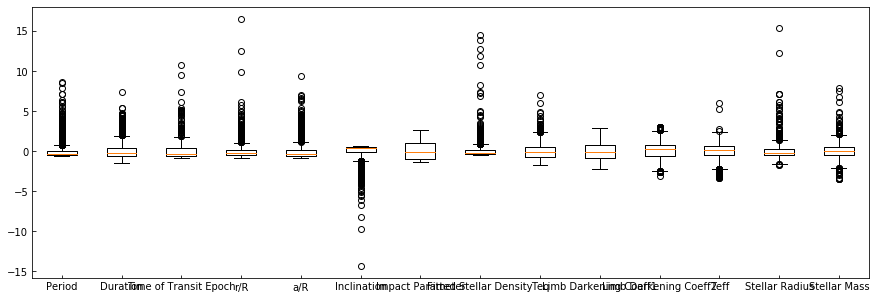

,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq,Limb Darkening Coeff1,Limb Darkening Coeff2,Teff,Stellar Radius,Stellar Mass
count,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03,1.610000e+03
mean,-6.619963e-17,7.833623e-16,5.957967e-15,-1.624649e-15,1.518178e-15,-6.771119e-14,1.331716e-15,6.024167e-16,-2.427320e-17,-2.641365e-15,2.371823e-14,2.250788e-16,-2.257408e-15,3.208476e-15
std,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00,1.000311e+00
min,-5.908227e-01,-1.450501e+00,-8.906004e-01,-8.851677e-01,-8.407552e-01,-1.431460e+01,-1.305204e+00,-5.335584e-01,-1.728111e+00,-2.258535e+00,-3.089904e+00,-3.395382e+00,-1.703084e+00,-3.525412e+00
25%,-4.821600e-01,-6.703882e-01,-5.516610e-01,-5.040630e-01,-5.662212e-01,-1.426957e-01,-1.045922e+00,-4.219073e-01,-7.441942e-01,-8.013483e-01,-5.591437e-01,-4.824721e-01,-4.884028e-01,-5.372881e-01
50%,-3.365976e-01,-2.669818e-01,-4.050554e-01,-2.076482e-01,-3.274285e-01,3.226130e-01,-8.717967e-02,-2.298973e-01,-1.479202e-01,-1.761280e-01,2.596318e-01,1.926621e-01,-1.801033e-01,9.894913e-03
75%,-1.750069e-03,3.716218e-01,3.663228e-01,1.311116e-01,1.281076e-01,5.689991e-01,9.582414e-01,8.804824e-02,4.921406e-01,7.206023e-01,7.062367e-01,6.795483e-01,2.726248e-01,5.044431e-01
max,8.616681e+00,7.401561e+00,1.070401e+01,1.647627e+01,9.296306e+00,6.317726e-01,2.614182e+00,1.447999e+01,7.011231e+00,2.932537e+00,2.983921e+00,5.973887e+00,1.529320e+01,7.896348e+00


In [51]:
### boxplot de las variables..
plt.figure(figsize=(15,5))
plt.boxplot(Ystd_train)
plt.xticks(np.arange(len(metadata_used))+1,metadata_used)
plt.show()
aux_df = pd.DataFrame(Ystd_train)
aux_df.columns = metadata_used
aux_df.describe()

In [7]:
### evaluar.. residuo + errores .
def get_res(x,xhat):
    return np.squeeze(x) - np.squeeze(xhat)

def RMSE_LC(x, xhat, res=[]):
    if len(res) == 0:
        res = get_res(x, xhat)
    return np.mean( np.sqrt(np.mean(np.square(res), axis=-1)) )

def MSE_LC(x, xhat, res=[]):
    if len(res) == 0:
        res = get_res(x, xhat)
    return np.mean(np.mean( np.square(res), axis=-1))

def MAE_LC(x, xhat, res=[]):
    if len(res) == 0:
        res = get_res(x, xhat)
    return np.mean( np.mean( np.abs(res), axis=-1))

def evaluate_reconst(x,xhat):
    print("----- EVALUANDO RECONSTRUCCION DE LA CURVA -----")
    res = get_res(x, xhat)
    plt.figure(figsize=(8,5))
    sns.distplot(res.flatten())
    plt.title("Distribucion de residuos promedio")
    plt.show()
    
    print("RMSE (+-)= ",RMSE_LC(None,None, res))
    print("MSE      = ",MSE_LC(None,None, res))
    print("MAE  (+-)= ",MAE_LC(None,None, res))

### Create dataset

In [8]:
T = 200
X_fold_lc = np.load("data/LC_global_%dT.npy"%T)
X_fold_lc_aug = np.load("data/LC_globalA_%dT.npy"%T)
X_fold_time = np.load("data/Time_global_%dT.npy"%T)
X_fold_lc.shape

(4317, 200)

In [9]:
mask_train = np.random.rand(X_fold_lc.shape[0])< 1#0.75
mask_test = ~mask_train

In [10]:
#X_train = np.concatenate([X_fold_lc[mask_train[mask_conf]], X_fold_lc_aug[mask_train[mask_conf]]], axis=0)
X_train_t = np.concatenate([X_fold_time[mask_train], X_fold_time[mask_train]], axis=0)
#X_train = np.concatenate([X_fold_lc[mask_train[mask_conf]], X_fold_lc_aug[mask_train[mask_conf]]], axis=0)
X_train = np.concatenate([X_fold_lc[mask_train], X_fold_lc_aug[mask_train]], axis=0)

if Ystd_train.shape[0] != X_train.shape[0]:
    Ystd_train = np.tile(Ystd_train, (2,1))

#X_test = X_fold_lc[mask_test[mask_conf]]
X_test = X_fold_lc[mask_test]
#X_test_t = X_fold_time[mask_test[mask_conf]]
X_test_t = X_fold_time[mask_test]

X_train = np.expand_dims(X_train, axis=-1)
X_test = np.expand_dims(X_test, axis=-1)

X_train_t = np.expand_dims(X_train_t, axis=-1)
X_test_t = np.expand_dims(X_test_t, axis=-1)

print("X train shape: ",X_train.shape)
print("X train time shape: ",X_train_t.shape)
print("X test shape: ",X_test.shape)
print("Y train shape: ",Ystd_train.shape)
print("Y test shape: ",Ystd_test.shape)

X train shape:  (8634, 200, 1)
X train time shape:  (8634, 200, 1)
X test shape:  (0, 200, 1)
Y train shape:  (3220, 13)
Y test shape:  (671, 13)


###  NEW

In [11]:
def scaled_MSE(y_true,y_pred,scale):
    return np.mean(np.mean( scale**2 * np.mean( (y_true - y_pred)**2 , axis=1), axis=0))

S_train = 1/np.std(X_train, axis=1)
S_test = 1/np.std(X_test, axis=1)

S_mu = np.mean(S_train)
S_std = np.std(S_train)

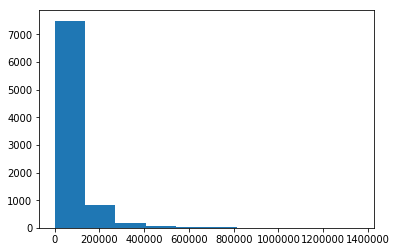

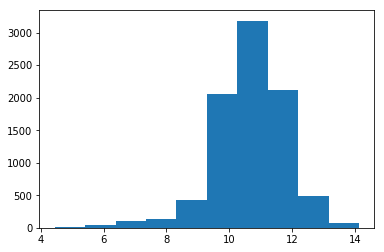

In [94]:
plt.hist(S_train)
plt.show()
plt.hist(np.log(S_train))
plt.show()

### Keras models

In [12]:
import keras
from keras import backend as K
from keras.models import Sequential, Model
from keras.layers import *

from IPython.display import SVG
from keras.utils.vis_utils import model_to_dot
import matplotlib.pyplot as plt
def plot_n_lc(real_lc, decoded_lc, n = 10, s=None):
    for _ in range(n):
        n_sampled = np.random.randint(0, real_lc.shape[0])
        
        if s !=None:
            print("Real scale = %f\nPred scale = %f"%(s[0][n_sampled], s[1][n_sampled] ))
        f, (ax1, ax2) = plt.subplots(1, 2, sharex=True,figsize= (15,5))
        ax1.plot(real_lc[n_sampled], 'b.-')
        ax1.set_title("Real")
        ax2.plot(decoded_lc[n_sampled], 'b.-')
        ax2.set_title("Reconstructed")
        plt.show()  

        plt.figure(figsize=(15,5))
        plt.plot(real_lc[n_sampled], 'bo-', label="Real")
        plt.plot(decoded_lc[n_sampled], 'g*-', label="Reconstructed")
        plt.title("Over")
        plt.legend()
        plt.show()
        print("----------------------------------------------------------------")

In [13]:
latent_dim = 32
N, T, channels = X_train.shape
D_dim = 5 #o variar: Period", "Duration", "Time of Transit Epoch", "r/R", "a/R",

In [14]:
X_train = X_train*S_train[:,None,:]
X_test = X_test*S_test[:,None,:]

## Regular VAE

In [15]:
l = 0.001 #kl weight

In [16]:
def sampling(args):
    z_mean, z_log_var = args
    epsilon = K.random_normal(shape=(K.shape(z_mean)[0], K.shape(z_mean)[1]), mean=0., stddev=1.)
    return z_mean + K.exp(0.5*z_log_var) * epsilon

def KL_loss(y_true, y_pred):
    return - 0.5 * K.sum(1 + z_log_var - K.square(z_mean) - K.exp(z_log_var), axis=-1)

#### IF THIS IS USED,, KL WEIGHT NEEDED TO BE LOW ######
def MSE_loss(y_true, y_pred):
    v = K.mean( K.square( y_true - y_pred ), axis=1) #on time axis..    
    return K.flatten(v)

#### HAS TO BE USED IN ORDER TO LEARN #######
def SSE_loss(y_true, y_pred):
    v = K.sum( K.square( y_true - y_pred ), axis=1) #on time axis..    
    return K.flatten(v)

def vae_loss(y_true, y_pred):
    return MSE_loss(y_true, y_pred) + l*KL_loss(y_true, y_pred)

In [16]:
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, 1) , name ="T_inp")

x = Concatenate(axis=-1)([x_t, x_lc]) #add time encode

f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x) #bidirectional
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) #bidirectional

z_mean = Dense(latent_dim,activation='linear')(f1)
z_log_var = Dense(latent_dim,activation='linear')(f1)

encoder = Model([x_t, x_lc], z_mean, name="encoder")
z = Lambda(sampling, output_shape=(latent_dim,), name='sample')([z_mean, z_log_var])
samp_encoder = Model([x_t, x_lc], z, name="encoder_sampling")


decoder_input = Input(shape=(latent_dim,))

decode = RepeatVector(T)(decoder_input)

decode = Concatenate(axis=-1)([x_t, decode]) #add time decode

decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

decode = TimeDistributed(Dense(1, activation='linear'))(decode)
generator = Model([x_t, decoder_input], decode, name="generator")

# instantiate VAE model
out = generator([x_t, samp_encoder([x_t, x_lc]) ])
vae = Model([x_t, x_lc], out)

vae.compile(optimizer='adam', loss=vae_loss, metrics = [KL_loss, MSE_loss])
vae.summary()

batch_size = 64
vae.fit([X_train_t,X_train], X_train, epochs=500, batch_size=batch_size, 
        validation_data=([X_test_t,X_test], X_test))

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
T_inp (InputLayer)              (None, 200, 1)       0                                            
__________________________________________________________________________________________________
LC_inp (InputLayer)             (None, 200, 1)       0                                            
__________________________________________________________________________________________________
encoder_sampling (Model)        (None, 32)           108864      T_inp[0][0]                      
                                                                 LC_inp[0][0]                     
__________________________________________________________________________________________________
generator (Model)               (None, 200, 1)       112641      T_inp[0][0]                      
          

8634/8634 [==============================] - 21s 2ms/step - loss: 0.6538 - KL_loss: 14.5974 - MSE_loss: 0.6392
Epoch 122/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.6700 - KL_loss: 14.9232 - MSE_loss: 0.6551
Epoch 123/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.6676 - KL_loss: 14.4434 - MSE_loss: 0.6531
Epoch 124/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.6689 - KL_loss: 14.5126 - MSE_loss: 0.6544
Epoch 125/500
8634/8634 [==============================] - 22s 2ms/step - loss: 0.6628 - KL_loss: 14.6863 - MSE_loss: 0.6482
Epoch 126/500
8634/8634 [==============================] - 22s 3ms/step - loss: 0.6436 - KL_loss: 14.8803 - MSE_loss: 0.6287
Epoch 127/500
8634/8634 [==============================] - 23s 3ms/step - loss: 0.6561 - KL_loss: 14.8440 - MSE_loss: 0.6413
Epoch 128/500
8634/8634 [==============================] - 22s 3ms/step - loss: 0.6781 - KL_loss: 14.6441 - MSE_loss: 0.6634
Epoch 129/500


8634/8634 [==============================] - 22s 2ms/step - loss: 0.5756 - KL_loss: 19.3032 - MSE_loss: 0.5563
Epoch 252/500
8634/8634 [==============================] - 22s 3ms/step - loss: 0.6215 - KL_loss: 19.1175 - MSE_loss: 0.6023
Epoch 253/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.6066 - KL_loss: 19.2291 - MSE_loss: 0.5874
Epoch 254/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.6072 - KL_loss: 19.4472 - MSE_loss: 0.5878
Epoch 255/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.5920 - KL_loss: 19.6845 - MSE_loss: 0.5723
Epoch 256/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.6084 - KL_loss: 19.6204 - MSE_loss: 0.5888
Epoch 257/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.6004 - KL_loss: 19.4915 - MSE_loss: 0.5809
Epoch 258/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.5925 - KL_loss: 19.5343 - MSE_loss: 0.5730
Epoch 259/500


8634/8634 [==============================] - 21s 2ms/step - loss: 0.5761 - KL_loss: 21.8715 - MSE_loss: 0.5542
Epoch 382/500
8634/8634 [==============================] - 20s 2ms/step - loss: 0.5802 - KL_loss: 21.6287 - MSE_loss: 0.5586
Epoch 383/500
8634/8634 [==============================] - 20s 2ms/step - loss: 0.5902 - KL_loss: 21.3665 - MSE_loss: 0.5689
Epoch 384/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.5822 - KL_loss: 21.1635 - MSE_loss: 0.5610
Epoch 385/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.5674 - KL_loss: 21.4190 - MSE_loss: 0.5460
Epoch 386/500
8634/8634 [==============================] - 21s 2ms/step - loss: 0.6121 - KL_loss: 21.4112 - MSE_loss: 0.5907
Epoch 387/500
8634/8634 [==============================] - 20s 2ms/step - loss: 0.5616 - KL_loss: 21.5380 - MSE_loss: 0.5400
Epoch 388/500
8634/8634 [==============================] - 20s 2ms/step - loss: 0.5500 - KL_loss: 21.5761 - MSE_loss: 0.5284
Epoch 389/500


Errores  []


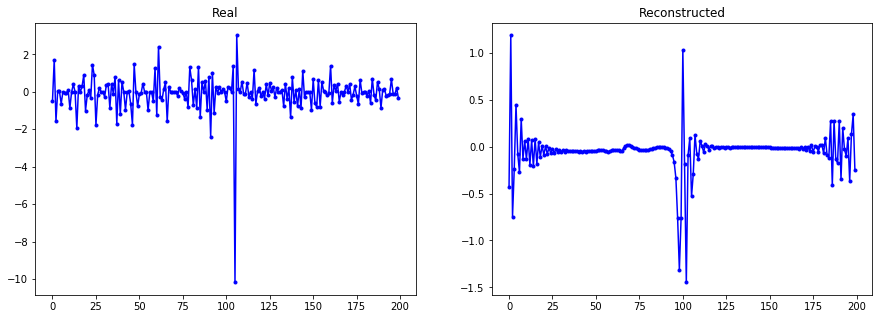

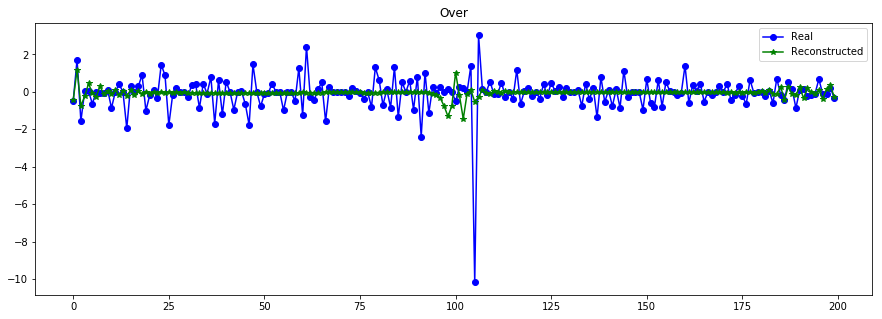

----------------------------------------------------------------


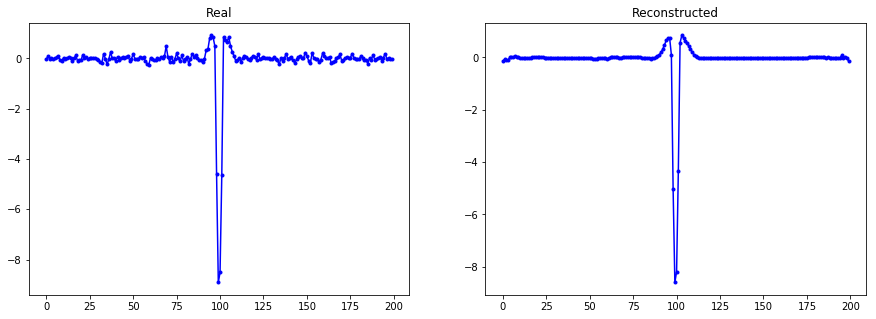

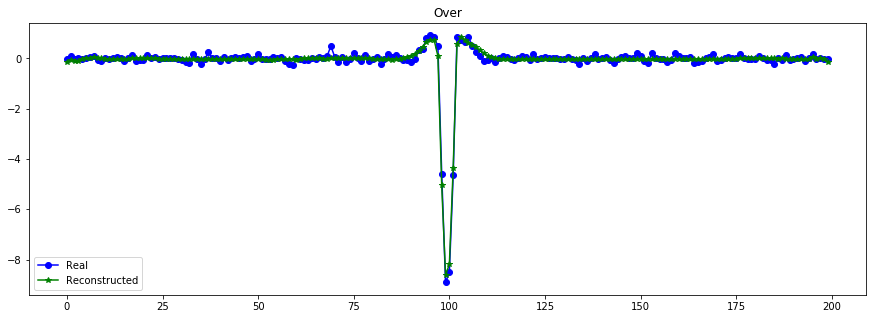

----------------------------------------------------------------


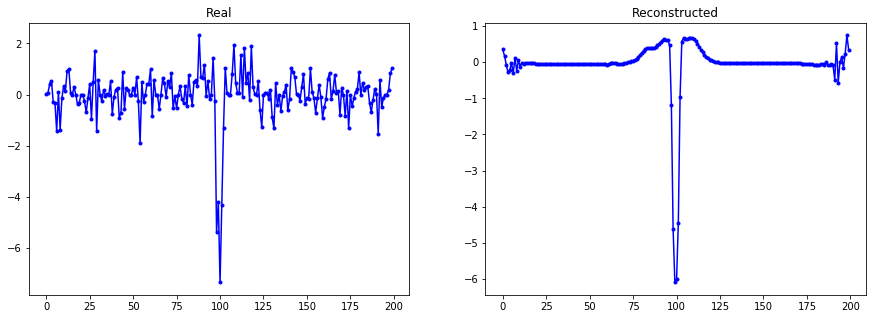

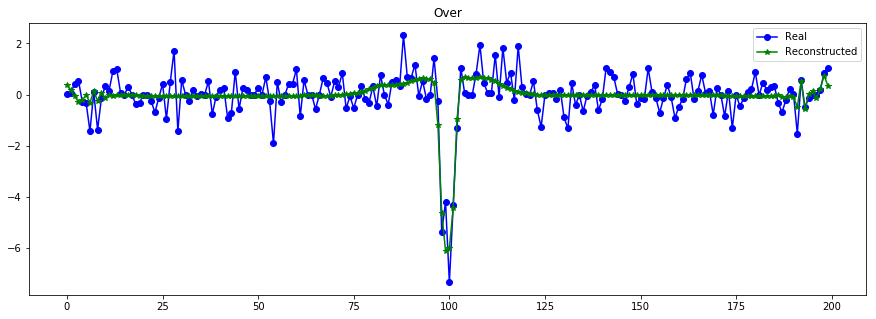

----------------------------------------------------------------


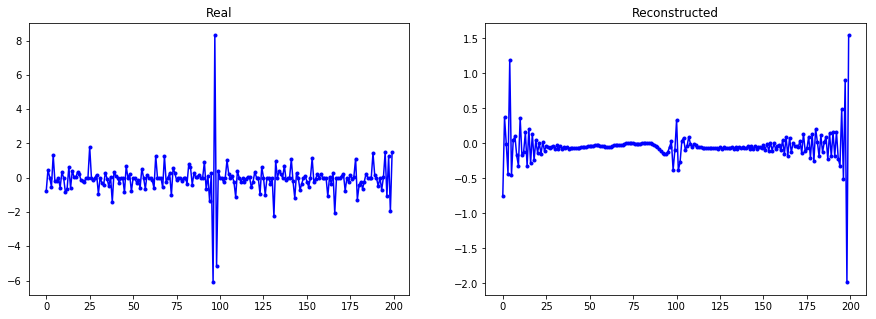

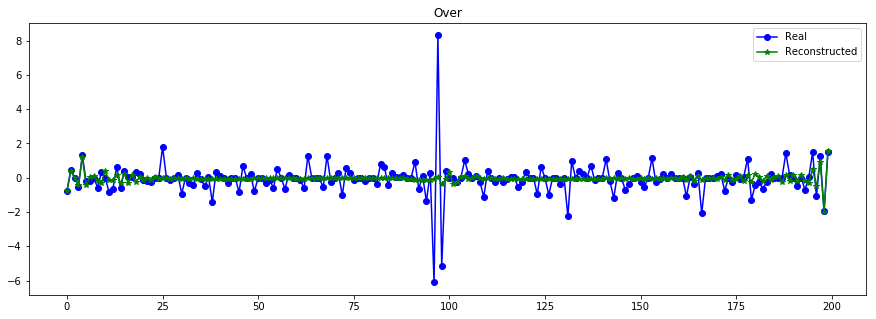

----------------------------------------------------------------


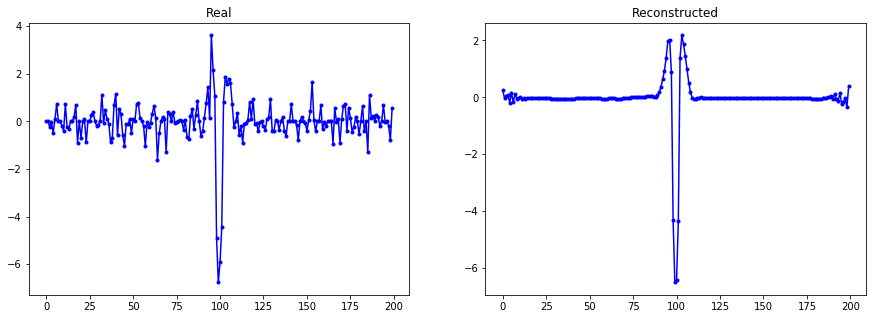

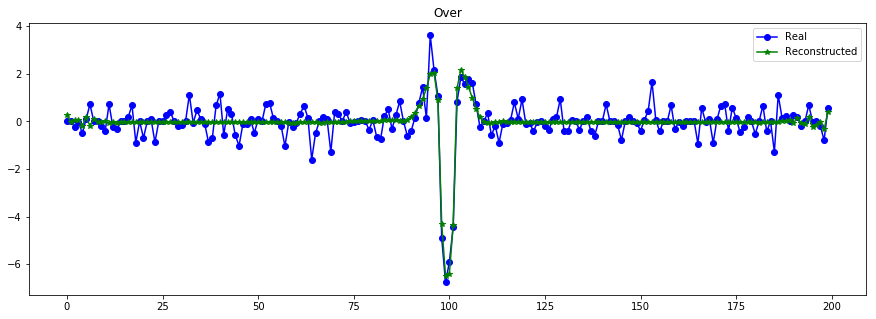

----------------------------------------------------------------


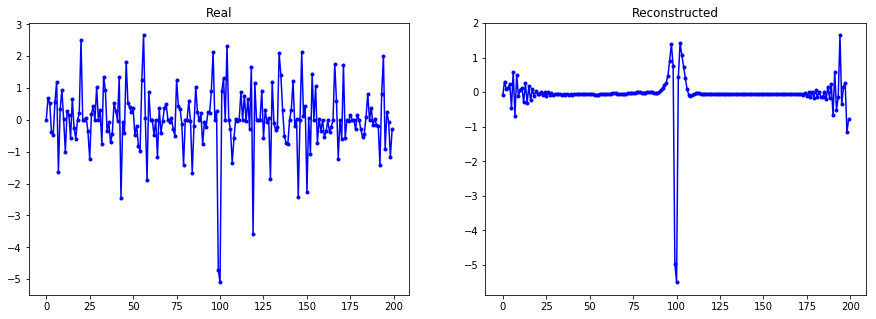

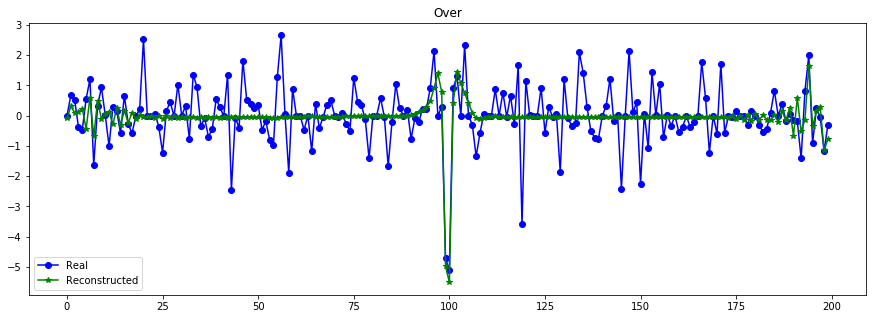

----------------------------------------------------------------


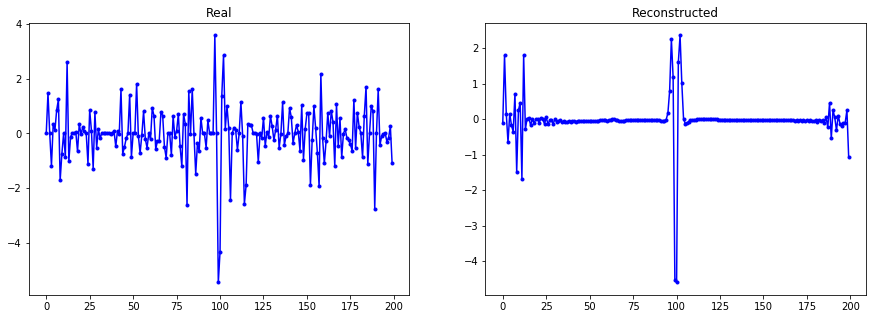

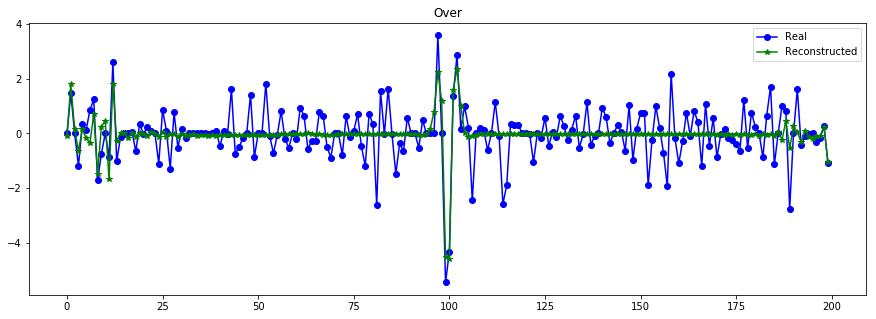

----------------------------------------------------------------


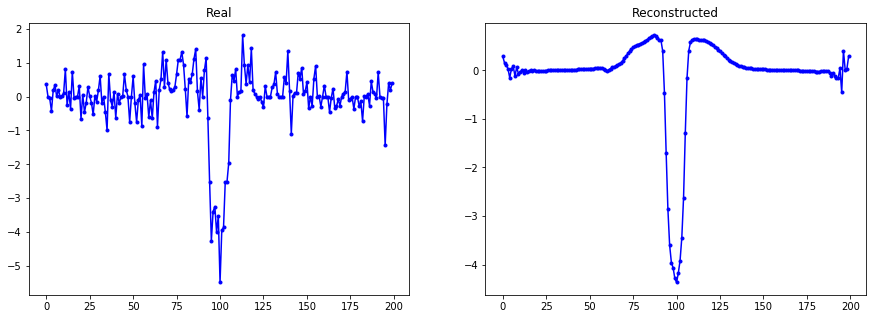

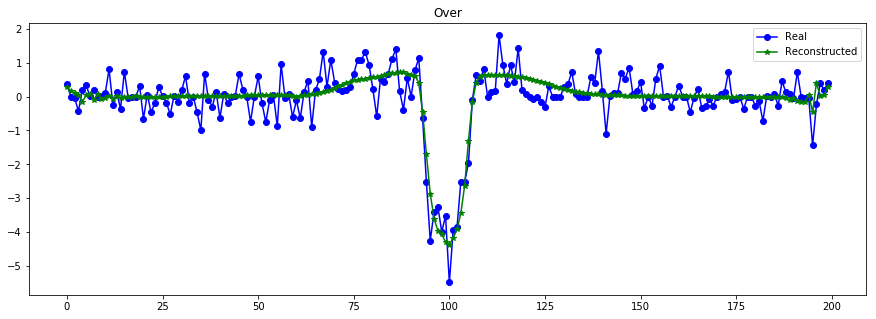

----------------------------------------------------------------


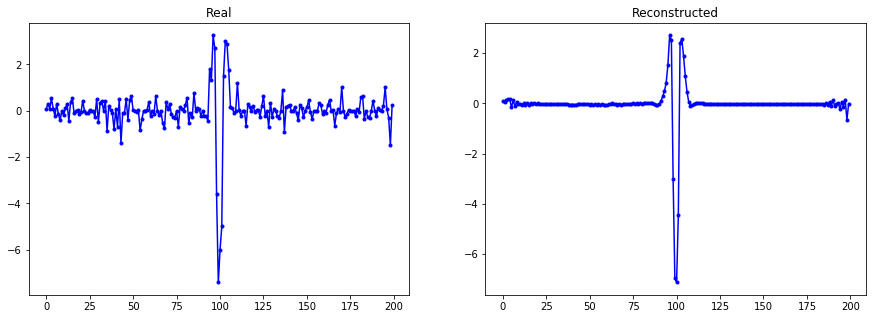

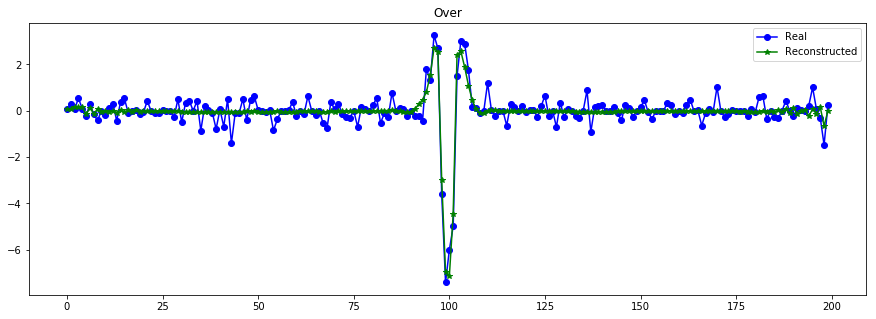

----------------------------------------------------------------


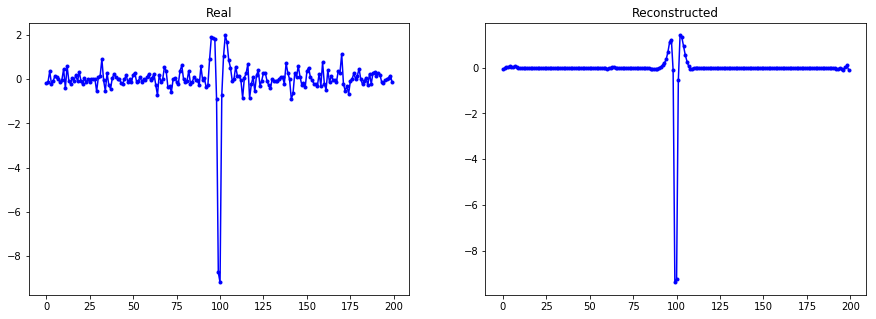

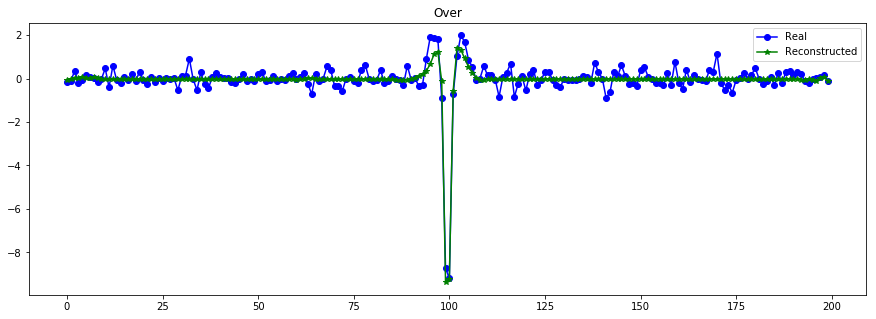

----------------------------------------------------------------


In [17]:
print("Errores ",vae.evaluate([X_test_t,X_test], X_test, batch_size=512))
X_train_hat = vae.predict([X_train_t,X_train], batch_size=512)
plot_n_lc(X_train[:,:,0], X_train_hat, n= 10) ###con 200 epochs T=200 global (CURVAS TRANSITO) std rep 

In [ ]:
X_train_hat = vae.predict([X_train_t, X_train], batch_size=512)

In [ ]:
evaluate_reconst(X_train, X_train_hat)

plot_n_lc(X_train[:,:,0], X_train_hat, n= 15)

### Filtros

In [102]:
#https://plot.ly/python/v3/fft-filters/
#https://docs.scipy.org/doc/scipy/reference/generated/scipy.signal.butter.html
#https://scipy-cookbook.readthedocs.io/items/ButterworthBandpass.html
from scipy.signal import butter, lfilter

def butter_bandpass(lowcut, highcut, fs, order=5):
    nyq = 0.5 * fs
    low = lowcut / nyq
    high = highcut / nyq
    #b, a = butter(order, [low, high], btype='band')
    b, a = butter(order, high, btype='highpass')
    #b, a = butter(order, low, btype='lowpass')
    return b, a

def butter_bandpass_filter(data):
    b, a = butter_bandpass(lowcut, highcut, fs, order)
    y = lfilter(b, a, data)
    return y

In [ ]:
highcut = 2500 #2500 #2500. # 500. #0.1
fs =  10000.
order = 6

X_train_filter = np.apply_along_axis(butter_bandpass_filter, 1, X_train[:,:,0])

evaluate_reconst(X_train,X_train_filter)

plot_n_lc(X_train[:,:,0], X_train_filter, n= 10)

In [ ]:
lowcut  = 1 #300. #2000. #con order 3
highcut = 500 #2500 #2500. # 500. #0.1
fs =  10000.
order = 3

X_train_filter = np.apply_along_axis(butter_bandpass_filter, 1, X_train[:,:,0])

evaluate_reconst(X_train,X_train_filter)

plot_n_lc(X_train[:,:,0], X_train_filter, n= 10)

In [ ]:
lowcut  = 50 #300. #2000. #con order 3
highcut = 500 #2500 #2500. # 500. #0.1
fs =  10000.
order = 3

X_train_filter = np.apply_along_axis(butter_bandpass_filter, 1, X_train[:,:,0])

evaluate_reconst(X_train,X_train_filter)

plot_n_lc(X_train[:,:,0], X_train_filter, n= 10)

In [ ]:
lowcut  = 1 #300. #2000. #con order 3
highcut = 1500 #2500 #2500. # 500. #0.1
fs =  10000.
order = 3

X_train_filter = np.apply_along_axis(butter_bandpass_filter, 1, X_train[:,:,0])

evaluate_reconst(X_train,X_train_filter)

plot_n_lc(X_train[:,:,0], X_train_filter, n= 10)

In [ ]:
lowcut  = 1 #300. #2000. #con order 3
highcut = 2500 #2500 #2500. # 500. #0.1
fs =  10000.
order = 3

X_train_filter = np.apply_along_axis(butter_bandpass_filter, 1, X_train[:,:,0])

evaluate_reconst(X_train,X_train_filter)

plot_n_lc(X_train[:,:,0], X_train_filter, n= 10)

### Smooth light curve (moving average)

In [17]:
df = pd.DataFrame(X_train[:,:,0])
df.head()

,0,1,2,3,4,5,6,7,8,9,...,190,191,192,193,194,195,196,197,198,199
0,-0.001590,-0.025528,-0.027490,-0.007376,0.071444,0.000000,-0.001159,-0.001858,-0.003290,-0.012983,...,-0.004612,0.000000,-0.016977,0.001322,-0.016613,-0.015197,0.000334,0.010448,0.017679,0.016550
1,0.923023,0.622175,-1.315577,-0.092240,0.074952,-0.757655,-1.198035,-0.173272,0.000000,0.586486,...,-1.069091,0.000000,0.056618,0.347644,0.431844,0.492213,-1.106873,0.610281,0.000000,0.318541
2,-0.602360,1.278955,-0.346153,-0.131274,0.484661,0.976514,-0.967190,-0.370055,0.000000,-0.528061,...,0.000000,0.184454,0.210683,-1.084544,0.830202,-0.265806,-0.307078,0.000000,0.000000,0.000000
3,0.003934,-0.004337,0.049863,0.059361,0.034746,0.198219,-0.004092,0.082151,0.063270,0.096195,...,-0.028894,0.000000,-0.080536,0.000000,0.052542,-0.028218,0.000000,0.045424,-0.032743,-0.059767
4,-0.495306,0.161124,0.000000,-0.107549,0.000000,1.507745,-0.404227,0.000000,-1.180275,0.261397,...,-0.624675,-0.707173,0.324012,0.000000,0.000000,-0.069399,-1.764951,2.325822,0.023251,-0.549276


----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


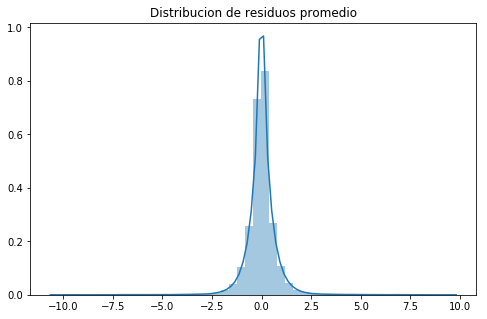

RMSE (+-)=  0.7478621509455878
MSE      =  0.5826456178703672
MAE  (+-)=  0.4471000576136866


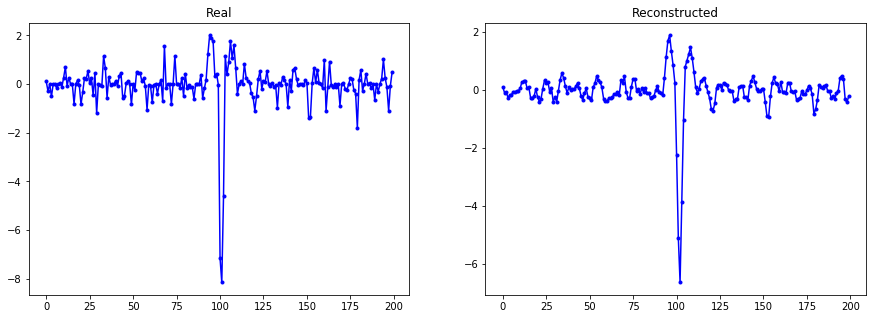

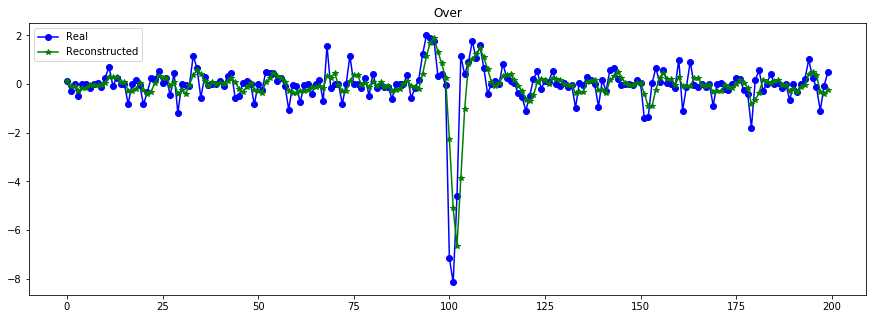

----------------------------------------------------------------


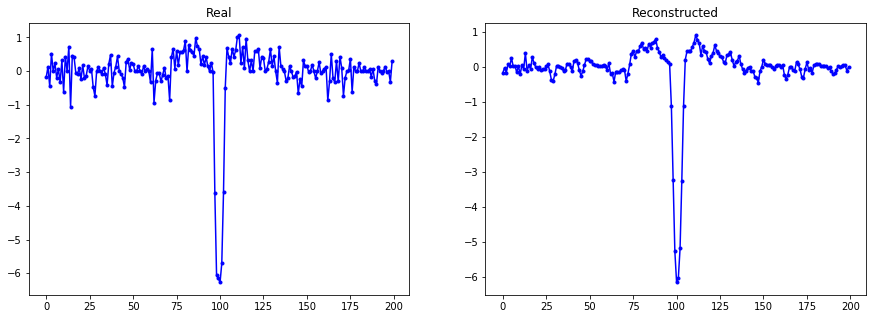

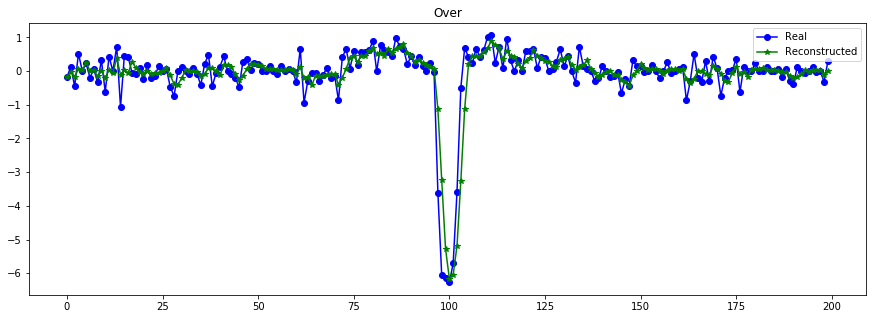

----------------------------------------------------------------


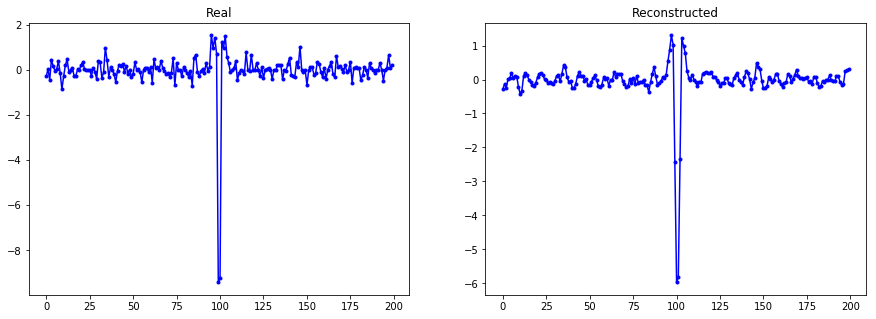

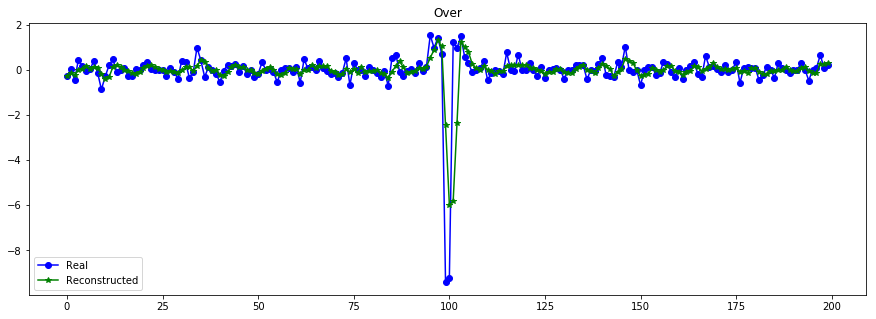

----------------------------------------------------------------


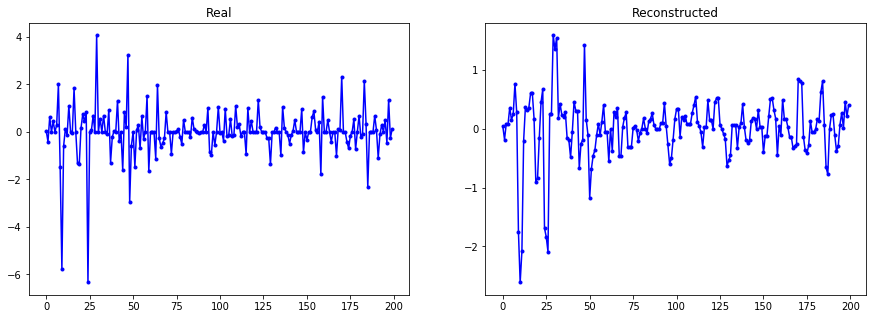

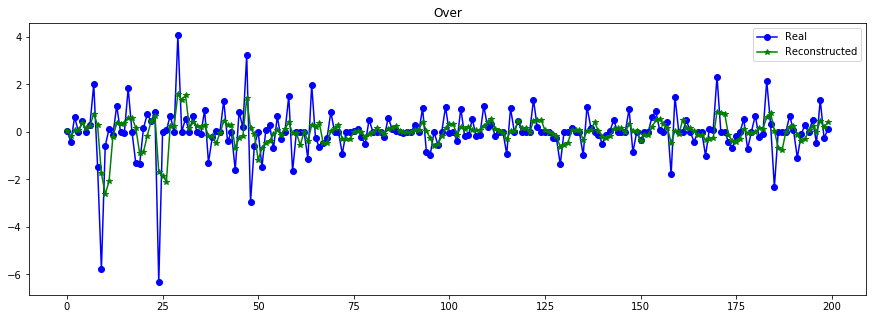

----------------------------------------------------------------


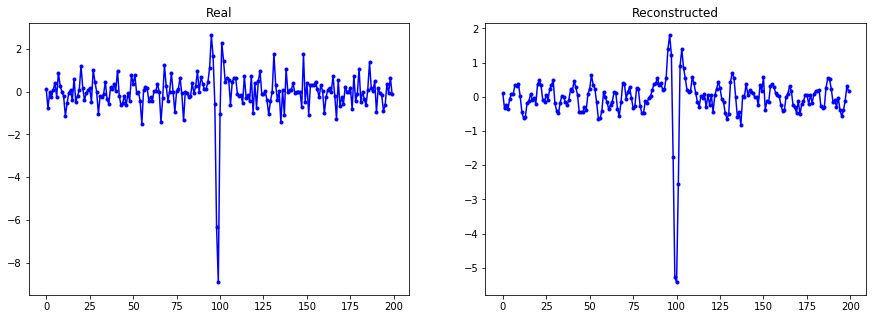

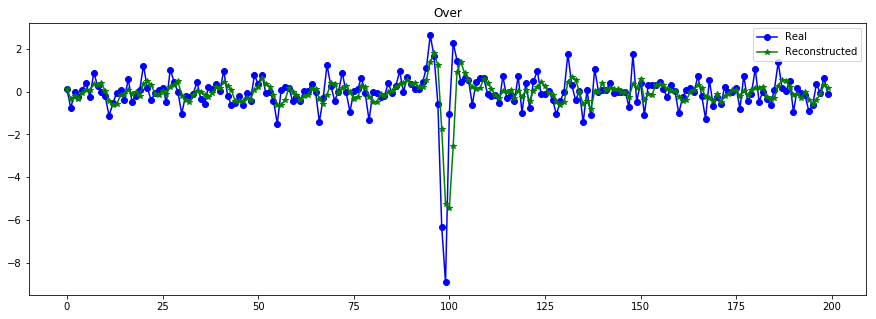

----------------------------------------------------------------


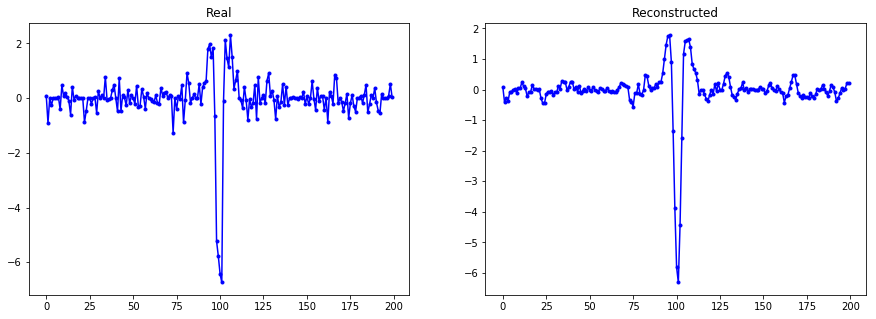

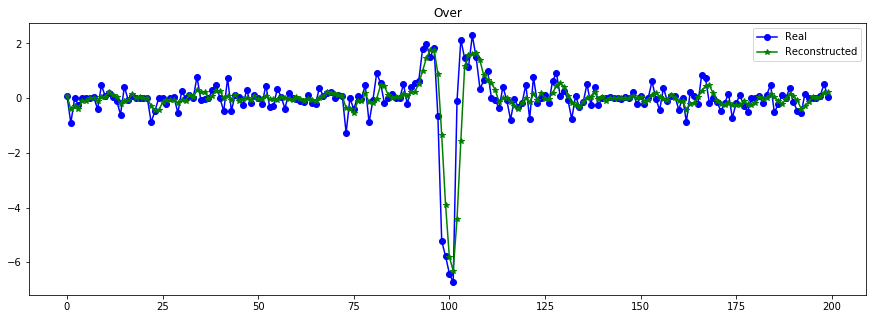

----------------------------------------------------------------


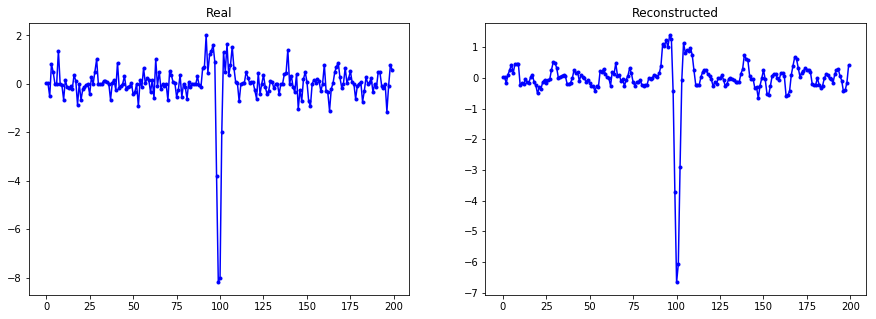

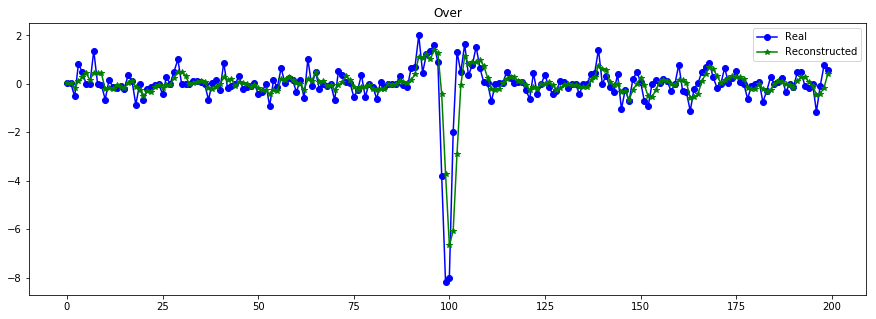

----------------------------------------------------------------


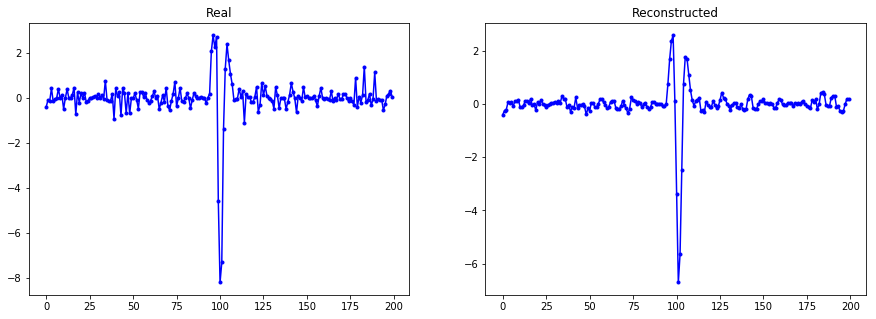

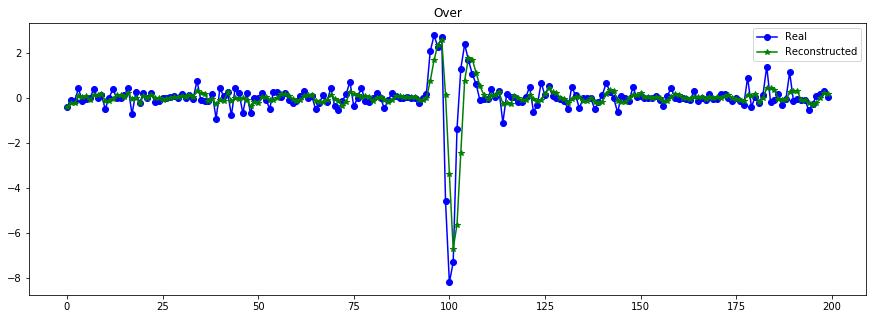

----------------------------------------------------------------


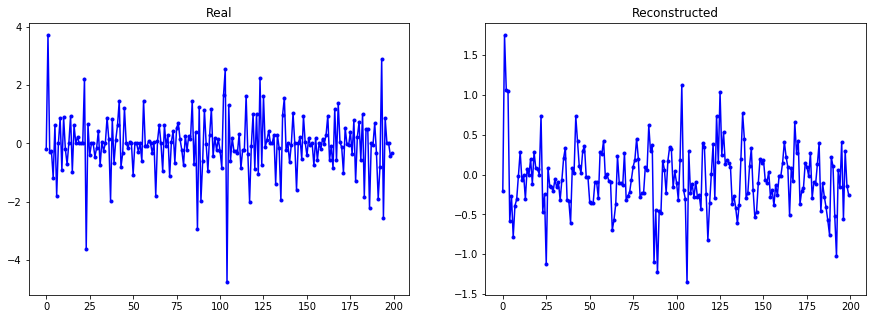

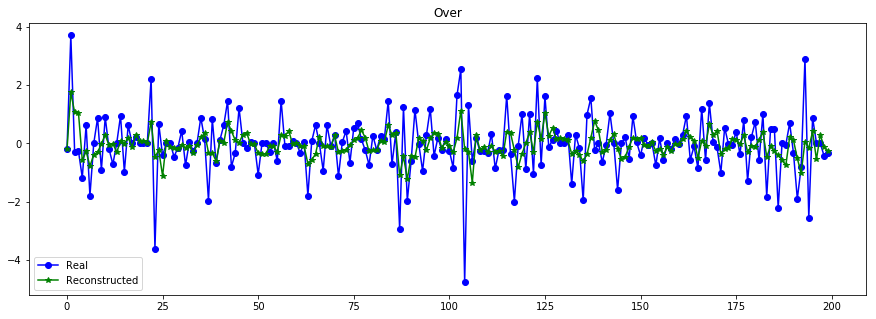

----------------------------------------------------------------


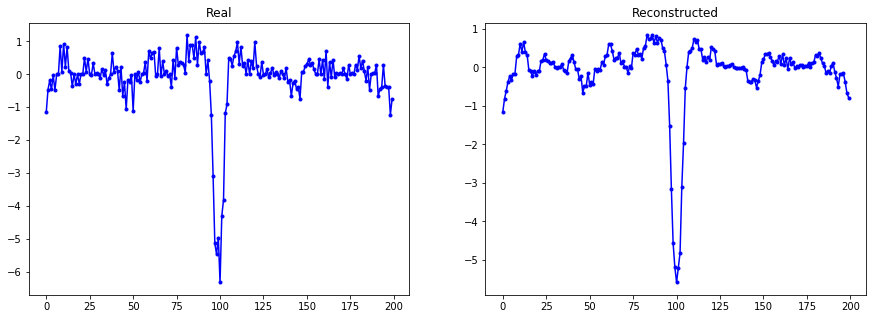

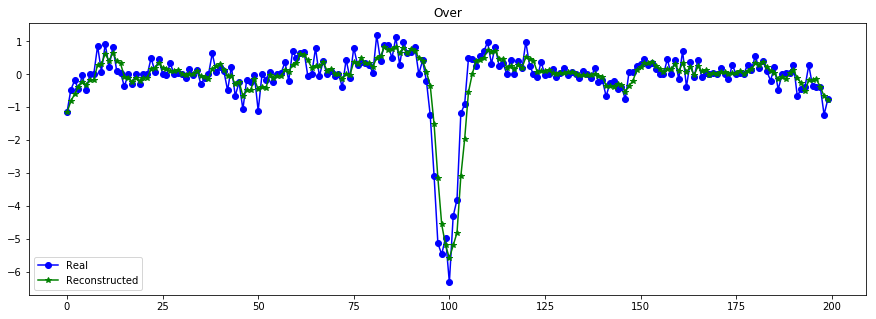

----------------------------------------------------------------


In [21]:
X_train_smooth = df.rolling(window=3, axis=1, min_periods=1).mean().values

evaluate_reconst(X_train,X_train_smooth)

plot_n_lc(X_train[:,:,0], X_train_smooth, n= 10)

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


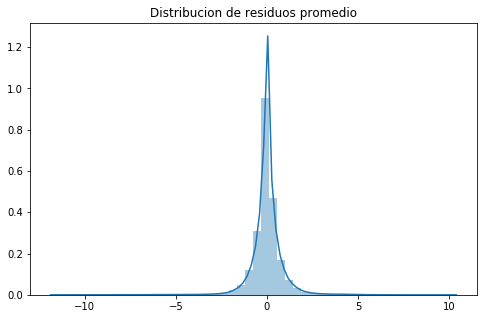

RMSE (+-)=  0.8662789463500364
MSE      =  0.7631873076672796
MAE  (+-)=  0.49769598896179496


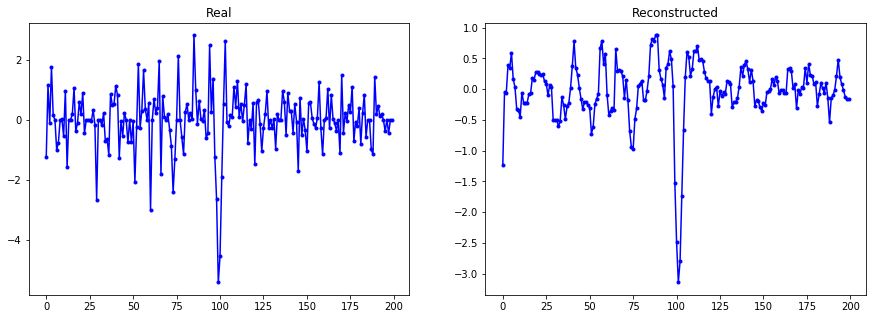

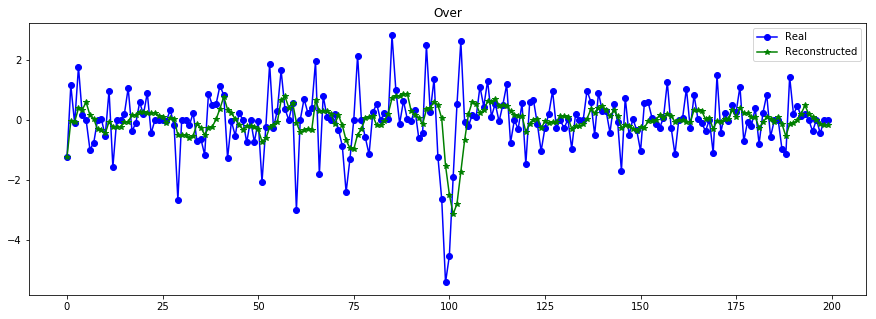

----------------------------------------------------------------


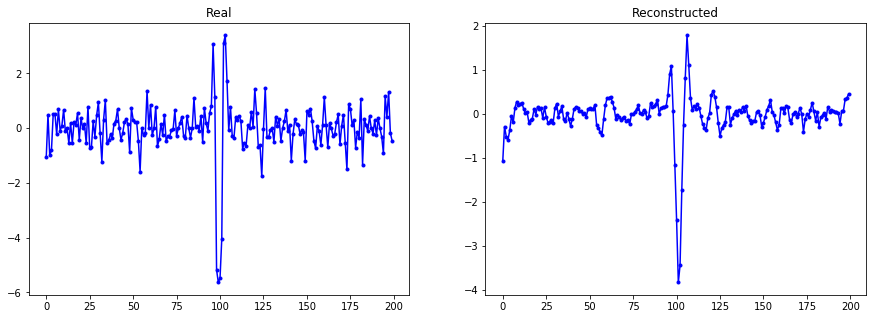

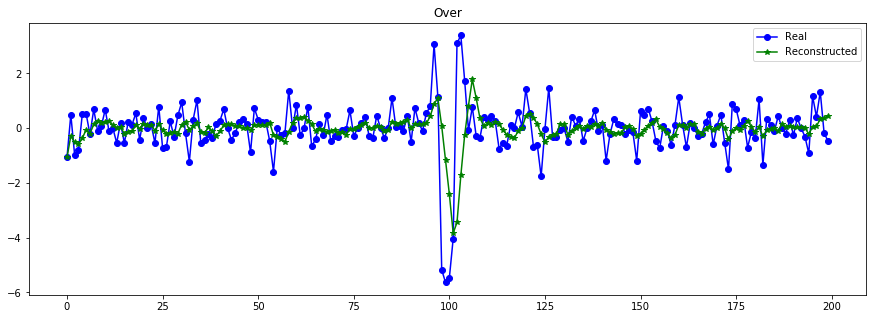

----------------------------------------------------------------


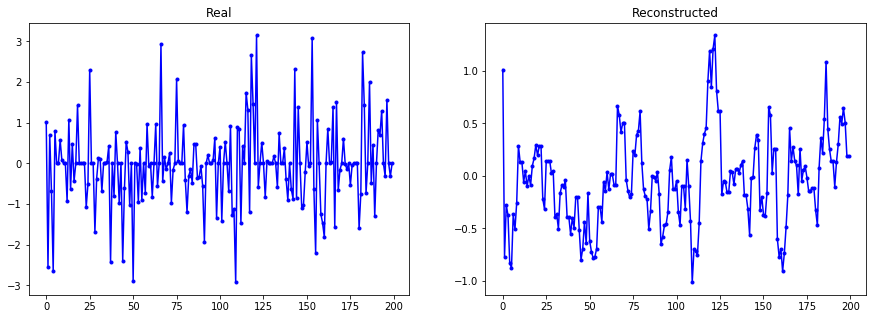

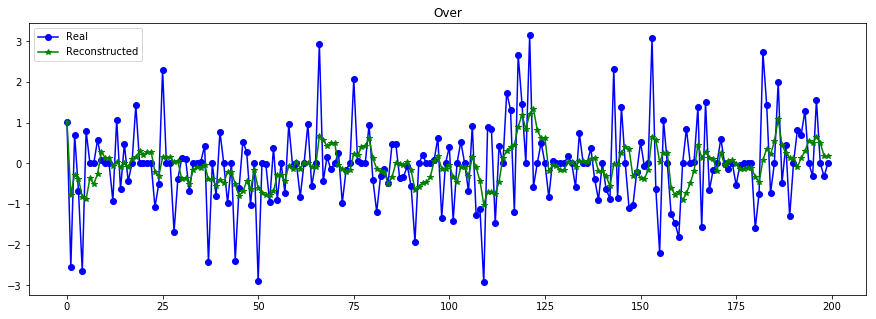

----------------------------------------------------------------


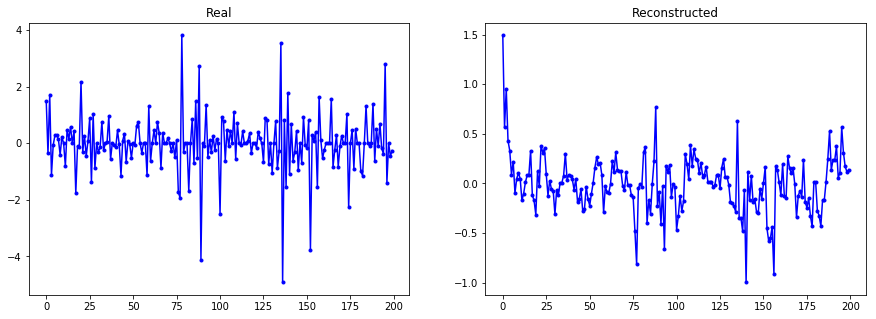

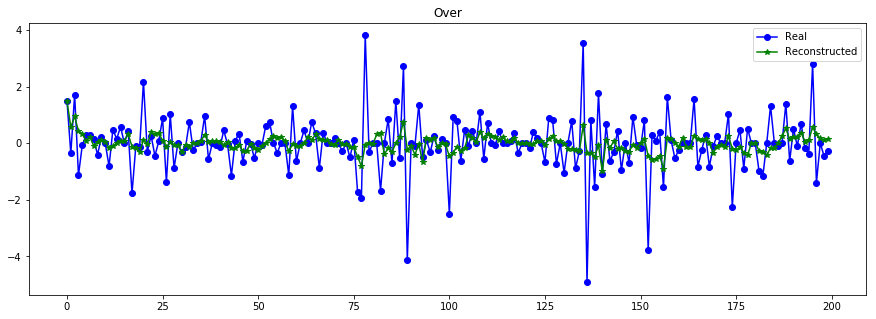

----------------------------------------------------------------


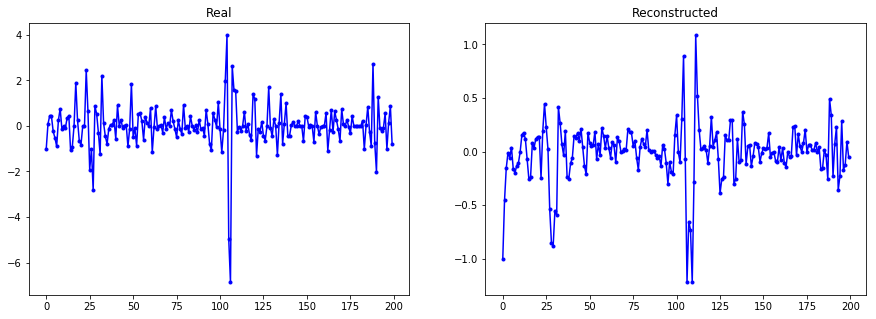

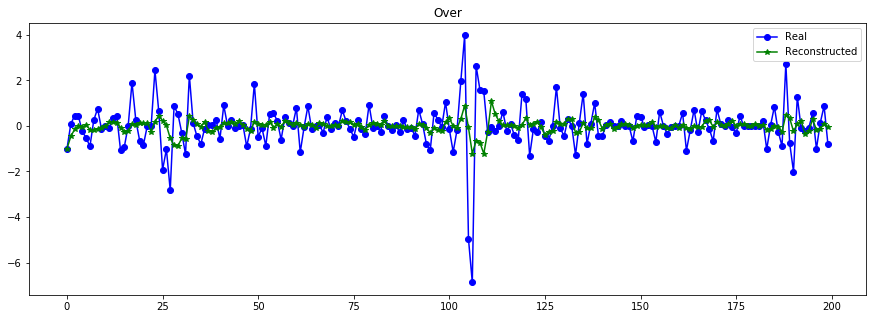

----------------------------------------------------------------


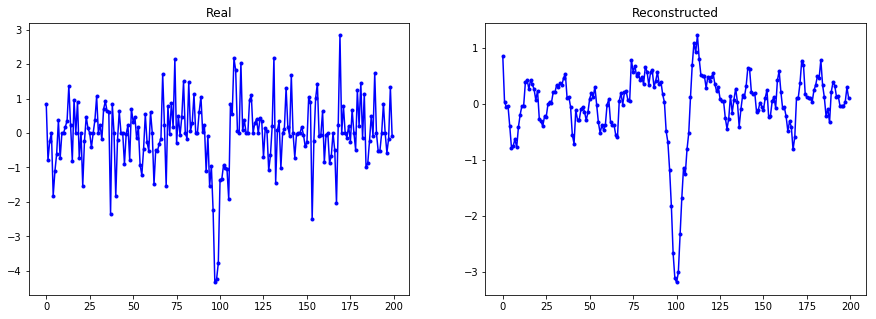

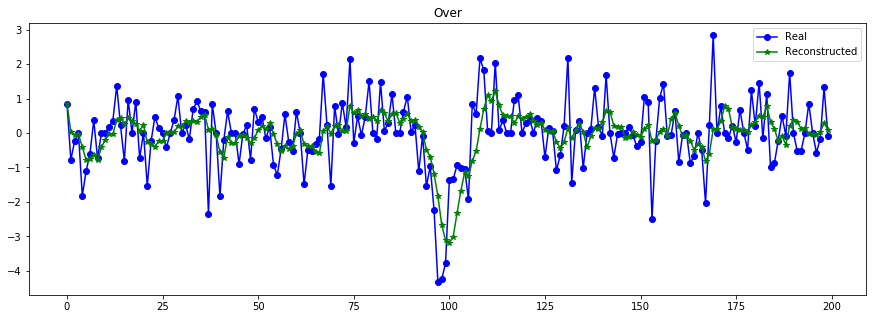

----------------------------------------------------------------


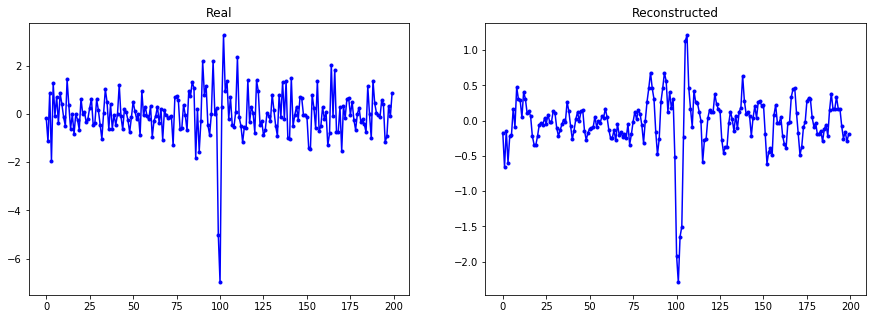

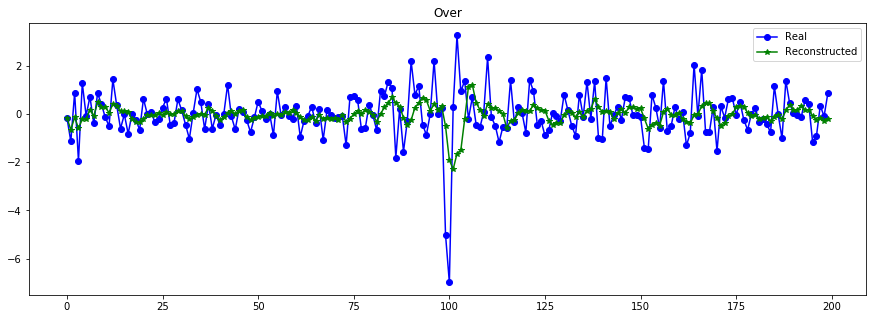

----------------------------------------------------------------


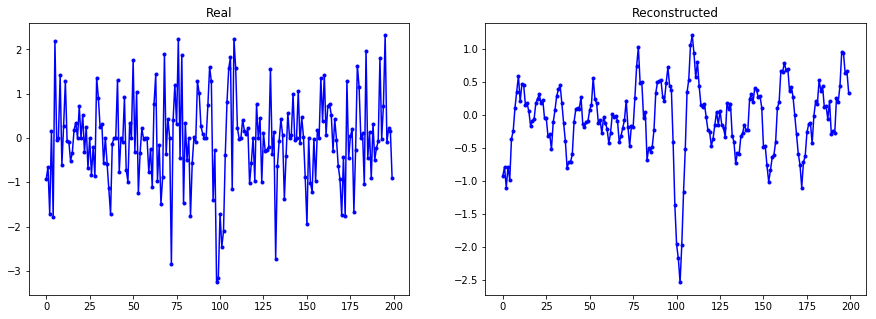

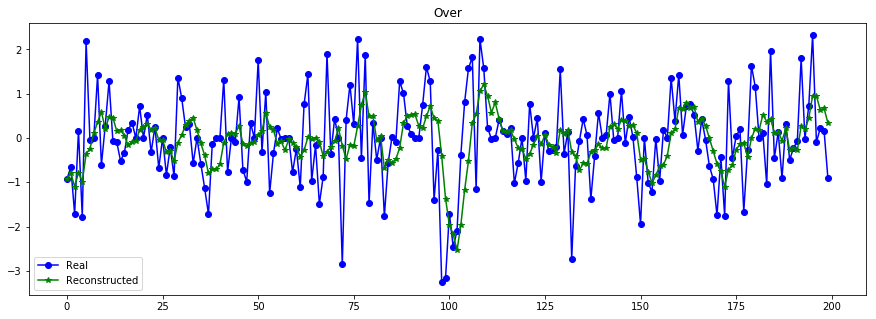

----------------------------------------------------------------


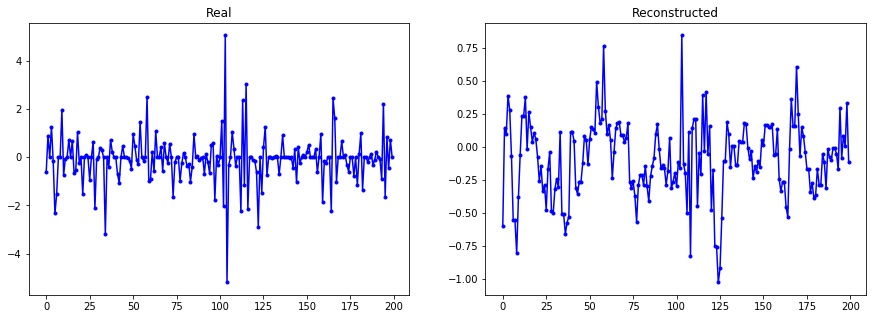

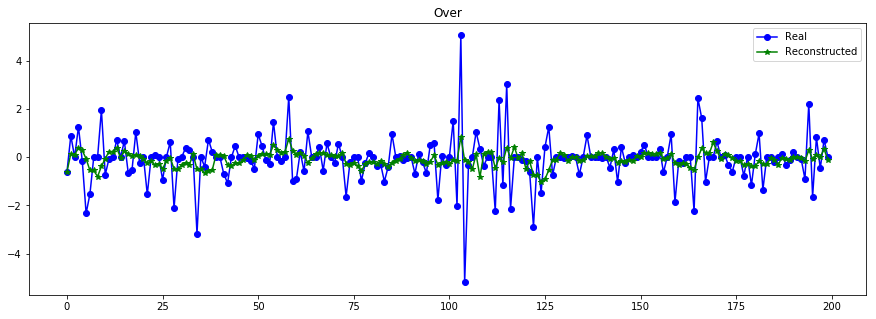

----------------------------------------------------------------


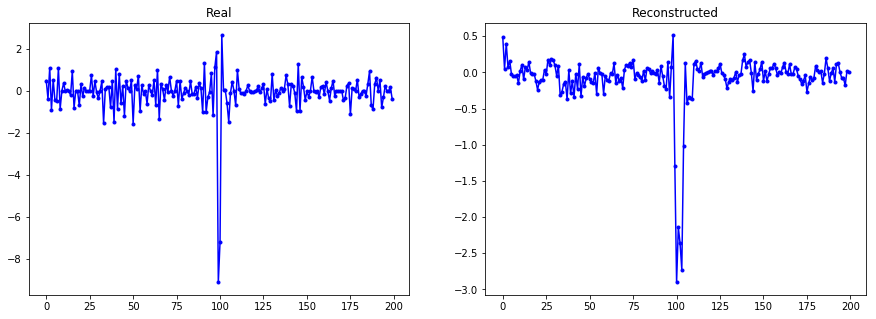

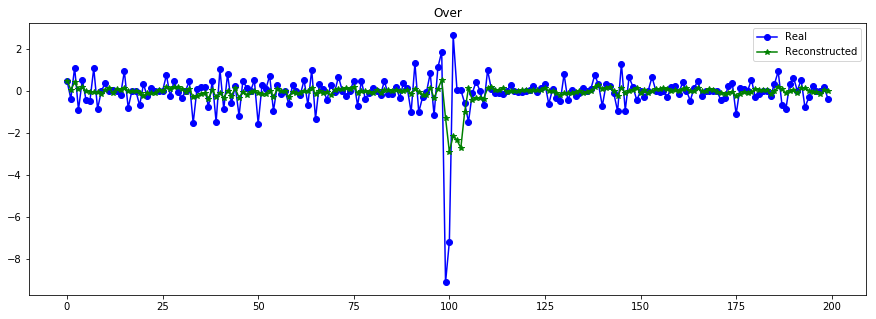

----------------------------------------------------------------


In [22]:
X_train_smooth = df.rolling(window=5, axis=1, min_periods=1).mean().values

evaluate_reconst(X_train,X_train_smooth)

plot_n_lc(X_train[:,:,0], X_train_smooth, n= 10)

In [ ]:
X_train_smooth = df.rolling(window=10, axis=1, min_periods=1).mean().values

evaluate_reconst(X_train,X_train_smooth)

plot_n_lc(X_train[:,:,0], X_train_smooth, n= 10)

In [ ]:
X_train_smooth = df.rolling(window=20, axis=1, min_periods=1).mean().values

evaluate_reconst(X_train,X_train_smooth)

plot_n_lc(X_train[:,:,0], X_train_smooth, n= 10)

----- EVALUANDO RECONSTRUCCION DE LA CURVA -----


/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


KeyboardInterrupt: 

In [ ]:
X_train_smooth = df.rolling(window=40, axis=1, min_periods=1).mean().values

evaluate_reconst(X_train,X_train_smooth)

plot_n_lc(X_train[:,:,0], X_train_smooth, n= 10)

### Mandel-Agol model

In [31]:
import pysyzygy as ps

In [45]:
X_train_MA = []

for i in range(N):
    metadata_n = df_meta.iloc[i]
    ## LOAD ALL METADATA TO SIMULATE
    period = metadata_n["Period"]
    duration = metadata_n["Duration"]/24
    a_R = metadata_n["a/R"]
    t_0 = 0 #trabajando con folds.. #metadata_n["Time of Transit Epoch"]-t[0] #start on 0
    r_R = metadata_n["r/R"]
    
    #https://slideplayer.com/slide/6301069/21/images/7/Finally%2C+finding+transit+duration..jpg
    # con a y b se puede obtener la inclinacion..
    impact_p = metadata_n["Impact Parameter"] #bcirc: circular impact parameter
    inclination = metadata_n["Inclination"]
    
    u1 = metadata_n["Limb Darkening Coeff1"]
    u2 = metadata_n["Limb Darkening Coeff2"]
    
    #build model
    model = ps.Transit(per = period, RpRs = r_R, t0 = t_0, u1=u1,u2=u2, aRs= a_R, bcirc=impact_p,
                       maxpts=65000)
    
    #load time to simulate
    t_fold = X_train_t[i]
    #try:
    lc_simulated = model(t_fold) #primer error/contratiempo encontrado (TIEMPO)
    #except:
    #    print("ERROR, CURVA ELIMINADO DE INMEDIATO")
    #    continue
    X_train_MA.append(lc_simulated -1)
    
X_train_MA = np.asarray(X_train_MA)
X_train_MA.shape

Exception: Star-crossing orbit.

### Visualize encoded rep.

In [66]:
def transform_plot(model, data, just_plot=False):
    if just_plot:
        to_plot = data
    else:
        to_plot = model.fit_transform(data)
        
    plt.figure(figsize=(10,7))
    plt.scatter(to_plot[:,0],to_plot[:,1])
    plt.show()
    return to_plot

mask_transit = np.load("data/mask_transit_LC.py") 
Y_transit = np.tile( df_meta_obj.values[mask_transit], (2,1))
labels_transit = np.tile((df_meta["NExScI Disposition"].values[mask_transit]),2)

In [19]:
encoder_all = Model([x_t, x_lc], [z_mean, z_log_var], name="encoder")
z_aux, z_var_aux = encoder_all.predict([X_train_t,X_train], batch_size=512)
z_samp = samp_encoder.predict([X_train_t, X_train], batch_size=512)

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


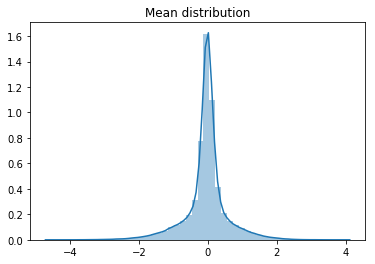

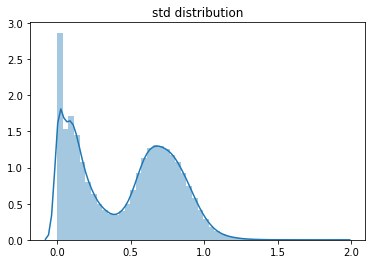

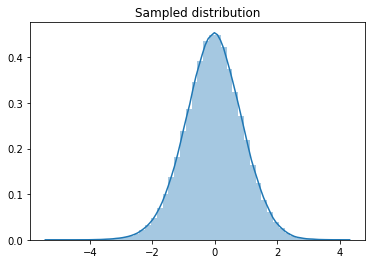

In [109]:
sns.distplot(z_aux.flatten())
plt.title("Mean distribution")
plt.show()

sns.distplot(np.exp(z_var_aux.flatten()))
plt.title("std distribution")
plt.show()

sns.distplot(z_samp.flatten())
plt.title("Sampled distribution")
plt.show()

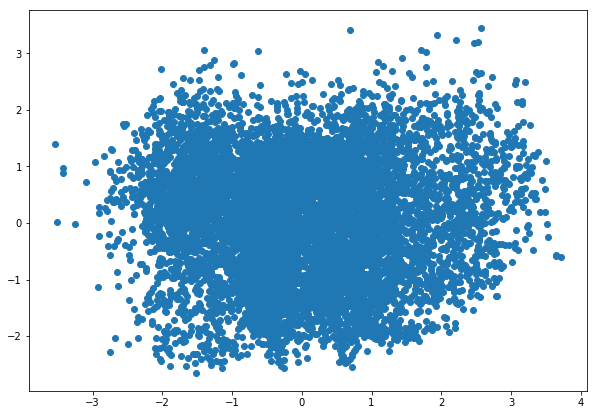

array([[-0.49488282, -2.3421776 ],
       [ 1.0831726 ,  0.66140187],
       [-0.9643556 , -0.4371205 ],
       ...,
       [ 1.525394  , -0.44142422],
       [-1.5754544 ,  0.1372661 ],
       [ 2.410554  , -0.21237522]], dtype=float32)

In [85]:
from sklearn.decomposition import PCA
model = PCA(2)

transform_plot(model, z_aux)

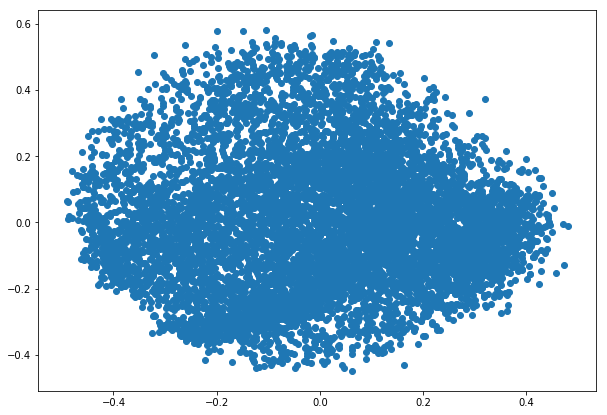

In [99]:
from sklearn.decomposition import KernelPCA
model = KernelPCA(2, kernel='rbf', gamma=None, n_jobs=-1)
    
to_plot = transform_plot(model, z_aux)

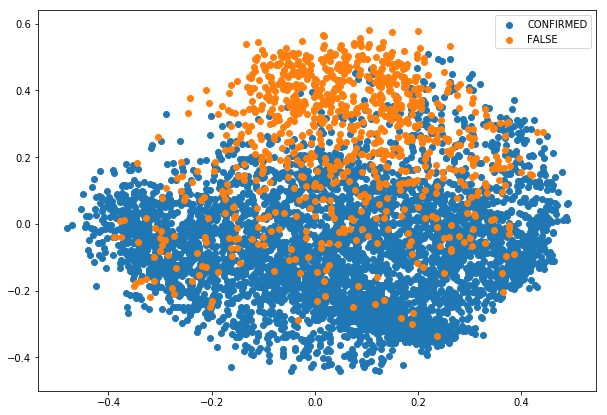

In [24]:
plt.figure(figsize=(10,7))
mask_ = (labels=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED")

mask_ = (labels=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE")

#mask_ = (labels=="CANDIDATE")
#plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CAND")
plt.legend()
plt.show()

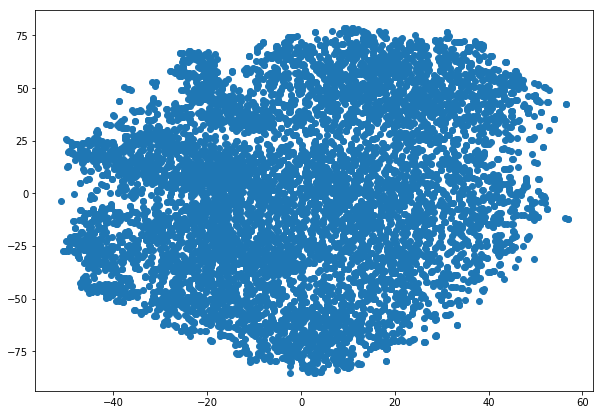

In [108]:
#tsne
from sklearn.manifold import TSNE
model = TSNE(2, metric='euclidean') #, n_jobs=-1)

to_plot = transform_plot(model, z_aux)

In [89]:
z_samp = samp_encoder.predict([X_train_t, X_train], batch_size=512)
z_samp.shape

(8634, 32)

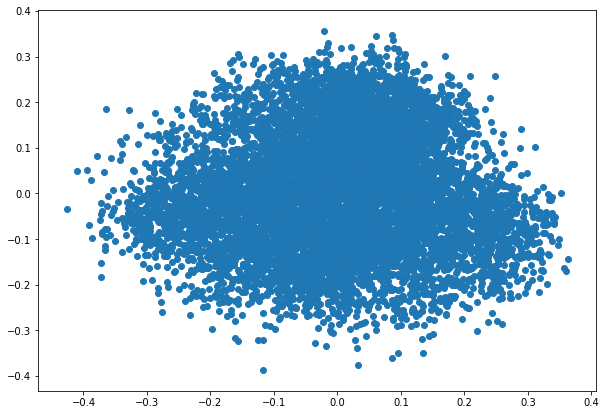

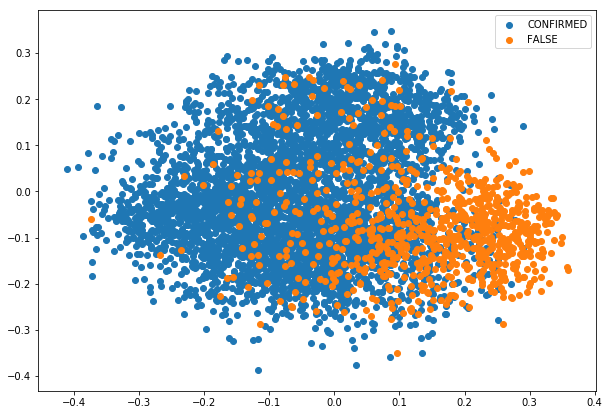

In [118]:
from sklearn.decomposition import KernelPCA
model = KernelPCA(2, kernel='rbf', gamma=None, n_jobs=-1)
    
to_plot = transform_plot(model, z_samp)

plt.figure(figsize=(10,7))
mask_ = (labels=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED")

mask_ = (labels=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE")

#mask_ = (labels=="CANDIDATE")
#plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CAND")
plt.legend()
plt.show()

### clustering

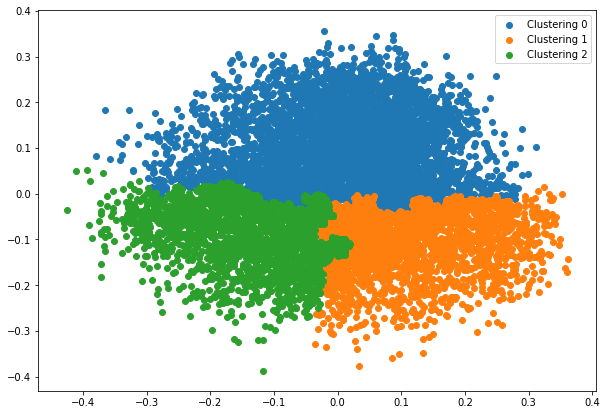

In [120]:
from sklearn.cluster import MiniBatchKMeans, KMeans, AgglomerativeClustering
K = 3
#model = KMeans(n_clusters = K, init='k-means++', n_jobs = -1)
model = AgglomerativeClustering(n_clusters=K, linkage='ward')

model.fit(to_plot)
clus_l = model.labels_

plt.figure(figsize=(10,7))
for i in range(K):
    mask_ = (clus_l==i)
    plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Clustering "+str(i))
plt.legend()
plt.show()

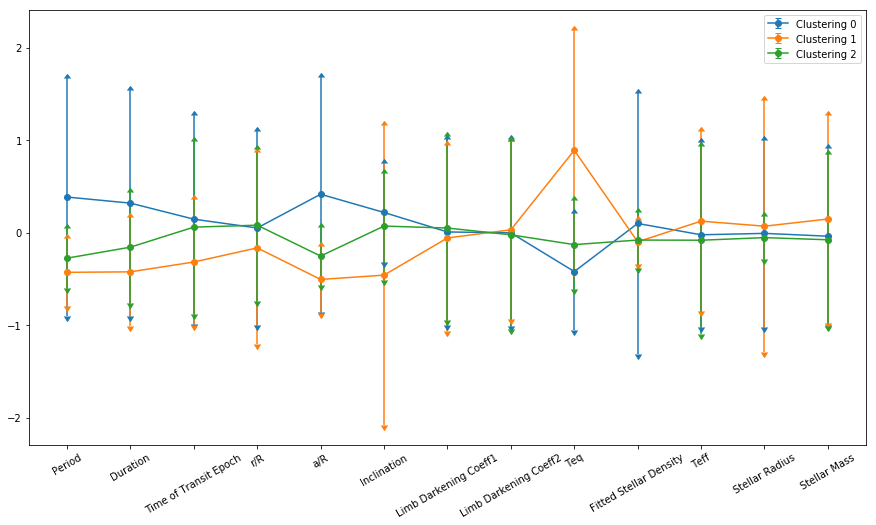

In [121]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()
Y_transit_s = std.fit_transform(Y_transit)

clus_met_reps = []
clus_met_std = []
for i in range(K):
    mask_ = (clus_l==i)
    values = Y_transit_s[mask_]
    clus_met_reps.append(np.mean(values,axis =0))
    clus_met_std.append(np.std(values,axis =0))
    
metad = list(df_meta_obj.columns)
x = np.arange(len(metad))

plt.figure(figsize=(15,8))
for i in range(K):
    plt.errorbar(x, y=clus_met_reps[i], yerr=clus_met_std[i], label="Clustering "+str(i), fmt='o-', 
                 uplims=True,lolims=True)
    #plt.plot(x, clus_met_reps[i], label="Clustering "+str(i))
plt.xticks(x, metad, rotation=30)
plt.legend()
plt.show()

In [ ]:
## tambien visualizar todos.. (los que estan fuera d transito iwal)

In [ ]:
save features of all X (8054) y con pca?

### Metadata desde curva (manuales, especializados)
* Period 
* Duration 
* Time of Transit Epoch (T0)
* r/R
* a/R
* Inclination (?) -- se deriva desde "a/R" e Impact
* Impact Parameter (circular)
* Teq (?) -- al parecer se necesita info d la estrella..
* Fitted Stellar Density: depends only on the transit's period, depth, and duration (see Seager and Mallen-Ornelas 2003).
* Limb Darkening Coeff1 (con informacion de la estrella - aunque podrian haber sido obtenidas )
* Limb Darkening Coeff2 (con informacion de la estrella - aunque podrian haber sido obtenidas )

https://exoplanetarchive.ipac.caltech.edu/docs/API_kepcandidate_columns.html
* Ingress?? 
* Insolation??

In [55]:
metadata_LC = df_meta_obj.iloc[:,:9]
metadata_LC

,Period,Duration,Time of Transit Epoch,r/R,a/R,Inclination,Impact Parameter,Fitted Stellar Density,Teq
0,8.884923,0.086252,169.991686,0.114,36.466,89.89,0.069,11.62061,770.0
1,5.092465,0.152458,357.535940,0.014,10.670,89.14,0.161,0.88510,844.0
2,275.073650,0.140417,315.248600,0.014,512.000,89.93,0.595,33.55994,303.0
3,8.460439,0.197288,133.774490,0.478,14.087,85.68,1.061,0.73874,804.0
4,21.761298,0.051792,166.540438,0.032,137.070,89.95,0.123,102.86534,486.0
5,4.287467,0.065388,262.062450,0.026,19.940,88.93,0.374,8.16471,942.0
6,0.539366,0.226417,131.974570,0.016,1.012,12.57,0.988,0.06737,5016.0
7,36.267167,0.086042,155.081300,0.022,134.100,89.91,0.214,34.69388,347.0
8,4.298920,0.114458,132.861870,0.020,3.810,75.22,0.972,0.05666,1046.0
9,161.788327,0.221250,214.039000,0.273,289.800,89.95,0.267,17.58377,375.0


In [75]:
from sklearn.preprocessing import StandardScaler, RobustScaler
std = StandardScaler()
X_metadata = std.fit_transform(metadata_LC.values)

In [82]:
X_metadata = np.tile(X_metadata[mask_transit],(2,1))
X_metadata.shape

(8634, 9)

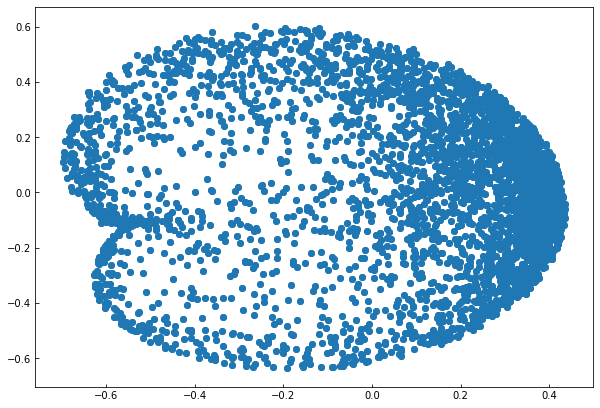

In [85]:
from sklearn.decomposition import KernelPCA
model = KernelPCA(2, kernel='rbf', gamma=None, n_jobs=-1)
    
to_plot = transform_plot(model, X_metadata)

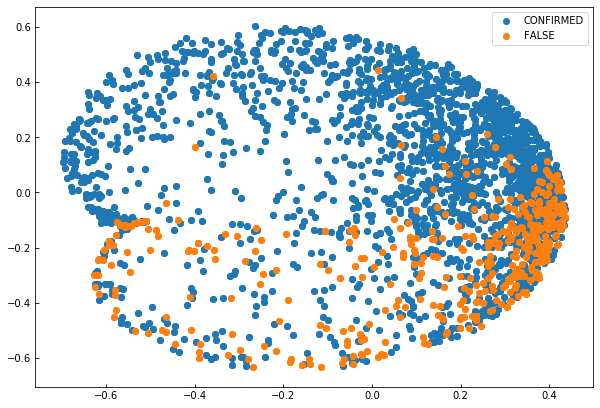

In [86]:
plt.figure(figsize=(10,7))
mask_ = (labels_transit=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED")

mask_ = (labels_transit=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE")

plt.legend()
plt.show()

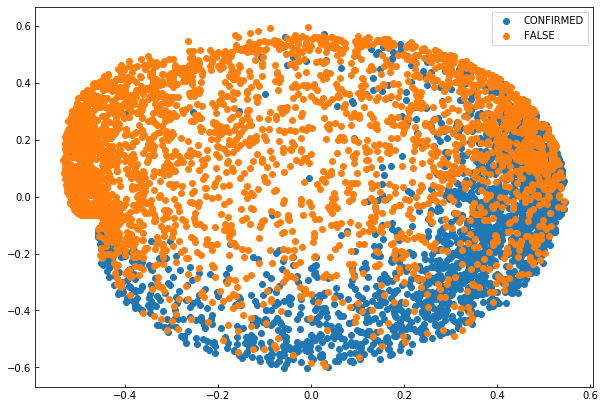

In [81]:
plt.figure(figsize=(10,7))
mask_ = (all_labels=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED")

mask_ = (all_labels=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE")

plt.legend()
plt.show()

In [ ]:
save features of all X-- avisar a cony y a pato

### Fourier de Curva 

In [ ]:
save features of all X

### FATS O FEETS?

---
## AE 
---

In [31]:
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, 1) , name ="T_inp")

x = Concatenate(axis=-1)([x_t, x_lc]) #add time encode

f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x) #bidirectional
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) #bidirectional

z = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc], z, name="encoder")

decoder_input = Input(shape=(latent_dim,))
decode = RepeatVector(T)(decoder_input)

decode = Concatenate(axis=-1)([x_t, decode]) #add time decode

decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional

decode = TimeDistributed(Dense(1, activation='linear'))(decode)
generator = Model([x_t, decoder_input], decode, name="generator")

# instantiate VAE model
out = generator([x_t, encoder([x_t, x_lc]) ])
AE_m = Model([x_t, x_lc], out)

AE_m.compile(optimizer='adam', loss=MSE_loss)
AE_m.summary()

batch_size = 64
AE_m.fit([X_train_t,X_train], X_train, epochs=200, batch_size=batch_size, 
        validation_data=([X_test_t,X_test], X_test))

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
T_inp (InputLayer)              (None, 200, 1)       0                                            
__________________________________________________________________________________________________
LC_inp (InputLayer)             (None, 200, 1)       0                                            
__________________________________________________________________________________________________
encoder (Model)                 (None, 32)           104736      T_inp[0][0]                      
                                                                 LC_inp[0][0]                     
__________________________________________________________________________________________________
generator (Model)               (None, 200, 1)       112641      T_inp[0][0]                      
          

8634/8634 [==============================] - 13s 1ms/step - loss: 0.5624
Epoch 173/200
8634/8634 [==============================] - 13s 1ms/step - loss: 0.5480
Epoch 174/200
8634/8634 [==============================] - 13s 1ms/step - loss: 0.5718
Epoch 175/200
8634/8634 [==============================] - 13s 1ms/step - loss: 0.6004
Epoch 176/200
8634/8634 [==============================] - 13s 1ms/step - loss: 0.5878
Epoch 177/200
8634/8634 [==============================] - 13s 1ms/step - loss: 0.5821
Epoch 178/200
8634/8634 [==============================] - 13s 1ms/step - loss: 0.5894
Epoch 179/200
8634/8634 [==============================] - 13s 1ms/step - loss: 0.5622
Epoch 180/200
8634/8634 [==============================] - 13s 1ms/step - loss: 0.5676
Epoch 181/200
8634/8634 [==============================] - 13s 1ms/step - loss: 0.5511
Epoch 182/200
8634/8634 [==============================] - 13s 1ms/step - loss: 0.5647
Epoch 183/200
8634/8634 [==============================] 

Errores  []


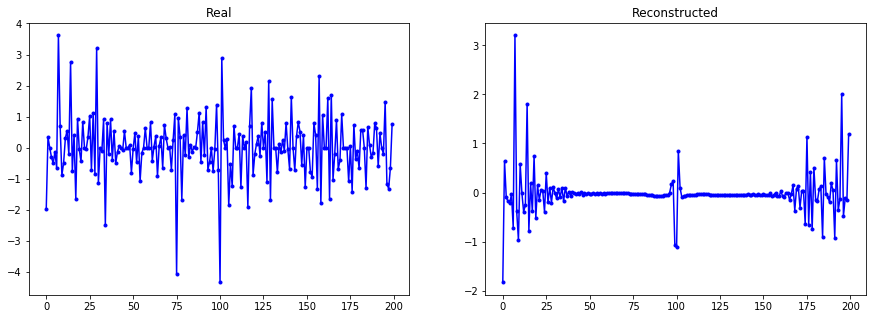

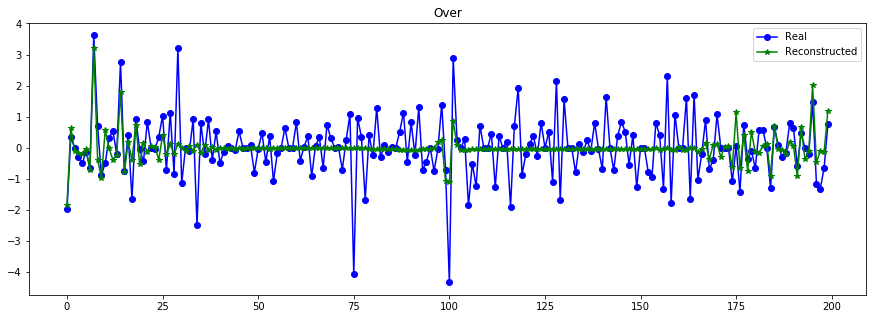

----------------------------------------------------------------


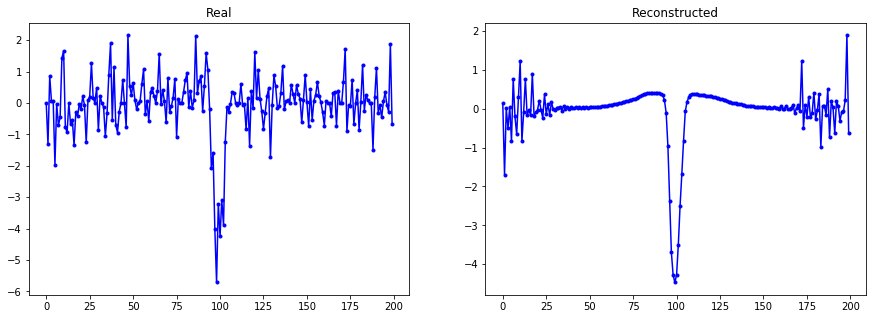

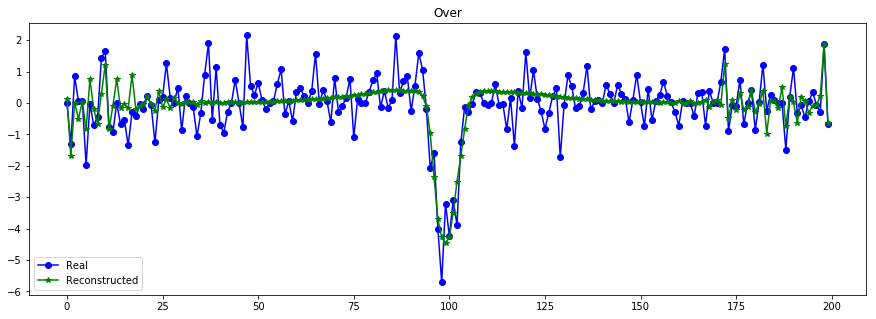

----------------------------------------------------------------


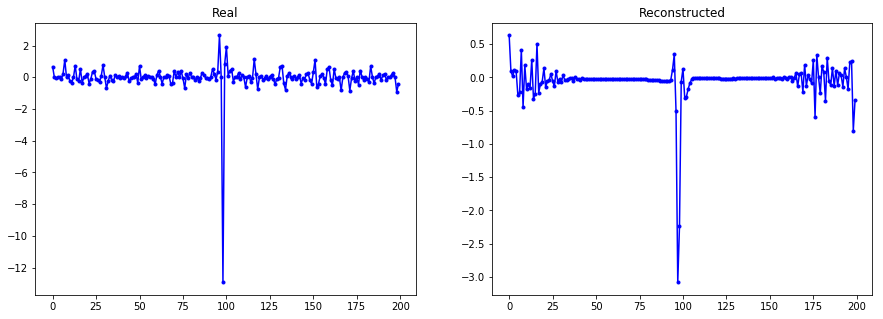

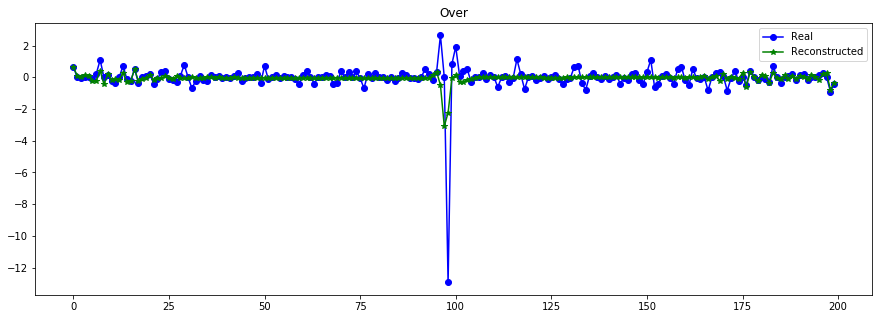

----------------------------------------------------------------


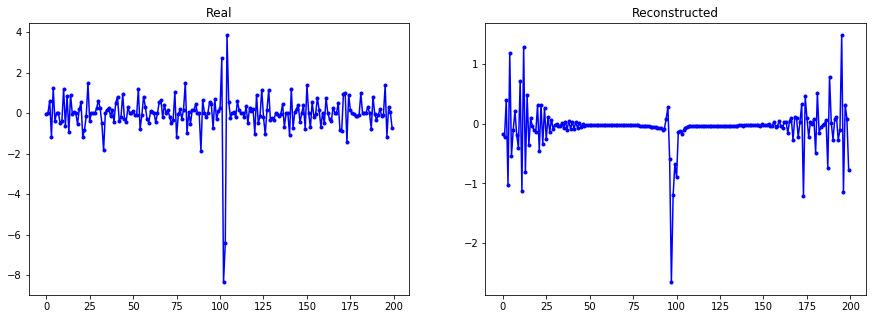

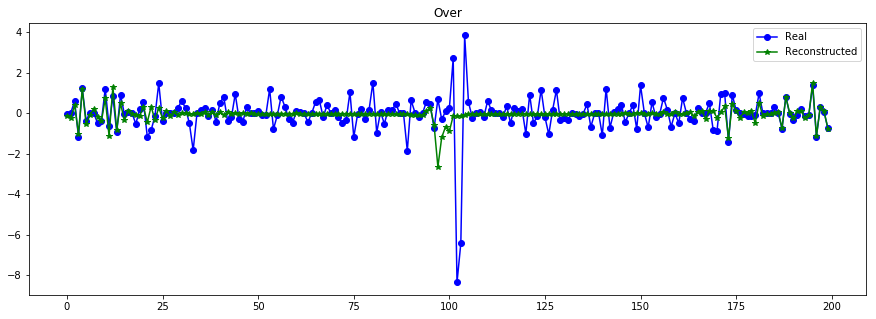

----------------------------------------------------------------


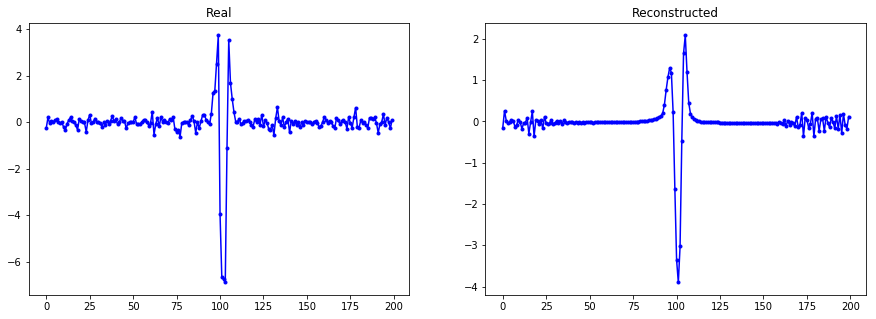

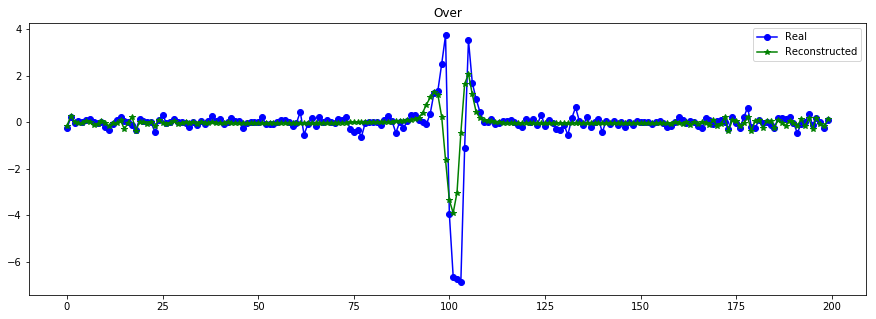

----------------------------------------------------------------


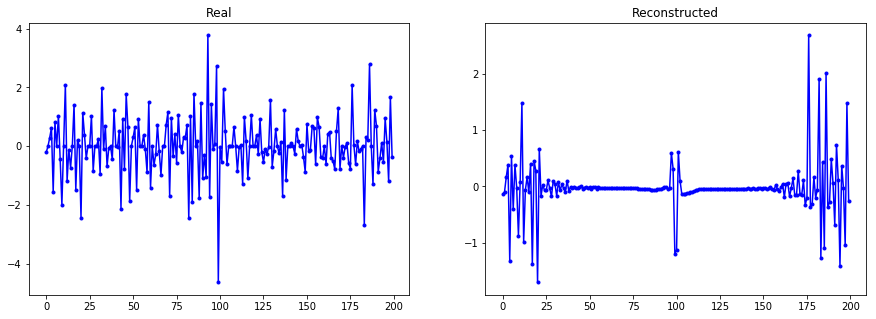

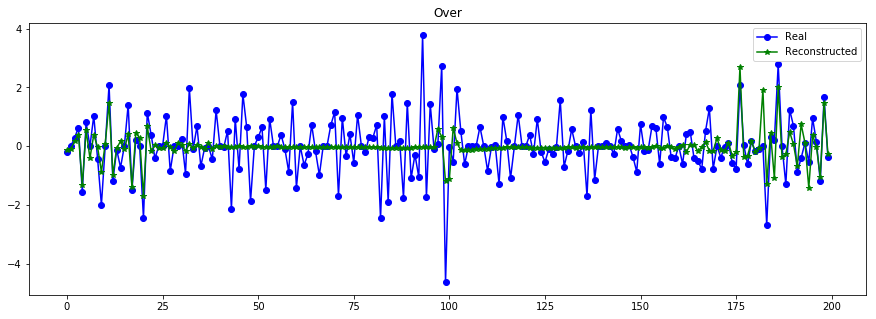

----------------------------------------------------------------


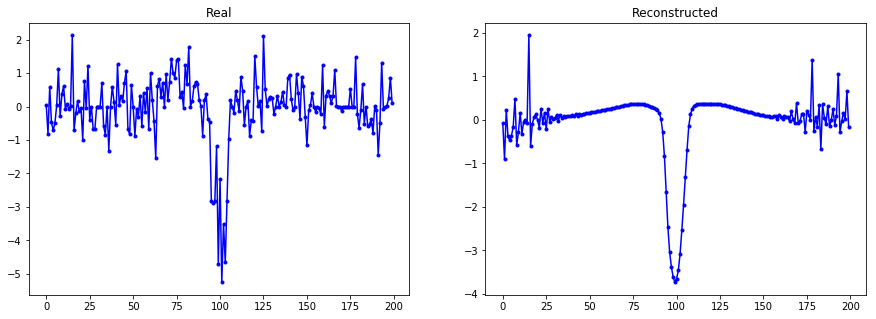

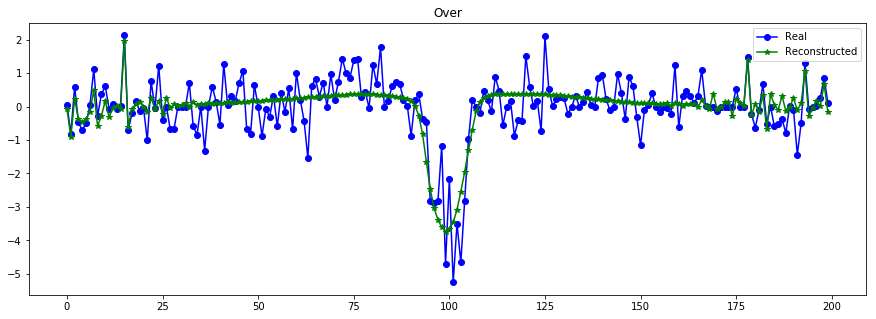

----------------------------------------------------------------


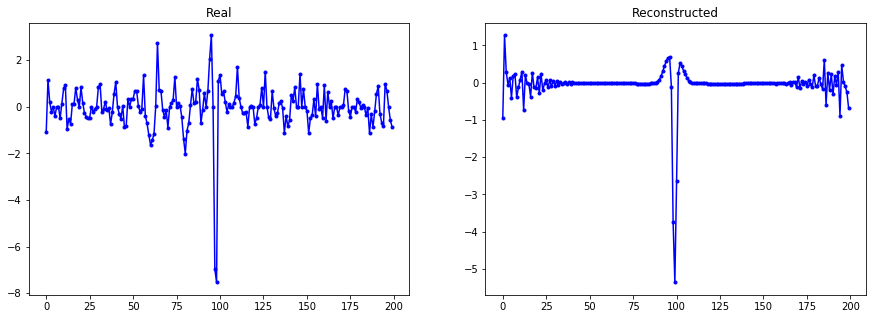

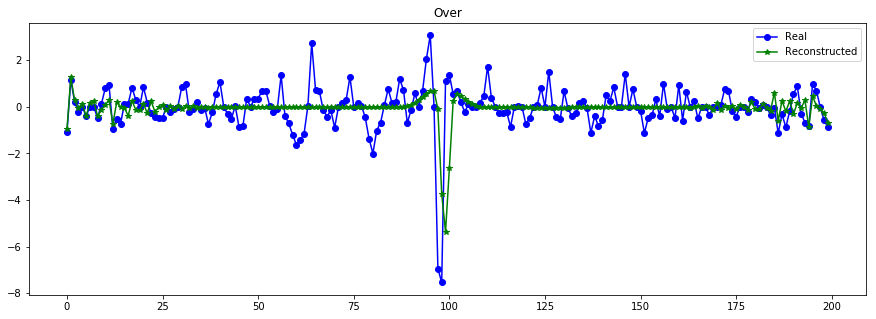

----------------------------------------------------------------


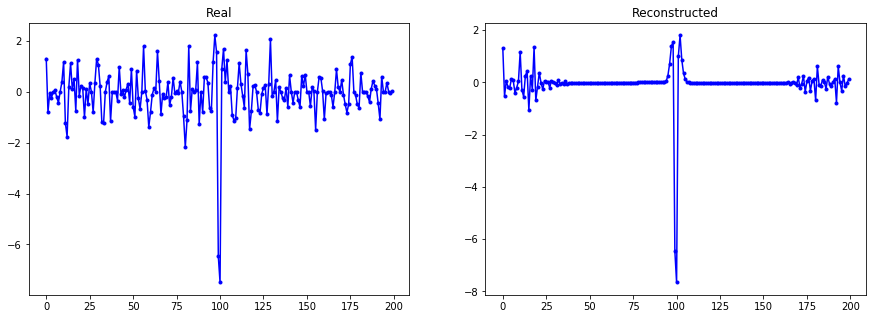

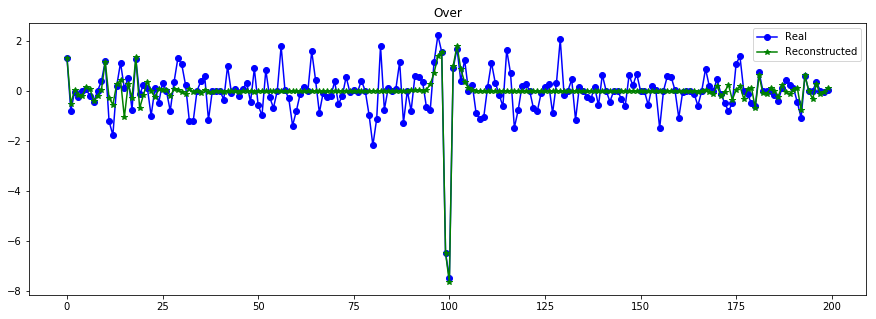

----------------------------------------------------------------


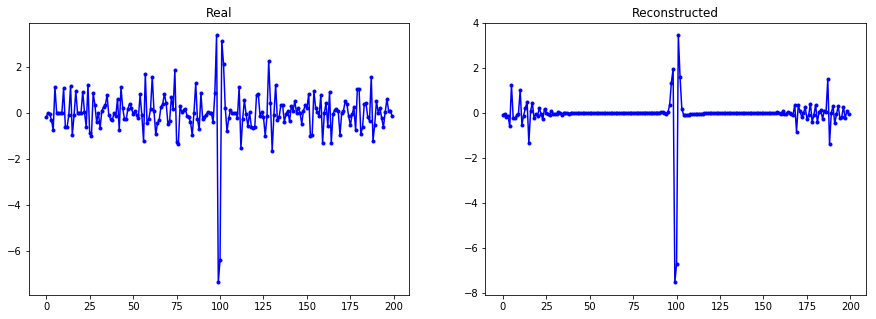

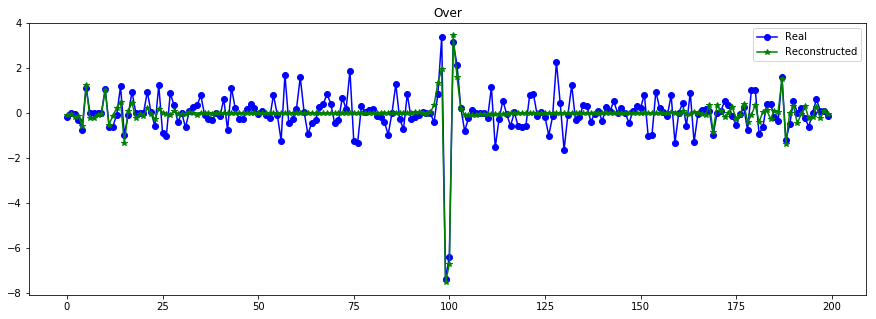

----------------------------------------------------------------


In [32]:
print("Errores ",AE_m.evaluate([X_test_t,X_test], X_test, batch_size=512))
X_train_hat = AE_m.predict([X_train_t,X_train], batch_size=512)
plot_n_lc(X_train[:,:,0], X_train_hat, n= 10) 

/home/casapanshop/anaconda2/envs/py3/lib/python3.5/site-packages/matplotlib/axes/_axes.py:6462: UserWarning: The 'normed' kwarg is deprecated, and has been replaced by the 'density' kwarg.
  warnings.warn("The 'normed' kwarg is deprecated, and has been "


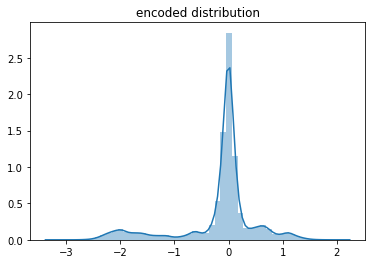

In [34]:
z_enc = encoder.predict([X_train_t, X_train], batch_size=512)

sns.distplot(z_enc.flatten())
plt.title("encoded distribution")
plt.show()

In [35]:
def transform_plot(model, data, just_plot=False):
    if just_plot:
        to_plot = data
    else:
        to_plot = model.fit_transform(data)
        
    plt.figure(figsize=(10,7))
    plt.scatter(to_plot[:,0],to_plot[:,1])
    plt.show()
    return to_plot

mask_transit = np.load("data/mask_transit_LC.py") 
Y_transit = np.tile( df_meta_obj.values[mask_transit], (2,1))
labels = np.tile((df_meta["NExScI Disposition"].values[mask_transit]),2)

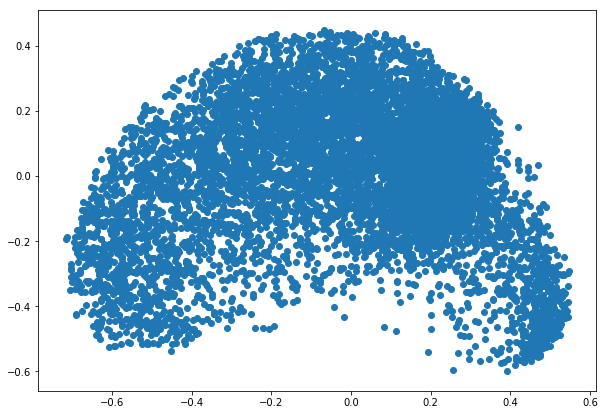

In [48]:
from sklearn.decomposition import KernelPCA
model = KernelPCA(2, kernel='rbf', gamma=0.5, n_jobs=-1)
    
to_plot = transform_plot(model, z_enc)

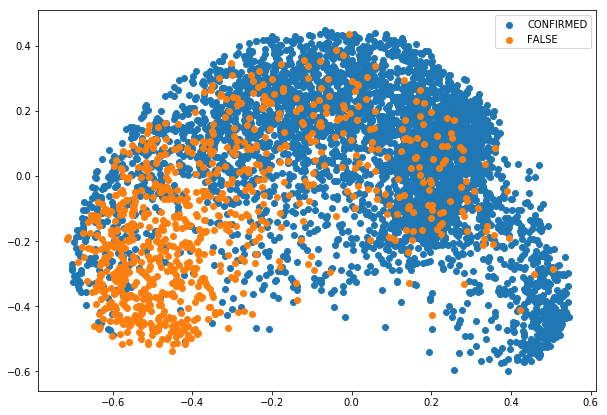

In [51]:
plt.figure(figsize=(10,7))
mask_ = (labels=="CONFIRMED")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="CONFIRMED")

mask_ = (labels=="FALSE POSITIVE")
plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="FALSE")
plt.legend()
plt.show()

### clustering

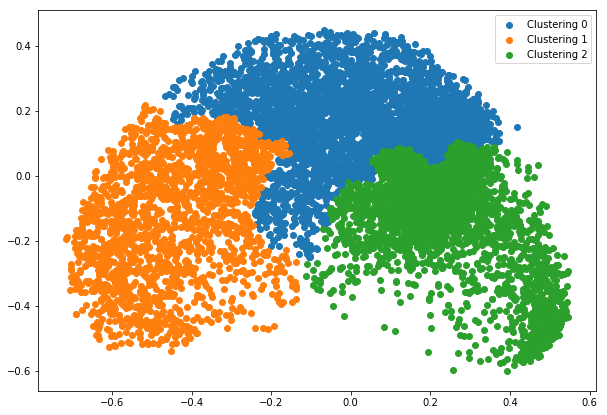

In [52]:
from sklearn.cluster import MiniBatchKMeans, KMeans, AgglomerativeClustering
K = 3
#model = KMeans(n_clusters = K, init='k-means++', n_jobs = -1)
model = AgglomerativeClustering(n_clusters=K, linkage='ward')

model.fit(to_plot)
clus_l = model.labels_

plt.figure(figsize=(10,7))
for i in range(K):
    mask_ = (clus_l==i)
    plt.scatter(to_plot[:,0][mask_],to_plot[:,1][mask_], label="Clustering "+str(i))
plt.legend()
plt.show()

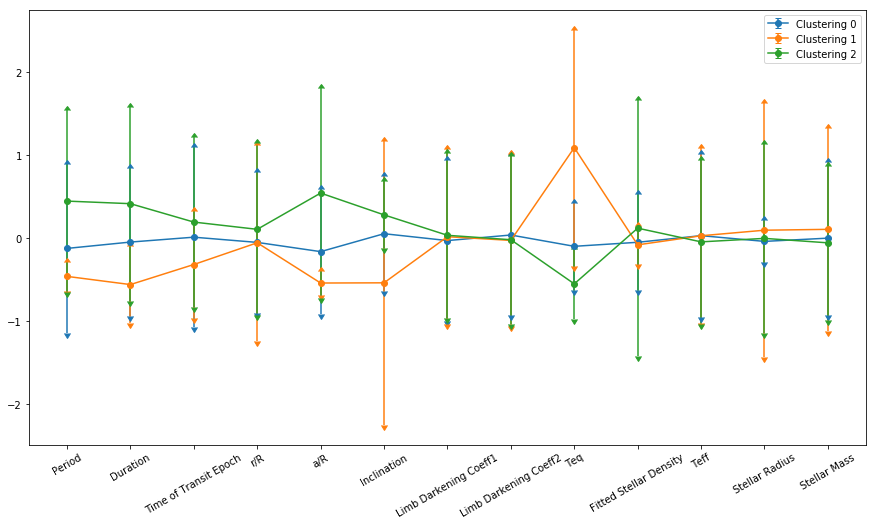

In [53]:
from sklearn.preprocessing import StandardScaler
std = StandardScaler()
Y_transit_s = std.fit_transform(Y_transit)

clus_met_reps = []
clus_met_std = []
for i in range(K):
    mask_ = (clus_l==i)
    values = Y_transit_s[mask_]
    clus_met_reps.append(np.mean(values,axis =0))
    clus_met_std.append(np.std(values,axis =0))
    
metad = list(df_meta_obj.columns)
x = np.arange(len(metad))

plt.figure(figsize=(15,8))
for i in range(K):
    plt.errorbar(x, y=clus_met_reps[i], yerr=clus_met_std[i], label="Clustering "+str(i), fmt='o-', 
                 uplims=True,lolims=True)
plt.xticks(x, metad, rotation=30)
plt.legend()
plt.show()

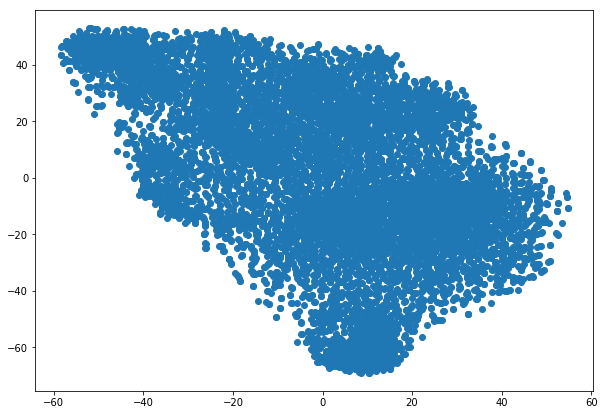

In [55]:
from sklearn.manifold import TSNE
model = TSNE(2, metric='euclidean') #, n_jobs=-1)

to_plot = transform_plot(model, z_enc)

In [42]:
def scaled_MSE(y_true,y_pred,scale):
    return np.mean(np.mean( scale**2 * np.mean( (y_true - y_pred)**2 , axis=1), axis=0))

def Multiply_layer(args):
    x,s = args
    return x*s[:,None,:]
def Divide_layer(args):
    x,s = args
    return x/s[:,None,:]

S_train = 1/np.std(X_train, axis=1)
S_test = 1/np.std(X_test, axis=1)

#escalar la escala?
S_mu = np.mean(S_train)
S_std = np.std(S_train)
def Normalization_L(x,mu,std):
    return (x-mu)/std
def RevertNorm_L(x,mu,std):
    return std*x+mu

S_train.shape

(6490, 1)

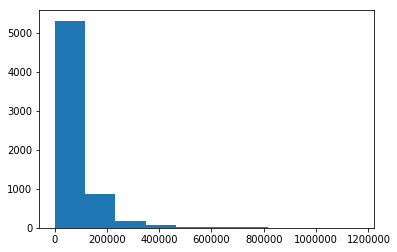

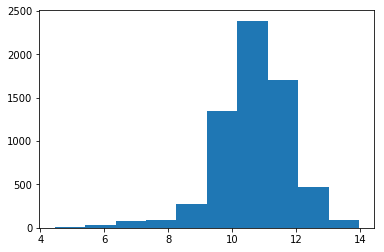

In [73]:
plt.hist(S_train)
plt.show()
plt.hist(np.log(S_train))
plt.show()

In [17]:
def S_loss(y_true, y_pred):
    s = vae.get_layer("encoder").get_layer("norm").output
    z_mean = vae.get_layer("encoder").outputs[0]
    
    R_layer = vae.get_layer("generator").get_layer("reconsnorm")
    s_hat = R_layer(z_mean)
    return K.mean( K.square( s - s_hat ), axis=-1)

def ae_loss_S(y_true, y_pred):
    return MSE_loss(y_true, y_pred) + S_loss(y_true, y_pred)

In [36]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, 1) , name ="T_inp")
s = Input(shape= (1,), name="scale_inp") #NEW: Extension: depende de x

x_lc_s = Lambda(Multiply_layer, name="Multiply")([x_lc,s]) #NEW: escalar data

##### CODIFY LIGHT CURVE ######
x = Concatenate(axis=-1)([x_t, x_lc_s]) 
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x)
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) 

##### CODIFY SCALE AND CONCATENATE ######
f1_s = Lambda(Normalization_L, arguments={'mu':S_mu,'std':S_std}, name="norm")(s) #mas capas?
#f1_s = Dense(4, activation='relu')(f1_s) #o tanh
f1 = Concatenate(axis=-1)([f1, f1_s]) #NEW: agregar escala a codificar

##### GET THE LATENT VARIABLE ######
z_mean = Dense(latent_dim,activation='linear')(f1)
#z_log_var = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, s], z_mean, name="encoder")

##### DO THE SAMPLING ######
#z = Lambda(sampling, output_shape=(latent_dim,), name='sample')([z_mean, z_log_var])
#samp_encoder = Model([x_t, x_lc,s], z, name="encoder_sampling")

##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,))

##### RECONSTRCT SCALE ######
#s_out = Dense(4, activation='relu')(decoder_input)
s_out = Dense(1, activation='linear', name="reconsnorm")(decoder_input) #NEW: aprende s o 1/s 
s_out = Lambda(RevertNorm_L, arguments={'mu':S_mu,'std':S_std},name="revertnorm")(s_out) #NEW: volver a escala normal 
aux_model = Model(decoder_input, s_out)
s_model = Model([x_t, x_lc, s], aux_model(encoder([x_t, x_lc, s])))

##### RECONSTRUCT LIGHT CURVE ######
decode = RepeatVector(T)(decoder_input)
decode = Concatenate(axis=-1)([x_t, decode]) #add time decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
decode = TimeDistributed(Dense(1, activation='linear'))(decode)

decode = Lambda(Divide_layer, name="Divide")([decode, s_out]) #NEW: 

generator = Model([x_t, decoder_input], decode, name="generator")

##### VAE MODEL ######
out = generator([x_t, encoder([x_t, x_lc, s])])  #samp_encoder([x_t, x_lc, s]) ])
vae = Model([x_t, x_lc, s], out)

vae.compile(optimizer='adam', loss=MSE_loss, metrics = [MSE_loss])
vae.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
T_inp (InputLayer)              (None, 200, 1)       0                                            
__________________________________________________________________________________________________
LC_inp (InputLayer)             (None, 200, 1)       0                                            
__________________________________________________________________________________________________
scale_inp (InputLayer)          (None, 1)            0                                            
__________________________________________________________________________________________________
encoder (Model)                 (None, 32)           104768      T_inp[0][0]                      
                                                                 LC_inp[0][0]                     
          

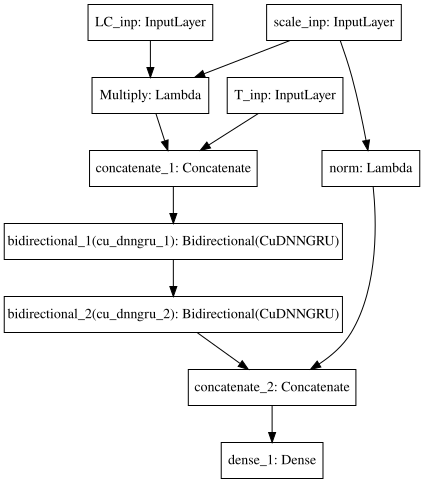

In [19]:
SVG(model_to_dot(encoder).create(prog='dot', format='svg'))

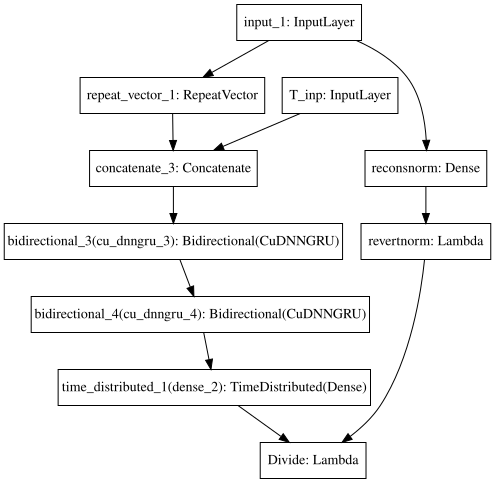

In [20]:
SVG(model_to_dot(generator).create(prog='dot', format='svg'))

In [197]:
batch_size = 64
vae.fit([X_train_t,X_train, S_train], X_train, epochs=500, batch_size=batch_size, sample_weight=(S_train**2)[:,0],
        validation_data=([X_test_t,X_test,S_test], X_test)) #a 1

Train on 6484 samples, validate on 1075 samples
Epoch 1/500
6484/6484 [==============================] - 30s 5ms/step - loss: 1.0123 - MSE_loss: 1.4266e-07 - val_loss: 7.9734e-08 - val_MSE_loss: 7.9734e-08
Epoch 2/500
6484/6484 [==============================] - 12s 2ms/step - loss: 1.0023 - MSE_loss: 1.4265e-07 - val_loss: 7.9733e-08 - val_MSE_loss: 7.9733e-08
Epoch 3/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0018 - MSE_loss: 1.4266e-07 - val_loss: 7.9728e-08 - val_MSE_loss: 7.9728e-08
Epoch 4/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0013 - MSE_loss: 1.4265e-07 - val_loss: 7.9727e-08 - val_MSE_loss: 7.9727e-08
Epoch 5/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0007 - MSE_loss: 1.4265e-07 - val_loss: 7.9721e-08 - val_MSE_loss: 7.9721e-08
Epoch 6/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.5173 - MSE_loss: 1.4272e-07 - val_loss: 7.9810e-08 - val_MSE_loss: 7.9810e-08
Epoc

6484/6484 [==============================] - 11s 2ms/step - loss: 0.9852 - MSE_loss: 1.4239e-07 - val_loss: 7.9406e-08 - val_MSE_loss: 7.9406e-08
Epoch 104/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0034 - MSE_loss: 1.4245e-07 - val_loss: 7.9722e-08 - val_MSE_loss: 7.9722e-08
Epoch 105/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.9992 - MSE_loss: 1.4263e-07 - val_loss: 7.9699e-08 - val_MSE_loss: 7.9699e-08
Epoch 106/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.9947 - MSE_loss: 1.4259e-07 - val_loss: 7.9733e-08 - val_MSE_loss: 7.9733e-08
Epoch 107/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0008 - MSE_loss: 1.4265e-07 - val_loss: 7.9721e-08 - val_MSE_loss: 7.9721e-08
Epoch 108/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.9959 - MSE_loss: 1.4260e-07 - val_loss: 7.9651e-08 - val_MSE_loss: 7.9651e-08
Epoch 109/500
6484/6484 [=============================

6484/6484 [==============================] - 11s 2ms/step - loss: 0.7337 - MSE_loss: 1.2531e-07 - val_loss: 6.3287e-08 - val_MSE_loss: 6.3287e-08
Epoch 206/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.9013 - MSE_loss: 1.2853e-07 - val_loss: 7.9716e-08 - val_MSE_loss: 7.9716e-08
Epoch 207/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0081 - MSE_loss: 1.4265e-07 - val_loss: 7.9722e-08 - val_MSE_loss: 7.9722e-08
Epoch 208/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0026 - MSE_loss: 1.4263e-07 - val_loss: 7.9706e-08 - val_MSE_loss: 7.9706e-08
Epoch 209/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0007 - MSE_loss: 1.4261e-07 - val_loss: 7.9690e-08 - val_MSE_loss: 7.9690e-08
Epoch 210/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.9990 - MSE_loss: 1.4259e-07 - val_loss: 7.9682e-08 - val_MSE_loss: 7.9682e-08
Epoch 211/500
6484/6484 [=============================

6484/6484 [==============================] - 11s 2ms/step - loss: 0.7396 - MSE_loss: 1.2185e-07 - val_loss: 6.1266e-08 - val_MSE_loss: 6.1266e-08
Epoch 308/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.8530 - MSE_loss: 1.3831e-07 - val_loss: 7.7693e-08 - val_MSE_loss: 7.7693e-08
Epoch 309/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.8041 - MSE_loss: 1.3961e-07 - val_loss: 7.7215e-08 - val_MSE_loss: 7.7215e-08
Epoch 310/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.7802 - MSE_loss: 1.3839e-07 - val_loss: 7.6775e-08 - val_MSE_loss: 7.6775e-08
Epoch 311/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.7790 - MSE_loss: 1.3785e-07 - val_loss: 7.6088e-08 - val_MSE_loss: 7.6088e-08
Epoch 312/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.7583 - MSE_loss: 1.3797e-07 - val_loss: 7.4711e-08 - val_MSE_loss: 7.4711e-08
Epoch 313/500
6484/6484 [=============================

6484/6484 [==============================] - 11s 2ms/step - loss: 0.9739 - MSE_loss: 1.4249e-07 - val_loss: 7.9567e-08 - val_MSE_loss: 7.9567e-08
Epoch 410/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.9604 - MSE_loss: 1.4244e-07 - val_loss: 7.9529e-08 - val_MSE_loss: 7.9529e-08
Epoch 411/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.9538 - MSE_loss: 1.4241e-07 - val_loss: 7.9510e-08 - val_MSE_loss: 7.9510e-08
Epoch 412/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.9490 - MSE_loss: 1.4238e-07 - val_loss: 7.9479e-08 - val_MSE_loss: 7.9479e-08
Epoch 413/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.9432 - MSE_loss: 1.4235e-07 - val_loss: 7.9451e-08 - val_MSE_loss: 7.9451e-08
Epoch 414/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.9373 - MSE_loss: 1.4232e-07 - val_loss: 7.9429e-08 - val_MSE_loss: 7.9429e-08
Epoch 415/500
6484/6484 [=============================

1075/1075 [==============================] - 0s 239us/step
Errores  [7.67626542489692e-08, 7.67626542489692e-08]


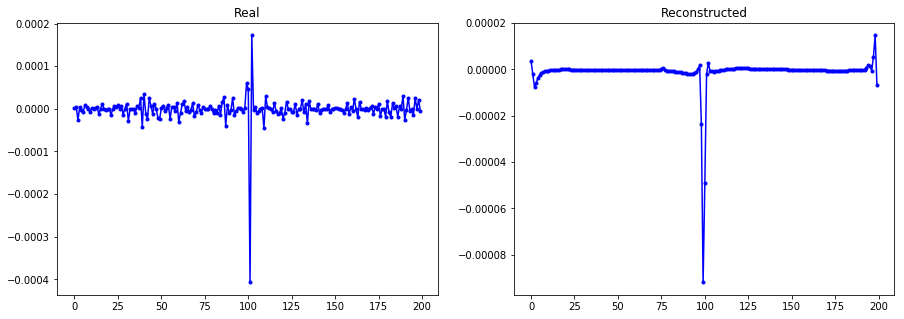

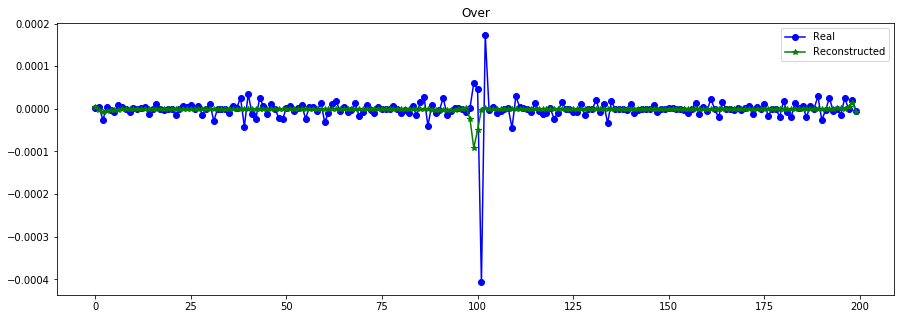

----------------------------------------------------------------


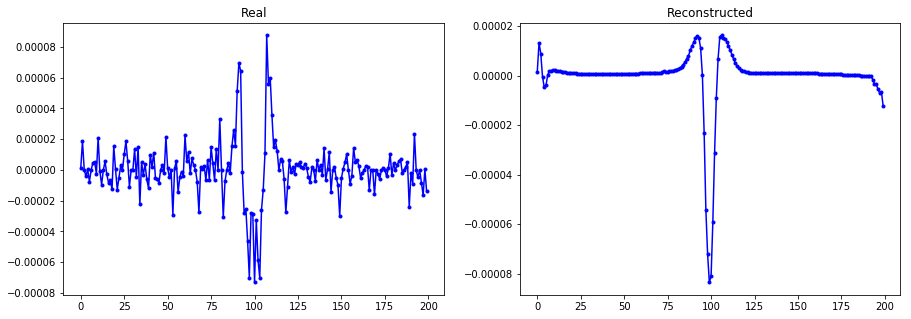

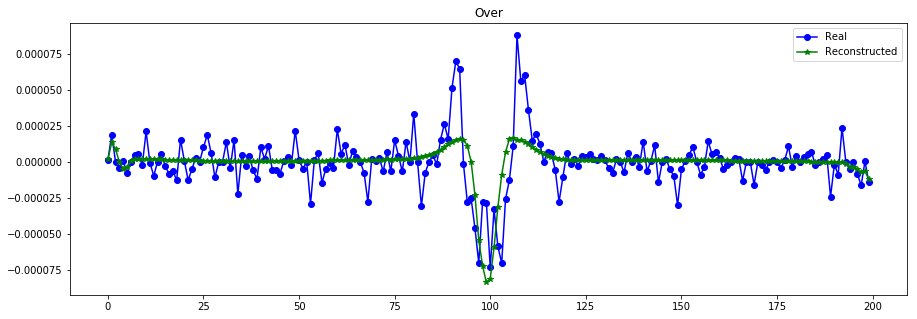

----------------------------------------------------------------


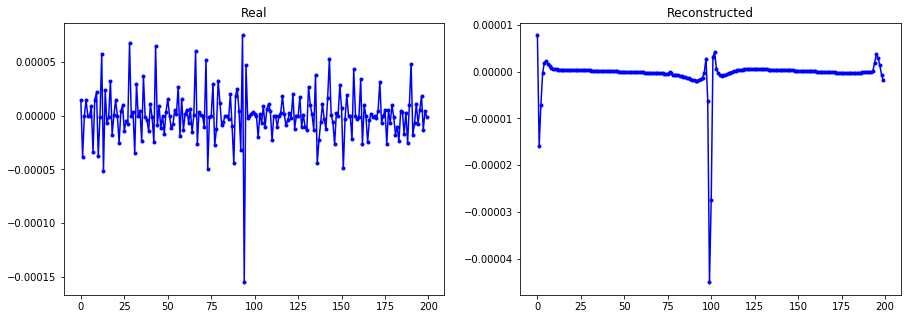

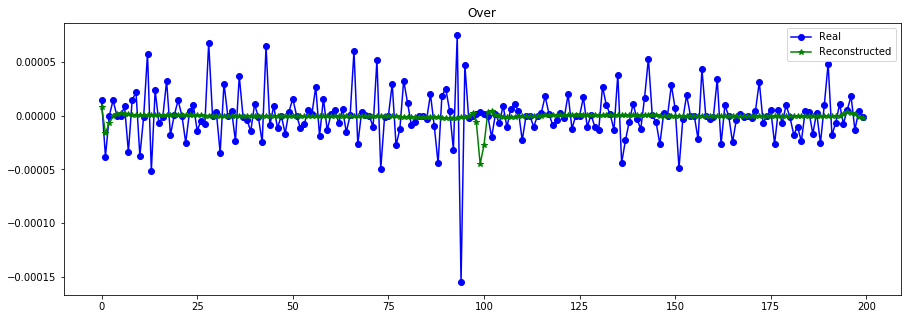

----------------------------------------------------------------


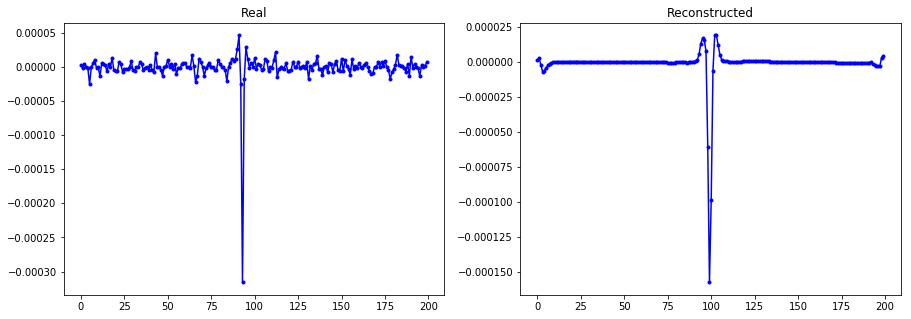

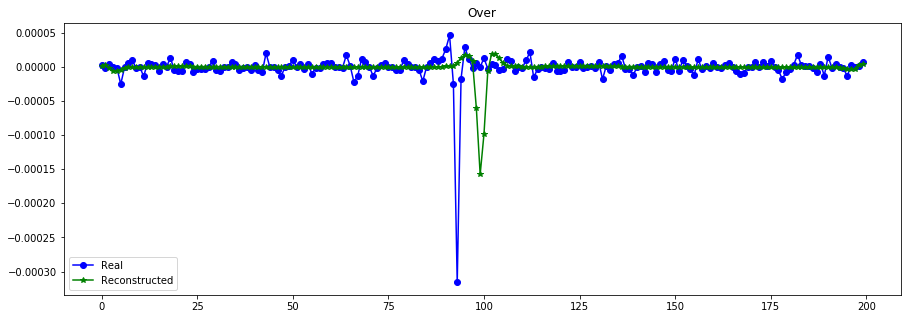

----------------------------------------------------------------


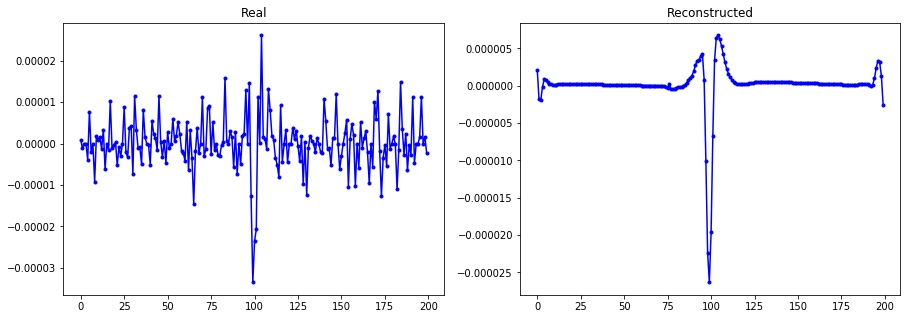

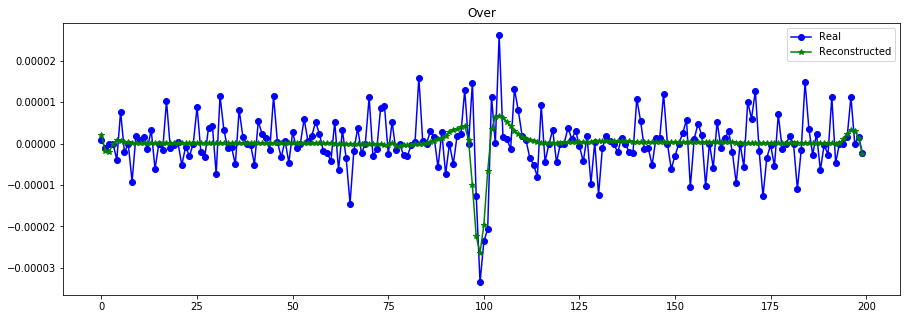

----------------------------------------------------------------


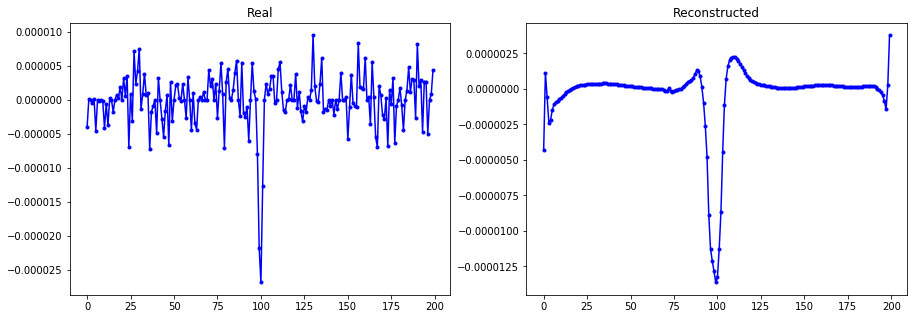

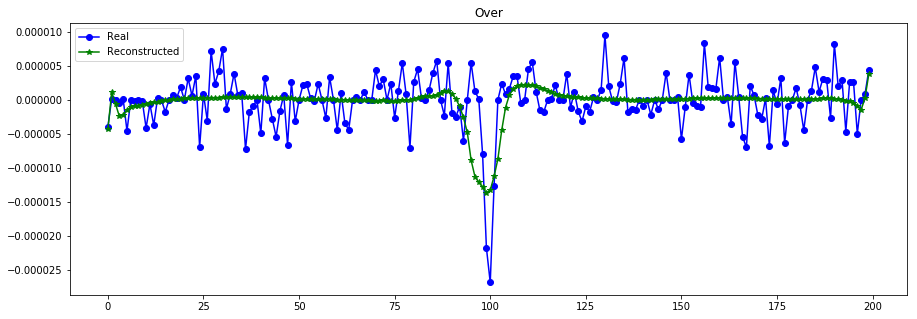

----------------------------------------------------------------


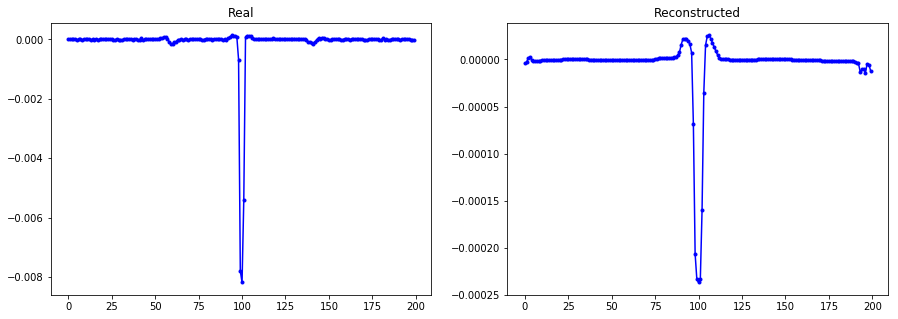

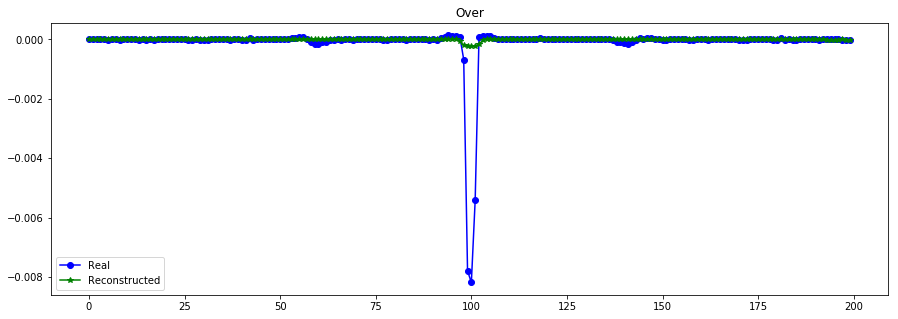

----------------------------------------------------------------


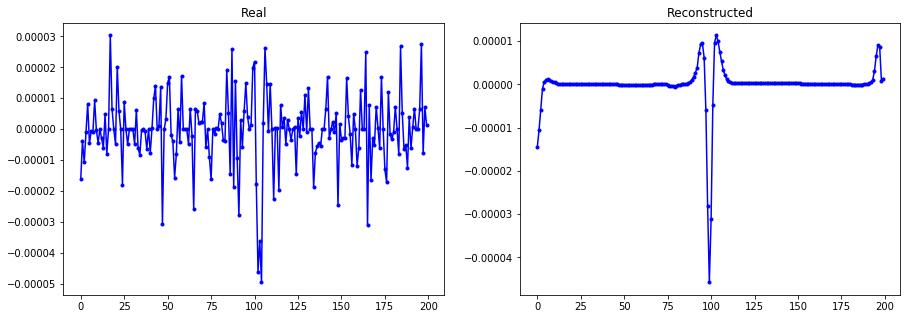

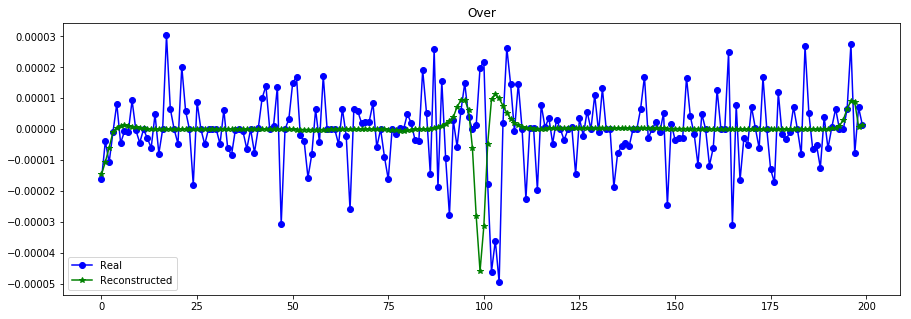

----------------------------------------------------------------


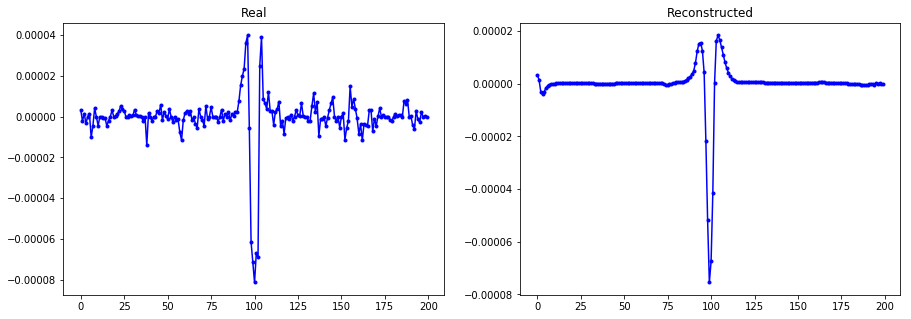

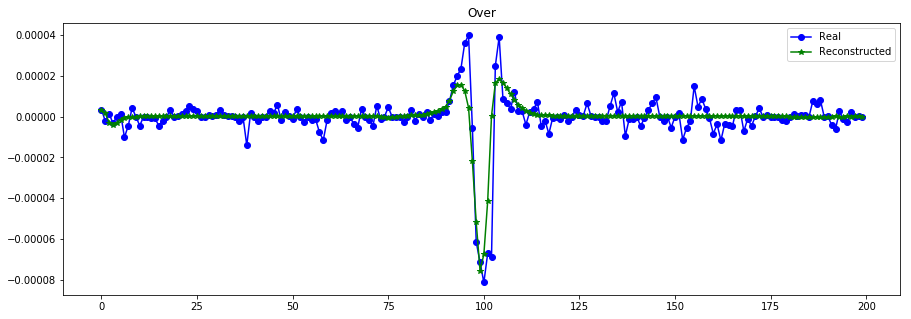

----------------------------------------------------------------


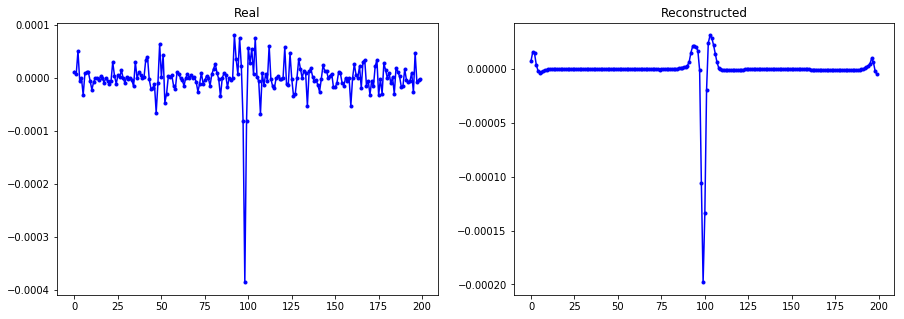

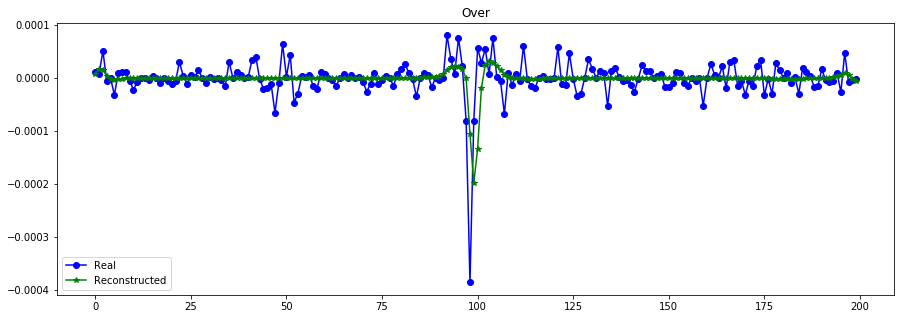

----------------------------------------------------------------


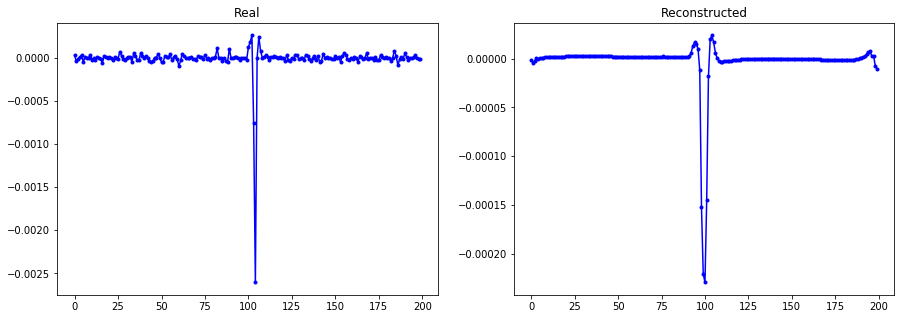

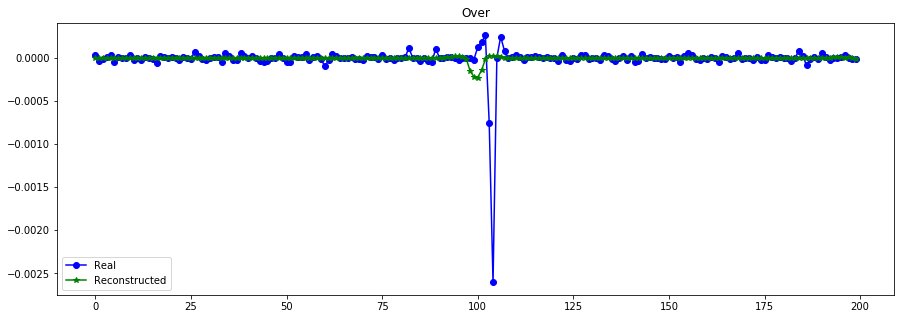

----------------------------------------------------------------


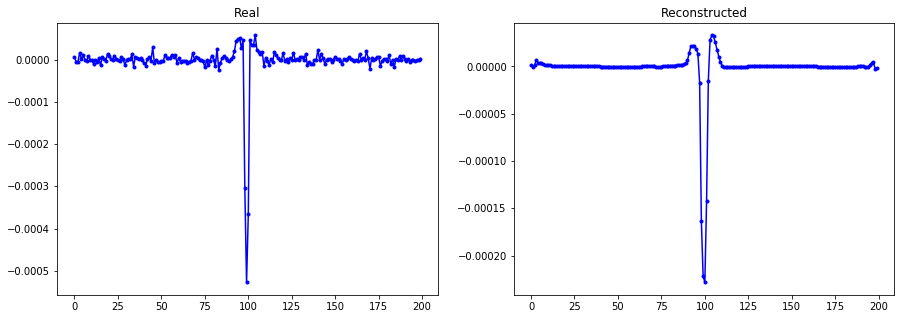

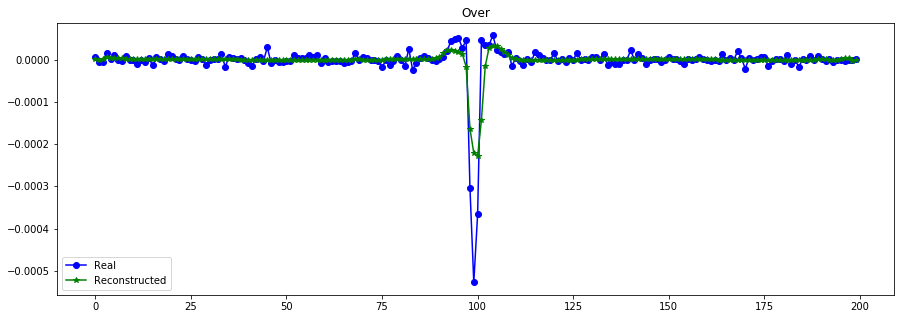

----------------------------------------------------------------


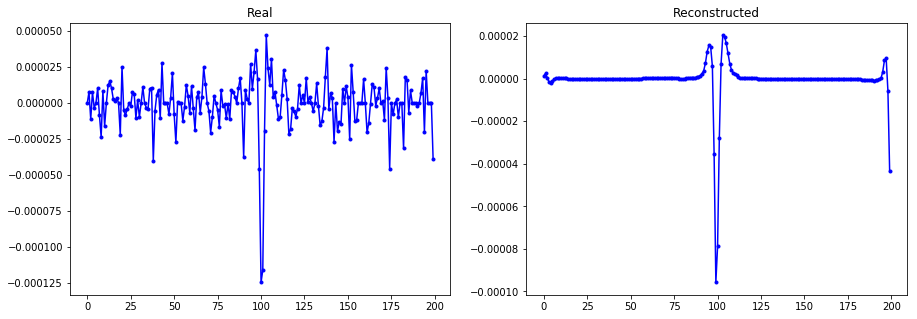

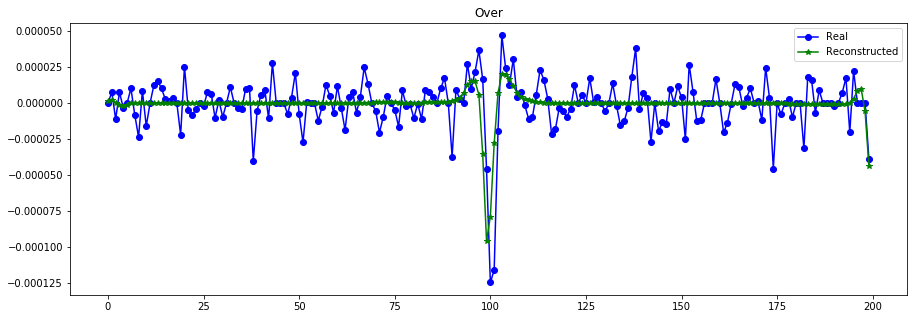

----------------------------------------------------------------


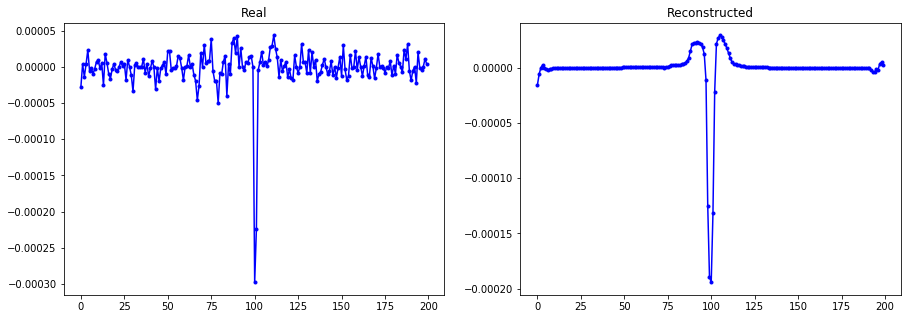

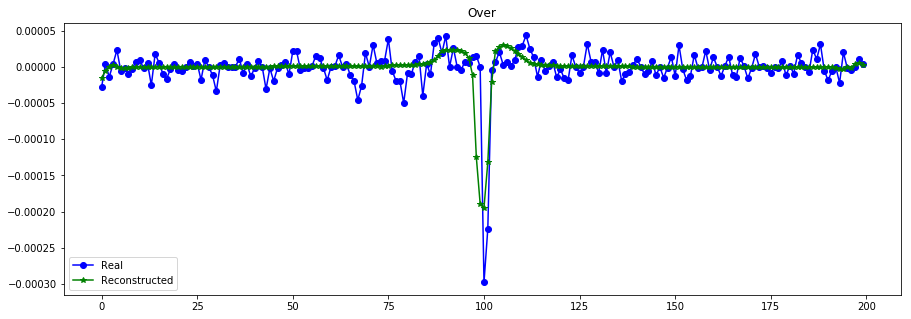

----------------------------------------------------------------


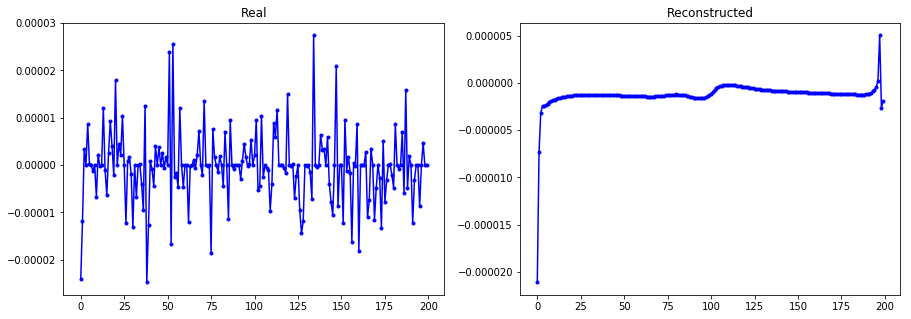

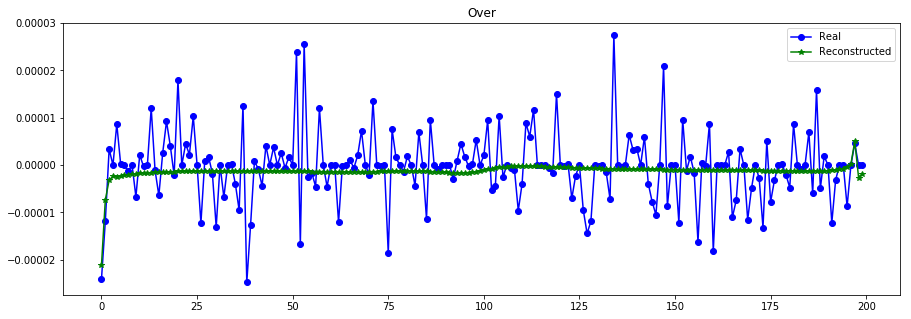

----------------------------------------------------------------


In [198]:
print("Errores ",vae.evaluate([X_test_t,X_test, S_test], X_test, batch_size=512))
X_train_hat = vae.predict([X_train_t,X_train, S_train], batch_size=512)
plot_n_lc(X_train[:,:,0], X_train_hat, n= 15) #

In [199]:
print(mean_squared_error(S_train, s_model.predict([X_train_t,X_train, S_train], batch_size=512) ))
s_model.predict([X_train_t,X_train, S_train], batch_size=512)

array([[266742.75],
       [278990.7 ],
       [328088.  ],
       ...,
       [273924.66],
       [259893.2 ],
       [338685.44]], dtype=float32)

In [201]:
batch_size = 64
vae.fit([X_train_t,X_train, S_train], X_train, epochs=500, batch_size=batch_size, sample_weight=(S_train**2)[:,0],
        validation_data=([X_test_t,X_test,S_test], X_test)) #con dnese de 4 (deberia funcionar)

Train on 6484 samples, validate on 1075 samples
Epoch 1/500
6484/6484 [==============================] - 29s 5ms/step - loss: 1.0806 - MSE_loss: 1.4266e-07 - val_loss: 7.9732e-08 - val_MSE_loss: 7.9732e-08
Epoch 2/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0028 - MSE_loss: 1.4264e-07 - val_loss: 7.9717e-08 - val_MSE_loss: 7.9717e-08
Epoch 3/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0021 - MSE_loss: 1.4262e-07 - val_loss: 7.9693e-08 - val_MSE_loss: 7.9693e-08
Epoch 4/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.0076 - MSE_loss: 1.4263e-07 - val_loss: 7.9739e-08 - val_MSE_loss: 7.9739e-08
Epoch 5/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.3167 - MSE_loss: 1.4276e-07 - val_loss: 7.9727e-08 - val_MSE_loss: 7.9727e-08
Epoch 6/500
6484/6484 [==============================] - 11s 2ms/step - loss: 1.1228 - MSE_loss: 1.4264e-07 - val_loss: 7.9702e-08 - val_MSE_loss: 7.9702e-08
Epoc

6484/6484 [==============================] - 11s 2ms/step - loss: 0.8374 - MSE_loss: 1.3956e-07 - val_loss: 7.6900e-08 - val_MSE_loss: 7.6900e-08
Epoch 104/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.8116 - MSE_loss: 1.3936e-07 - val_loss: 7.7250e-08 - val_MSE_loss: 7.7250e-08
Epoch 105/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.8225 - MSE_loss: 1.3934e-07 - val_loss: 7.6813e-08 - val_MSE_loss: 7.6813e-08
Epoch 106/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.8080 - MSE_loss: 1.3928e-07 - val_loss: 7.6817e-08 - val_MSE_loss: 7.6817e-08
Epoch 107/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.8106 - MSE_loss: 1.3920e-07 - val_loss: 7.6810e-08 - val_MSE_loss: 7.6810e-08
Epoch 108/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.8174 - MSE_loss: 1.3918e-07 - val_loss: 7.6862e-08 - val_MSE_loss: 7.6862e-08
Epoch 109/500
6484/6484 [=============================

6484/6484 [==============================] - 11s 2ms/step - loss: 0.7031 - MSE_loss: 1.2881e-07 - val_loss: 6.8395e-08 - val_MSE_loss: 6.8395e-08
Epoch 206/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.6919 - MSE_loss: 1.2908e-07 - val_loss: 6.9147e-08 - val_MSE_loss: 6.9147e-08
Epoch 207/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.6978 - MSE_loss: 1.2844e-07 - val_loss: 6.7195e-08 - val_MSE_loss: 6.7195e-08
Epoch 208/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.7009 - MSE_loss: 1.2794e-07 - val_loss: 6.7391e-08 - val_MSE_loss: 6.7391e-08
Epoch 209/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.6901 - MSE_loss: 1.2756e-07 - val_loss: 6.6823e-08 - val_MSE_loss: 6.6823e-08
Epoch 210/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.7242 - MSE_loss: 1.2854e-07 - val_loss: 6.8464e-08 - val_MSE_loss: 6.8464e-08
Epoch 211/500
6484/6484 [=============================

6484/6484 [==============================] - 11s 2ms/step - loss: 0.7839 - MSE_loss: 1.3357e-07 - val_loss: 7.3843e-08 - val_MSE_loss: 7.3843e-08
Epoch 308/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.7130 - MSE_loss: 1.2432e-07 - val_loss: 6.2662e-08 - val_MSE_loss: 6.2662e-08
Epoch 309/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.6827 - MSE_loss: 1.2227e-07 - val_loss: 6.2135e-08 - val_MSE_loss: 6.2135e-08
Epoch 310/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.6654 - MSE_loss: 1.2059e-07 - val_loss: 6.2172e-08 - val_MSE_loss: 6.2172e-08
Epoch 311/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.6746 - MSE_loss: 1.2048e-07 - val_loss: 6.1150e-08 - val_MSE_loss: 6.1150e-08
Epoch 312/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.6550 - MSE_loss: 1.1984e-07 - val_loss: 6.0133e-08 - val_MSE_loss: 6.0133e-08
Epoch 313/500
6484/6484 [=============================

6484/6484 [==============================] - 11s 2ms/step - loss: 0.5879 - MSE_loss: 1.1125e-07 - val_loss: 5.4053e-08 - val_MSE_loss: 5.4053e-08
Epoch 410/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.5942 - MSE_loss: 1.1152e-07 - val_loss: 5.3240e-08 - val_MSE_loss: 5.3240e-08
Epoch 411/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.6213 - MSE_loss: 1.2541e-07 - val_loss: 6.1482e-08 - val_MSE_loss: 6.1482e-08
Epoch 412/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.5670 - MSE_loss: 1.1063e-07 - val_loss: 5.3210e-08 - val_MSE_loss: 5.3210e-08
Epoch 413/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.5787 - MSE_loss: 1.0868e-07 - val_loss: 5.2048e-08 - val_MSE_loss: 5.2048e-08
Epoch 414/500
6484/6484 [==============================] - 11s 2ms/step - loss: 0.5738 - MSE_loss: 1.0699e-07 - val_loss: 5.2603e-08 - val_MSE_loss: 5.2603e-08
Epoch 415/500
6484/6484 [=============================

1075/1075 [==============================] - 0s 254us/step
Errores  [4.8834259010025494e-08, 4.8834259010025494e-08]


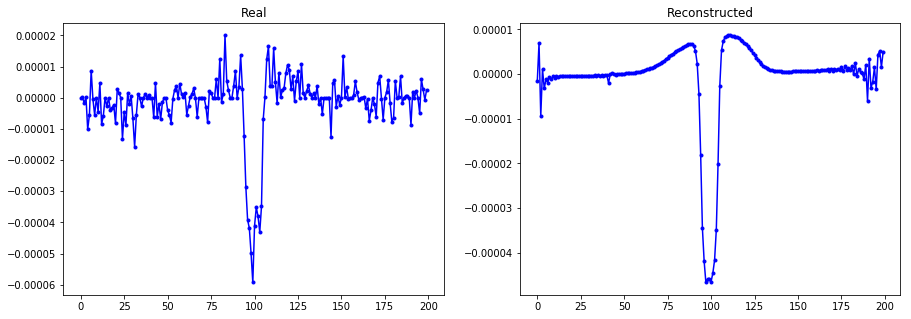

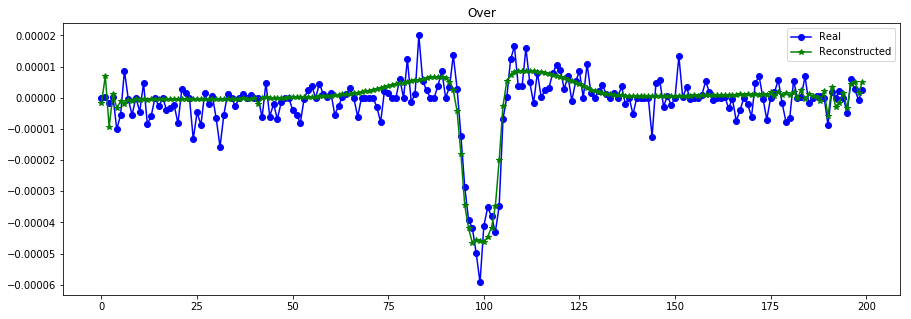

----------------------------------------------------------------


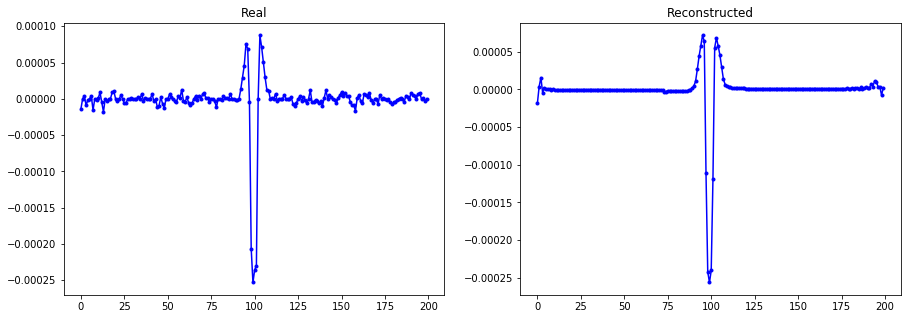

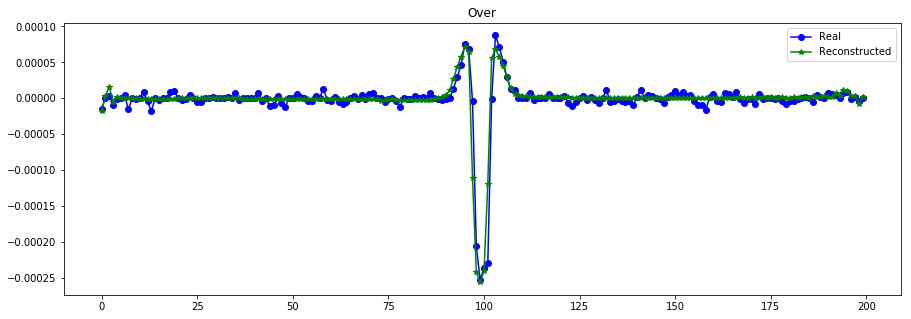

----------------------------------------------------------------


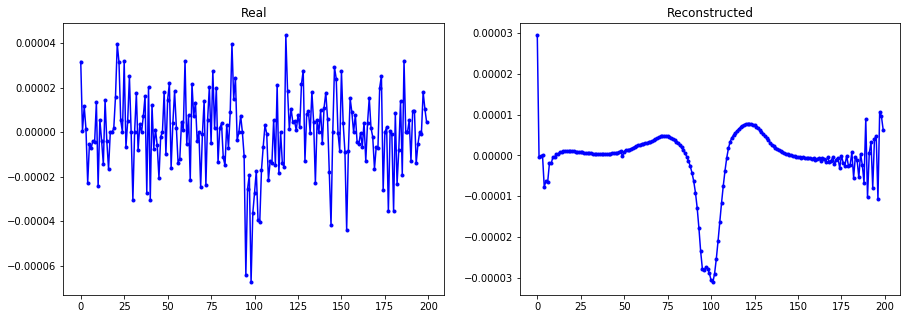

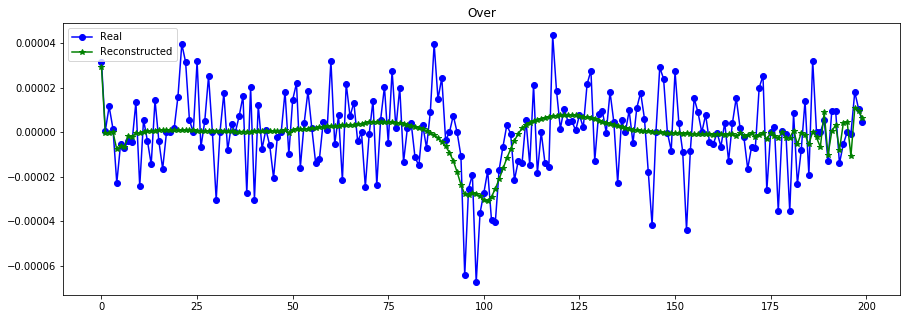

----------------------------------------------------------------


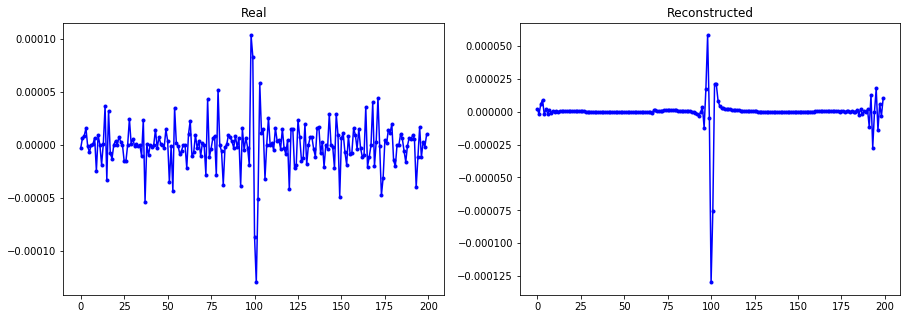

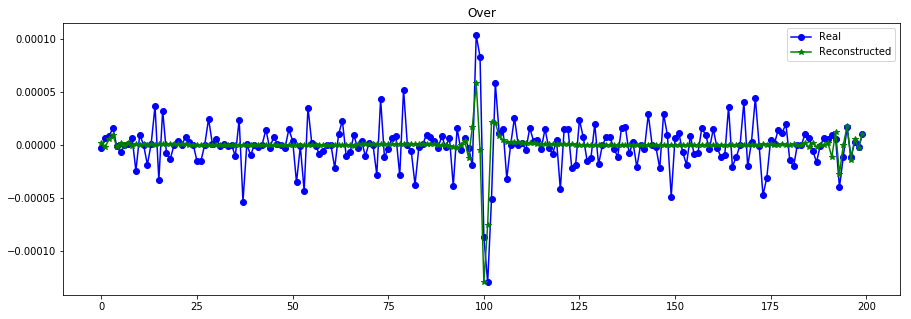

----------------------------------------------------------------


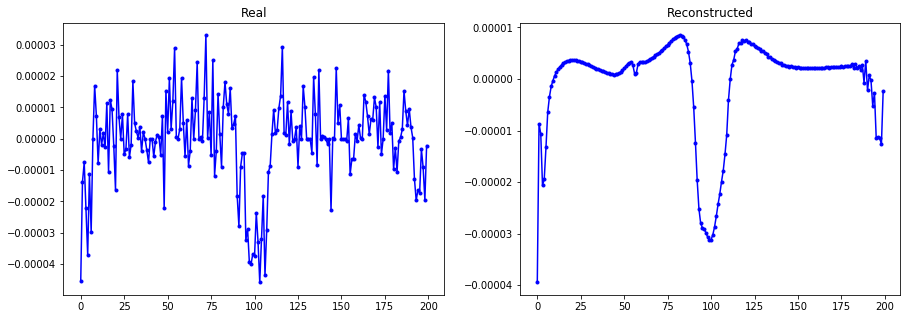

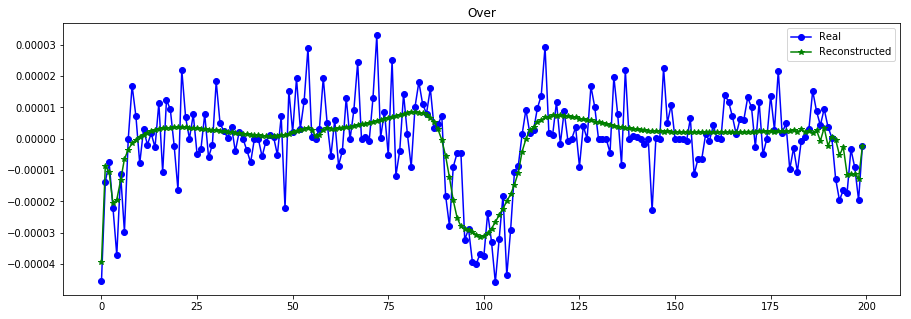

----------------------------------------------------------------


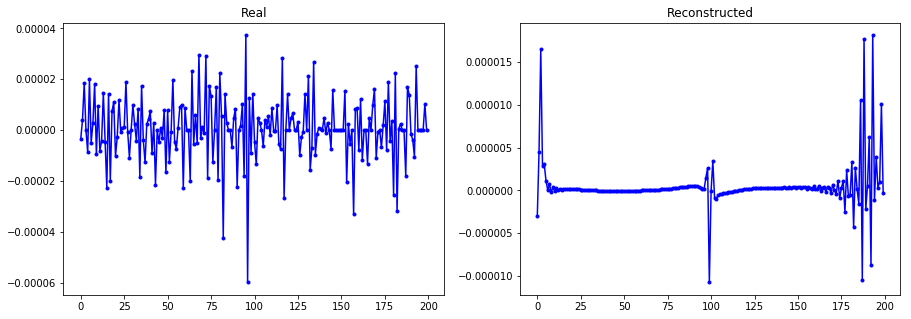

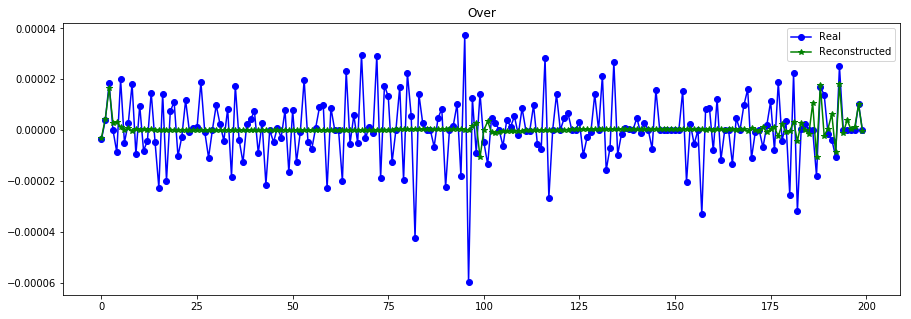

----------------------------------------------------------------


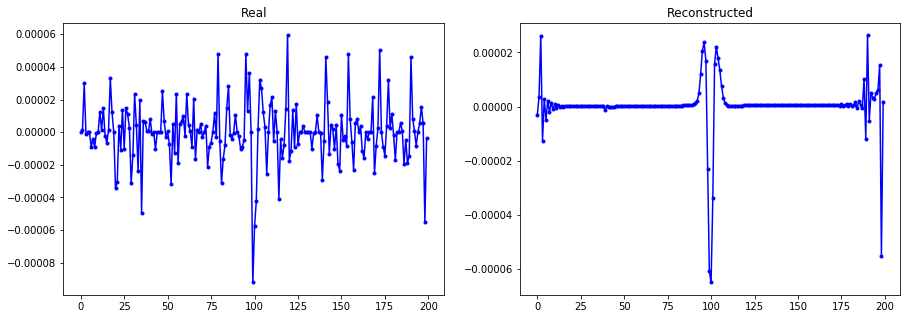

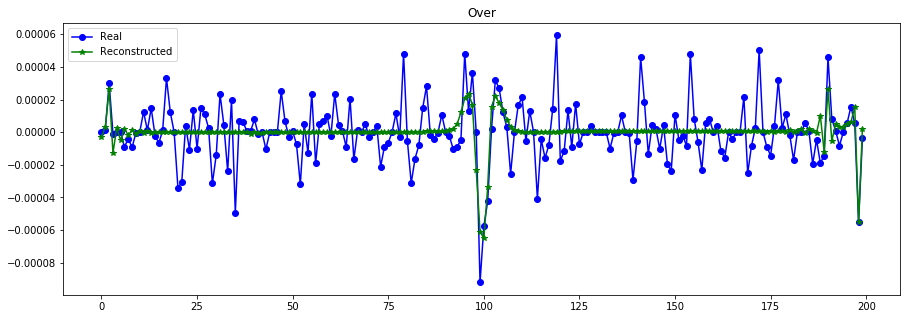

----------------------------------------------------------------


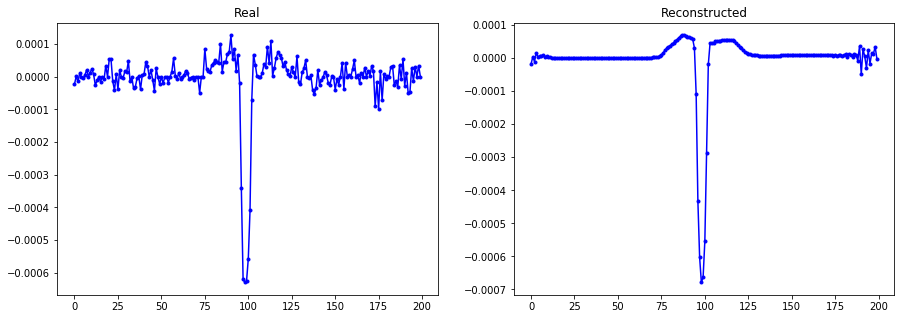

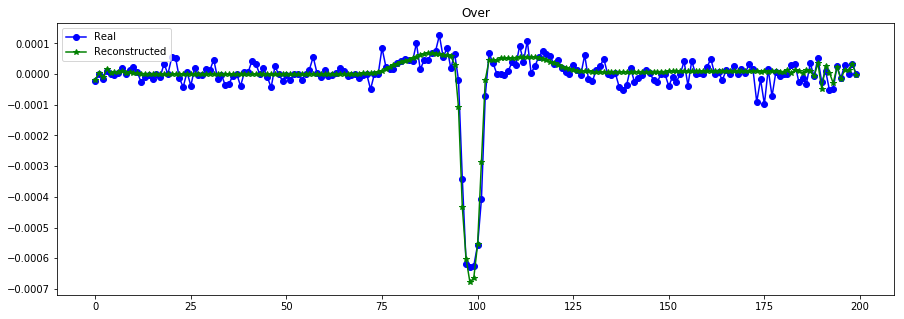

----------------------------------------------------------------


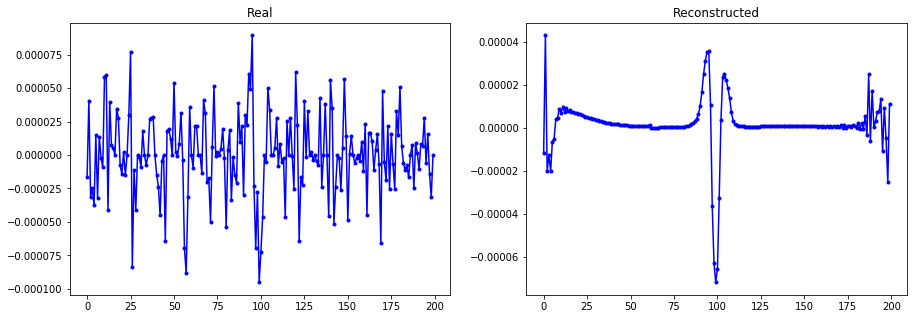

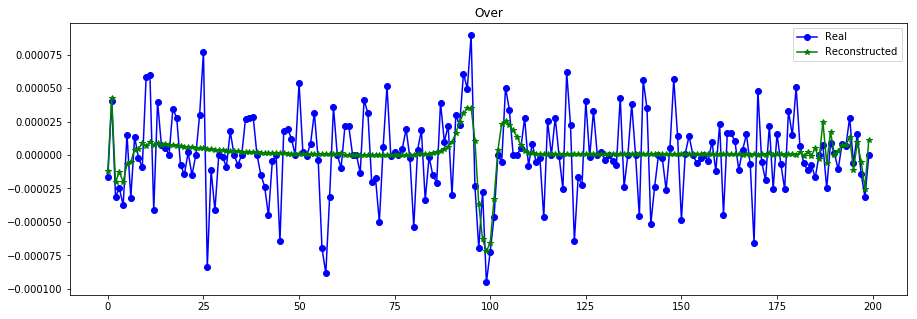

----------------------------------------------------------------


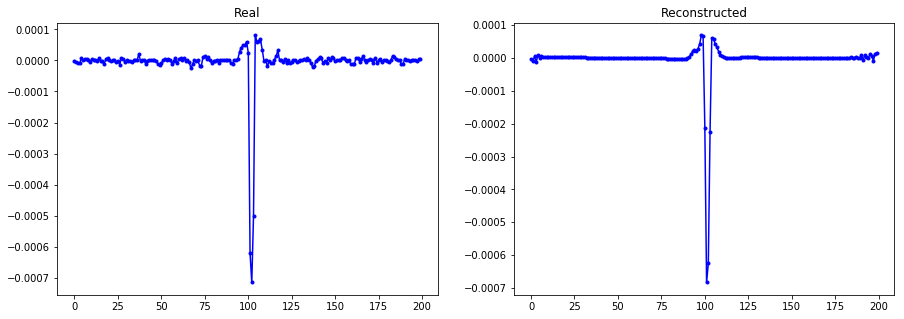

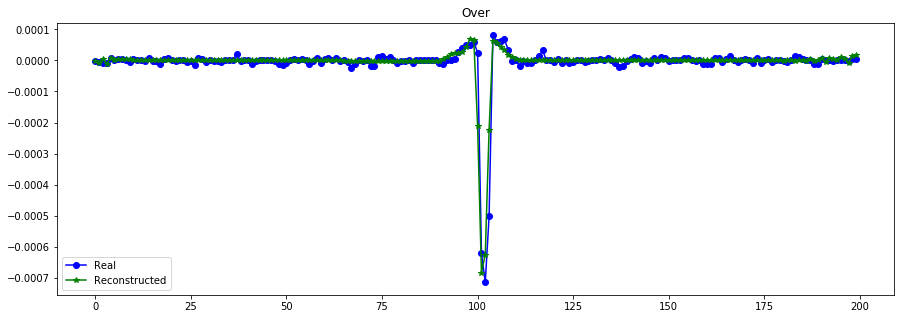

----------------------------------------------------------------


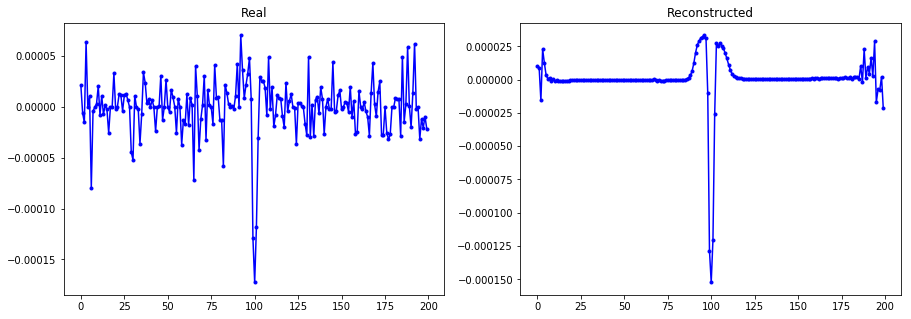

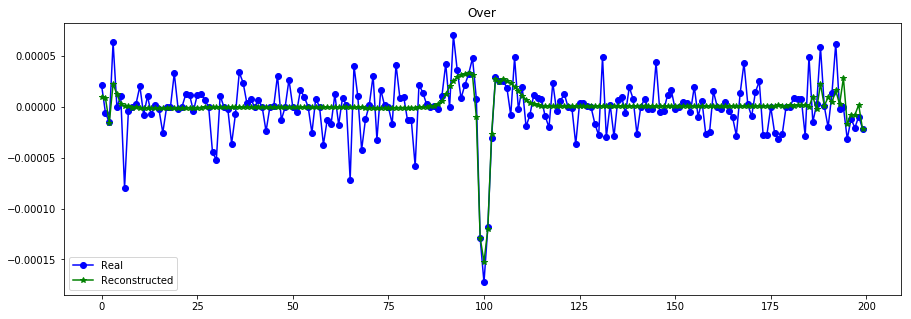

----------------------------------------------------------------


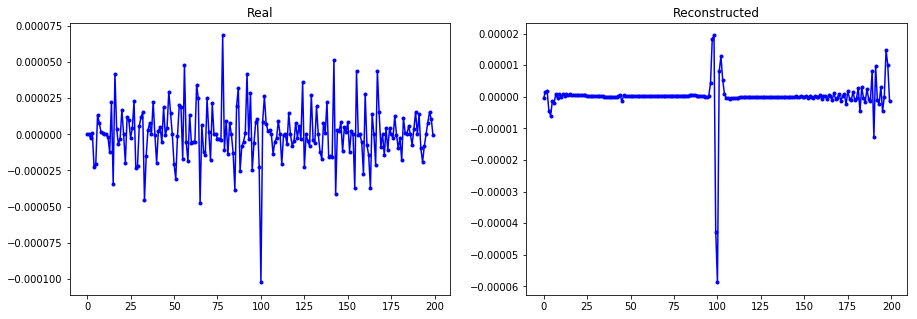

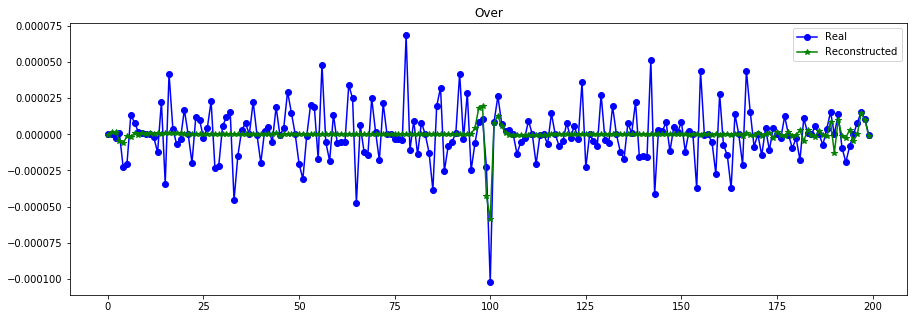

----------------------------------------------------------------


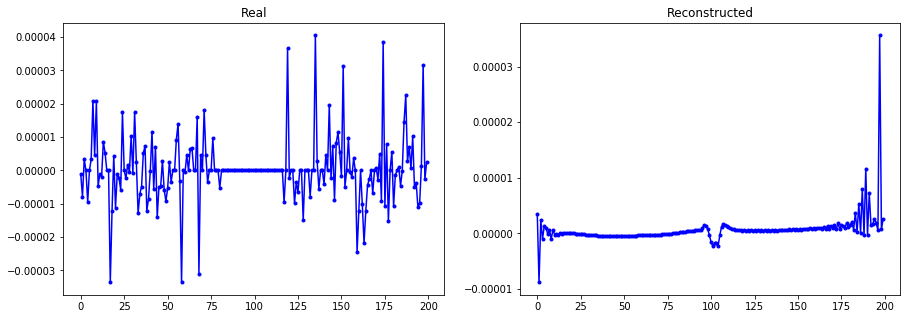

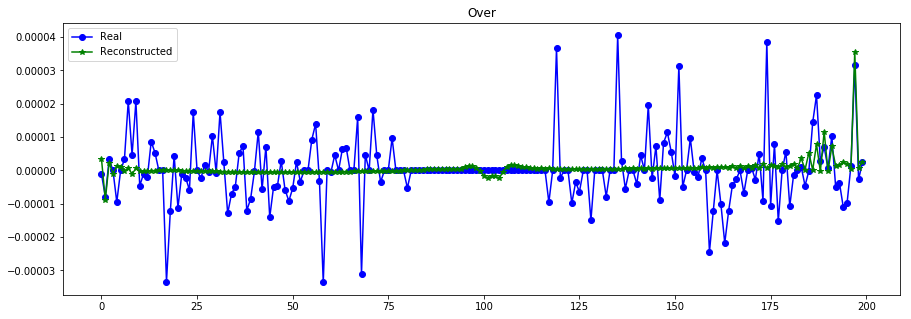

----------------------------------------------------------------


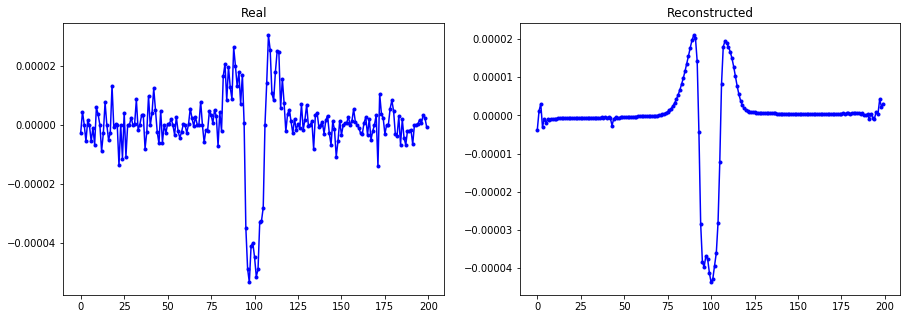

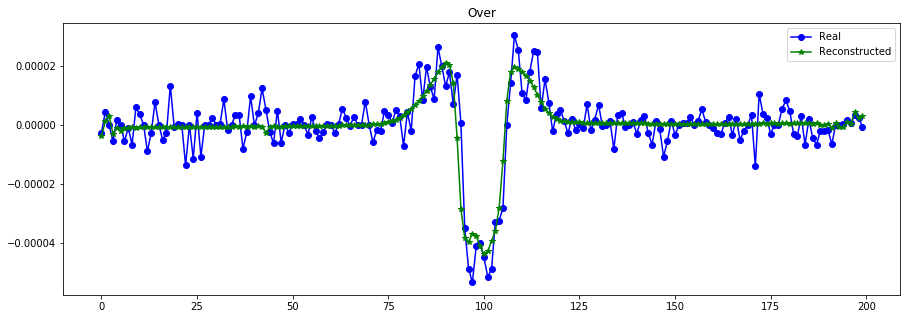

----------------------------------------------------------------


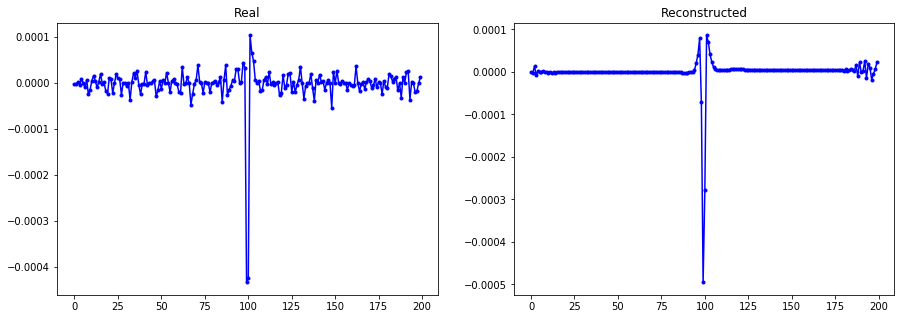

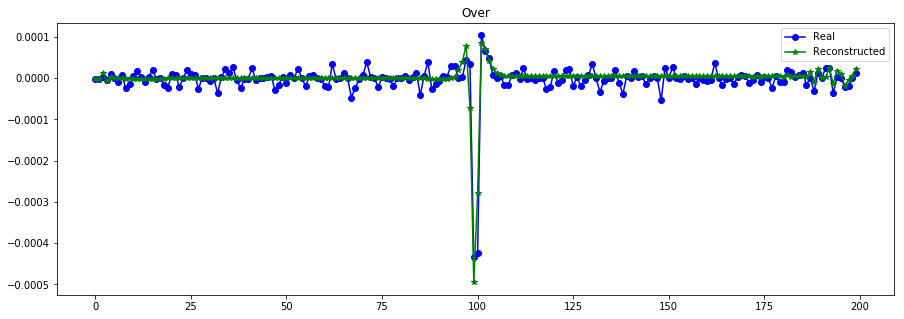

----------------------------------------------------------------


In [202]:
print("Errores ",vae.evaluate([X_test_t,X_test, S_test], X_test, batch_size=512))
X_train_hat = vae.predict([X_train_t,X_train, S_train], batch_size=512)
plot_n_lc(X_train[:,:,0], X_train_hat, n= 15) #

In [205]:
s_model.predict([X_train_t,X_train, S_train], batch_size=512)

array([[24222.707],
       [24222.707],
       [24222.707],
       ...,
       [24222.707],
       [24222.707],
       [24222.707]], dtype=float32)

In [24]:
np.median(S_train)

43770.12764662853

In [22]:
S_mu_tr = np.tile(S_mu, (S_train.shape[0],1))
S_mu_te = np.tile(S_mu, (S_test.shape[0],1))
S_mu_tr

array([[74305.40928046],
       [74305.40928046],
       [74305.40928046],
       ...,
       [74305.40928046],
       [74305.40928046],
       [74305.40928046]])

In [37]:
batch_size = 64
vae.fit([X_train_t,X_train, S_mu_tr], X_train, epochs=200, batch_size=batch_size, sample_weight=(S_train**2)[:,0],
        validation_data=([X_test_t,X_test,S_mu_te], X_test)) #con std global entrada a 1

Train on 6446 samples, validate on 1094 samples
Epoch 1/200
6446/6446 [==============================] - 15s 2ms/step - loss: 1.0050 - MSE_loss: 1.3506e-07 - val_loss: 1.0348e-07 - val_MSE_loss: 1.0348e-07
Epoch 2/200
6446/6446 [==============================] - 11s 2ms/step - loss: 1.3316 - MSE_loss: 1.3596e-07 - val_loss: 1.0374e-07 - val_MSE_loss: 1.0374e-07
Epoch 3/200
6446/6446 [==============================] - 11s 2ms/step - loss: 2.2618 - MSE_loss: 1.3699e-07 - val_loss: 1.0351e-07 - val_MSE_loss: 1.0351e-07
Epoch 4/200
6446/6446 [==============================] - 11s 2ms/step - loss: 1.0034 - MSE_loss: 1.3511e-07 - val_loss: 1.0351e-07 - val_MSE_loss: 1.0351e-07
Epoch 5/200
6446/6446 [==============================] - 11s 2ms/step - loss: 1.0033 - MSE_loss: 1.3511e-07 - val_loss: 1.0351e-07 - val_MSE_loss: 1.0351e-07
Epoch 6/200
6446/6446 [==============================] - 11s 2ms/step - loss: 1.0032 - MSE_loss: 1.3511e-07 - val_loss: 1.0351e-07 - val_MSE_loss: 1.0351e-07
Epoc

6446/6446 [==============================] - 11s 2ms/step - loss: 0.9719 - MSE_loss: 1.3490e-07 - val_loss: 1.0335e-07 - val_MSE_loss: 1.0335e-07
Epoch 104/200
6446/6446 [==============================] - 11s 2ms/step - loss: 0.9742 - MSE_loss: 1.3487e-07 - val_loss: 1.0345e-07 - val_MSE_loss: 1.0345e-07
Epoch 105/200
6446/6446 [==============================] - 11s 2ms/step - loss: 0.9590 - MSE_loss: 1.3484e-07 - val_loss: 1.0329e-07 - val_MSE_loss: 1.0329e-07
Epoch 106/200
6446/6446 [==============================] - 11s 2ms/step - loss: 0.9584 - MSE_loss: 1.3480e-07 - val_loss: 1.0327e-07 - val_MSE_loss: 1.0327e-07
Epoch 107/200
6446/6446 [==============================] - 11s 2ms/step - loss: 0.9768 - MSE_loss: 1.3491e-07 - val_loss: 1.0349e-07 - val_MSE_loss: 1.0349e-07
Epoch 108/200
6446/6446 [==============================] - 11s 2ms/step - loss: 1.0013 - MSE_loss: 1.3506e-07 - val_loss: 1.0349e-07 - val_MSE_loss: 1.0349e-07
Epoch 109/200
6446/6446 [=============================

1094/1094 [==============================] - 0s 225us/step
Errores  [1.0349026829897019e-07, 1.0349026829897019e-07]


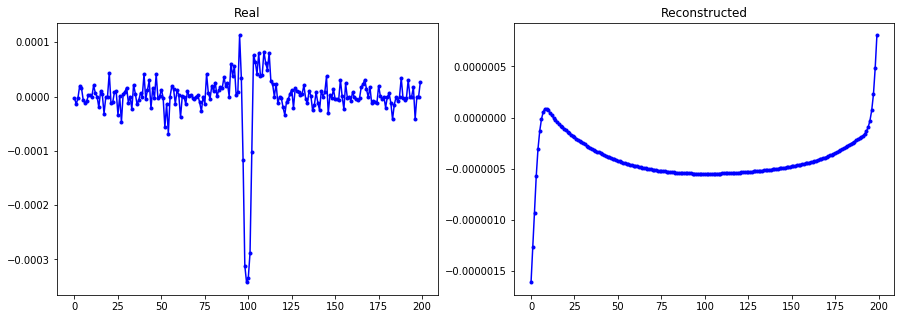

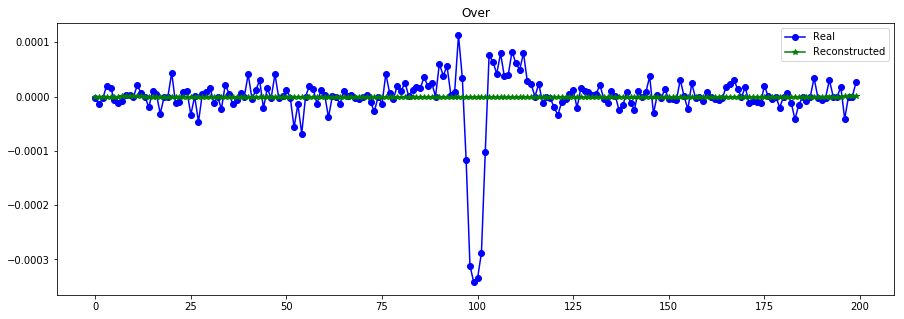

----------------------------------------------------------------


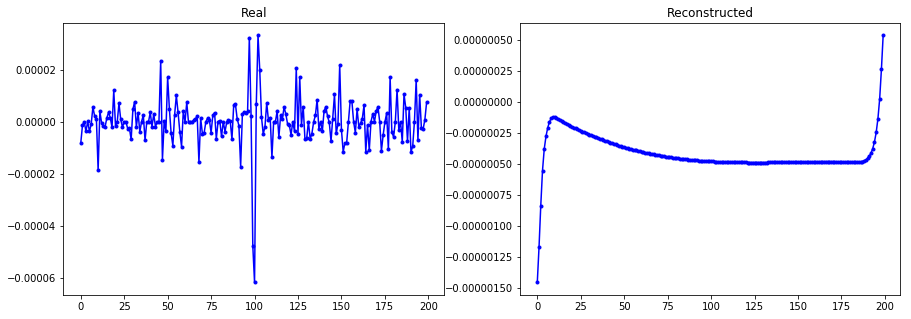

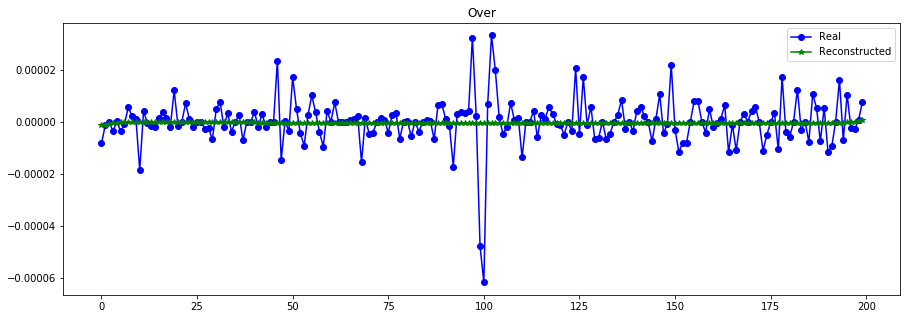

----------------------------------------------------------------


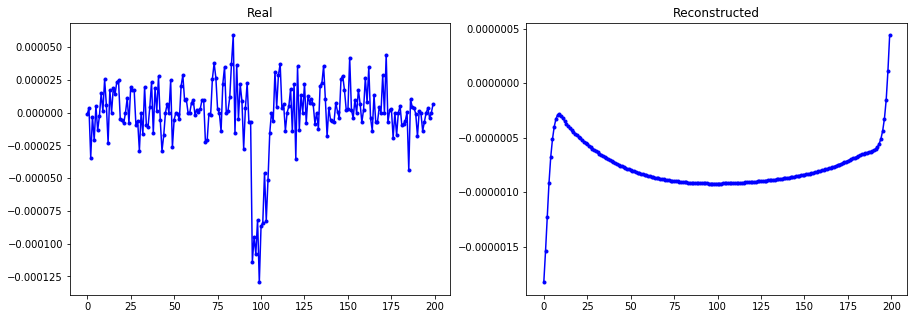

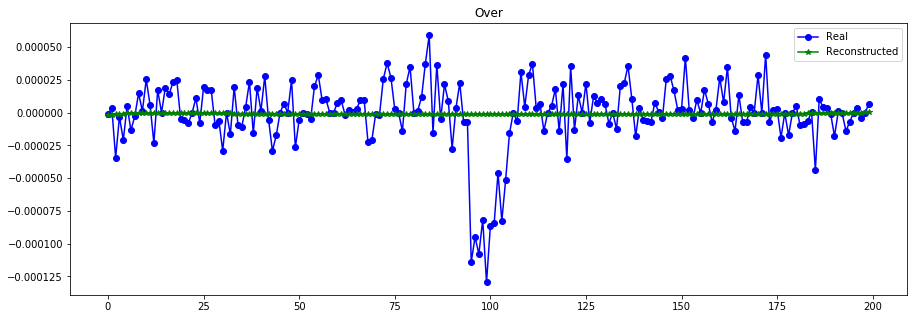

----------------------------------------------------------------


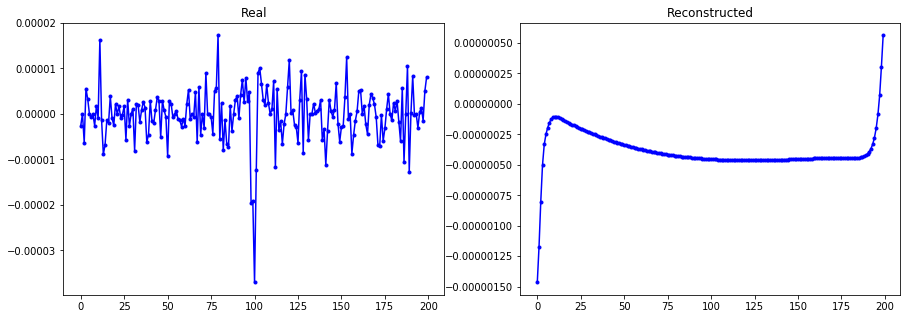

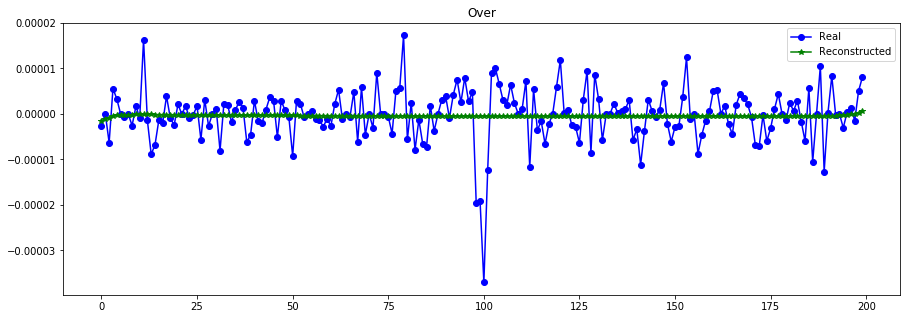

----------------------------------------------------------------


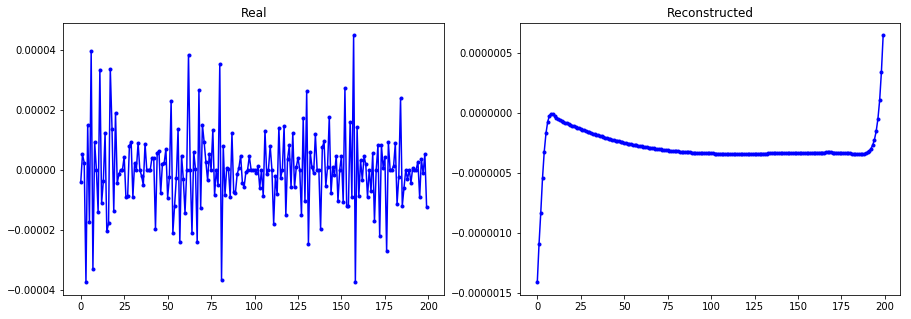

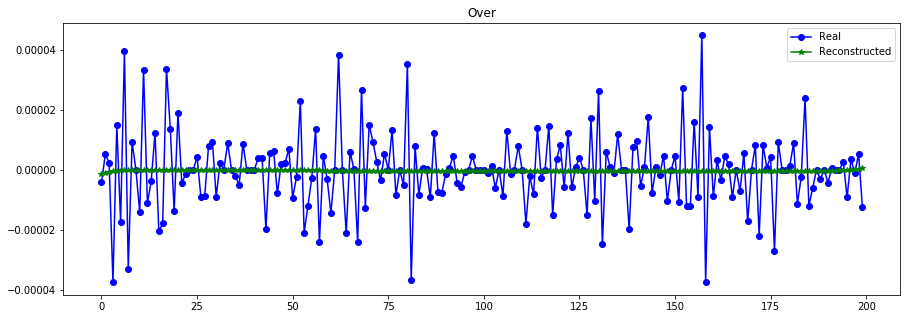

----------------------------------------------------------------


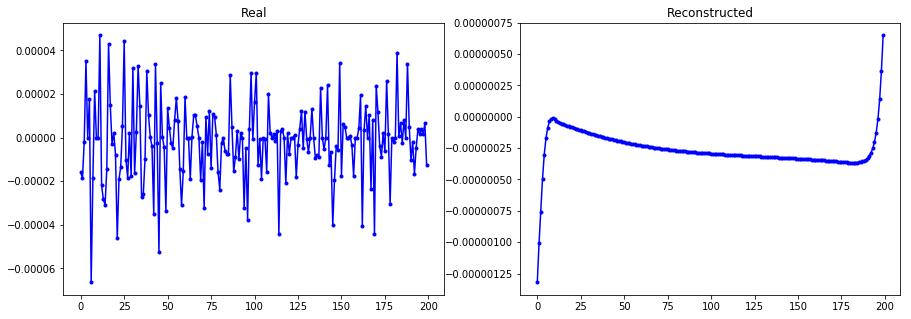

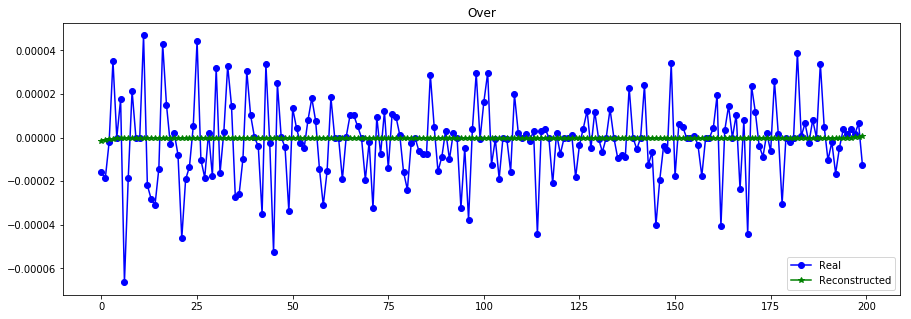

----------------------------------------------------------------


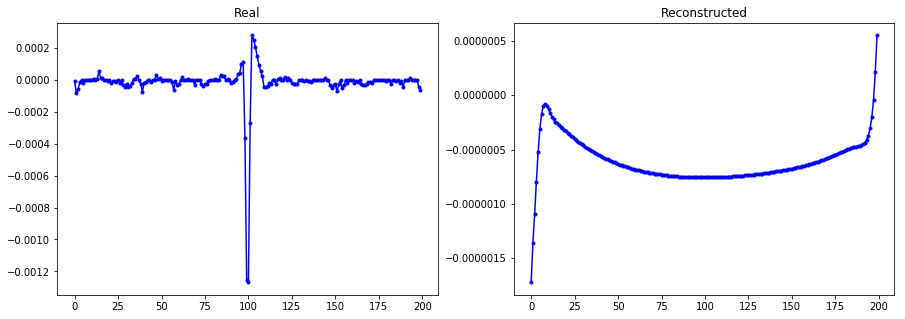

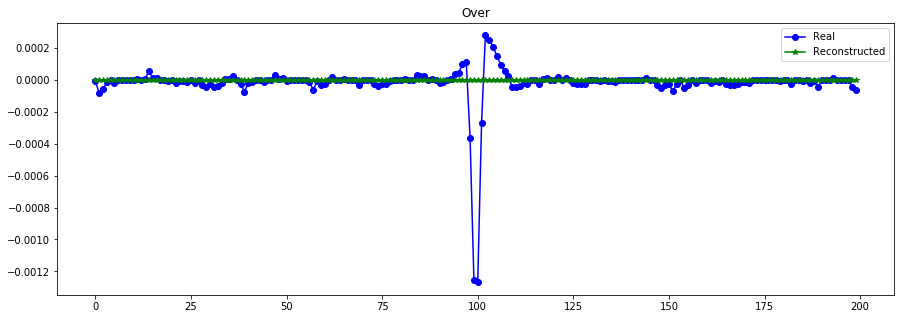

----------------------------------------------------------------


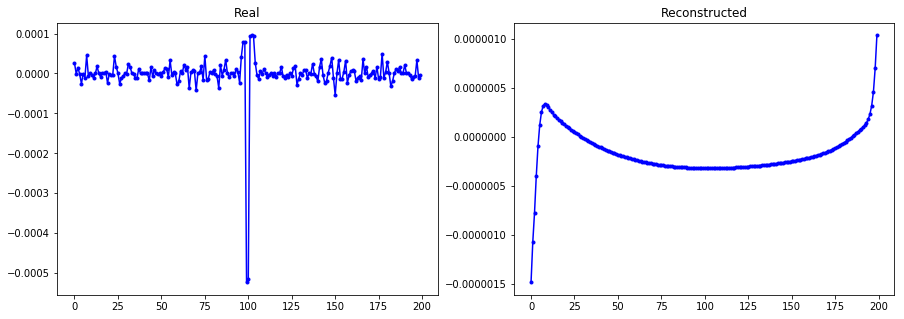

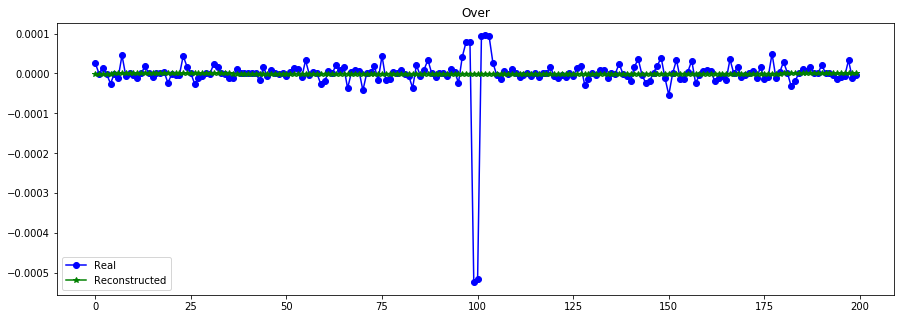

----------------------------------------------------------------


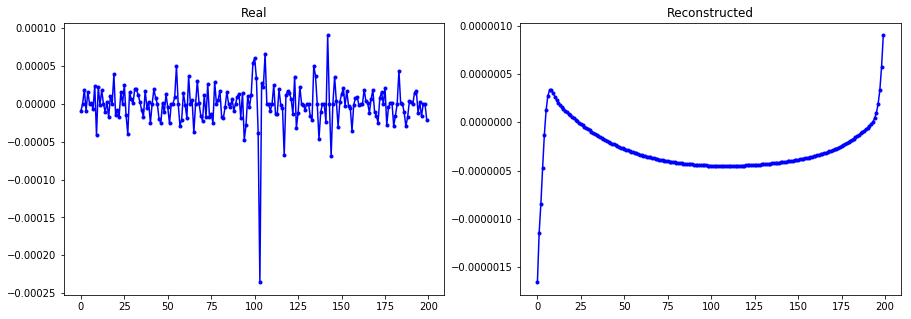

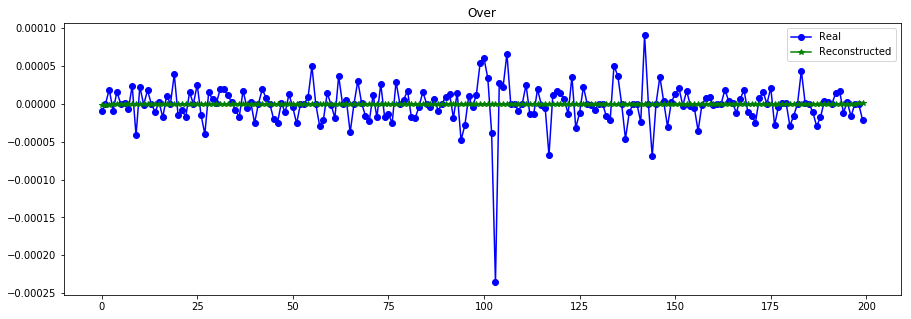

----------------------------------------------------------------


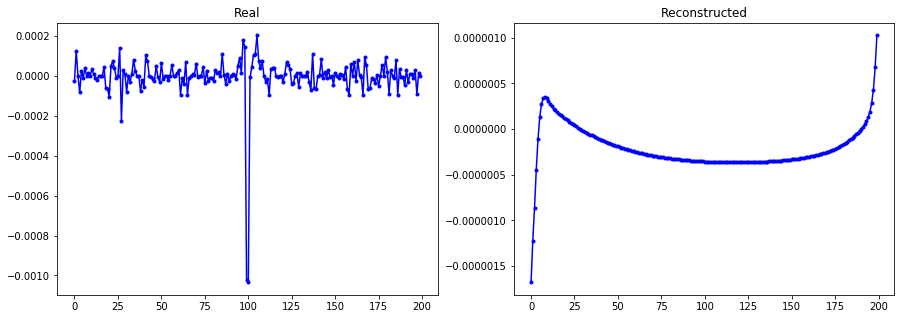

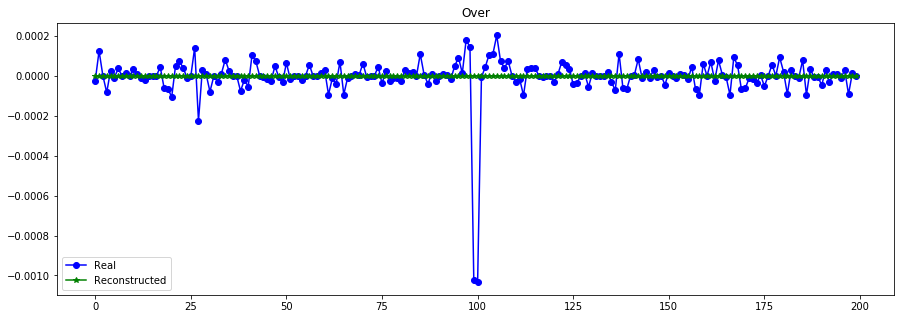

----------------------------------------------------------------


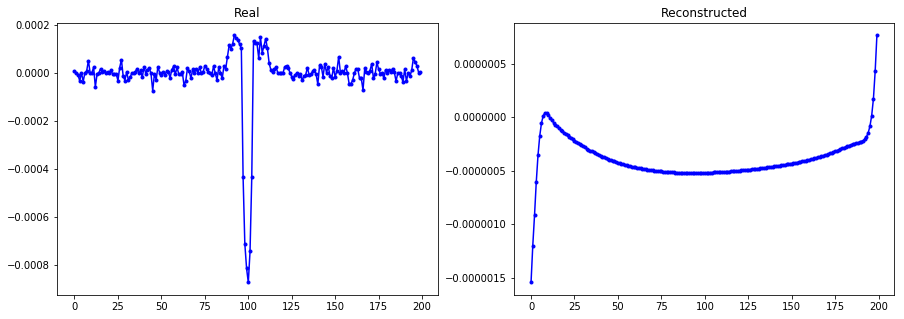

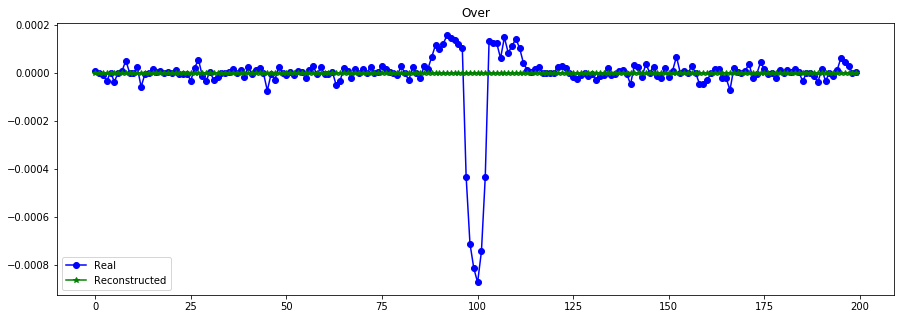

----------------------------------------------------------------


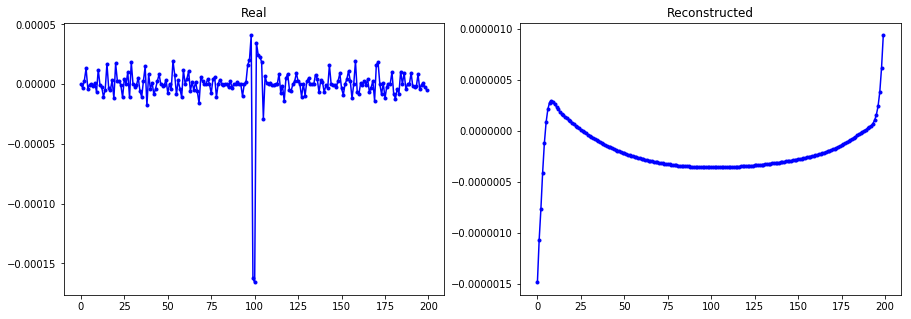

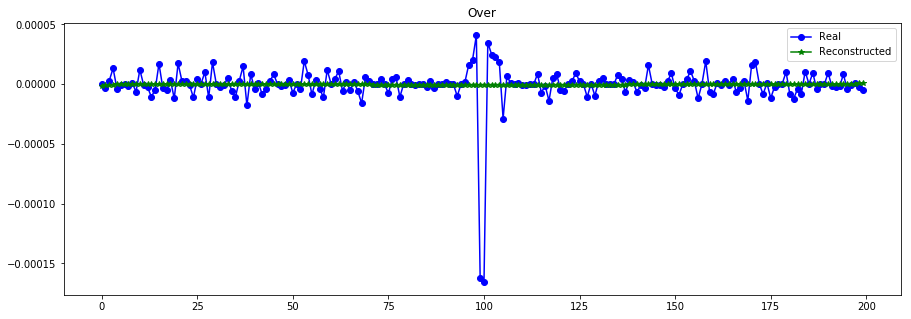

----------------------------------------------------------------


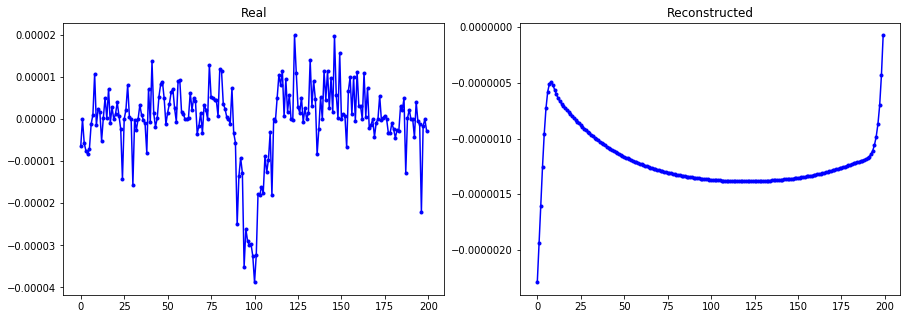

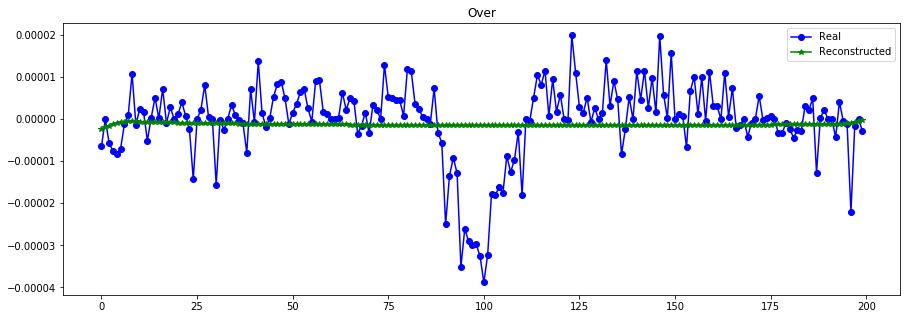

----------------------------------------------------------------


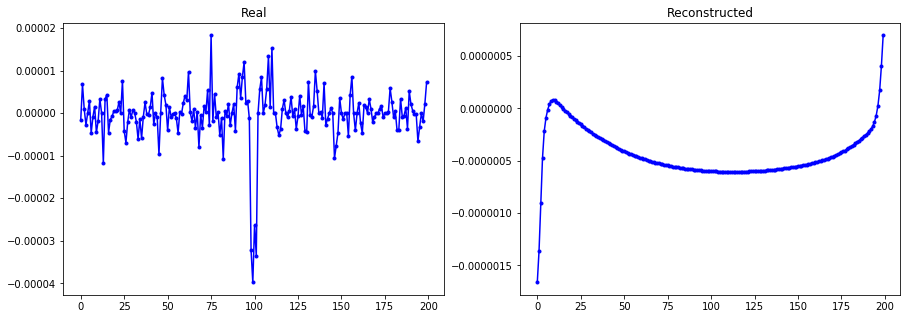

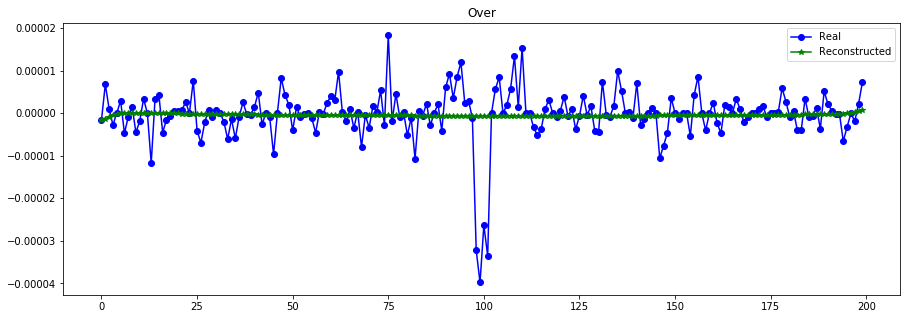

----------------------------------------------------------------


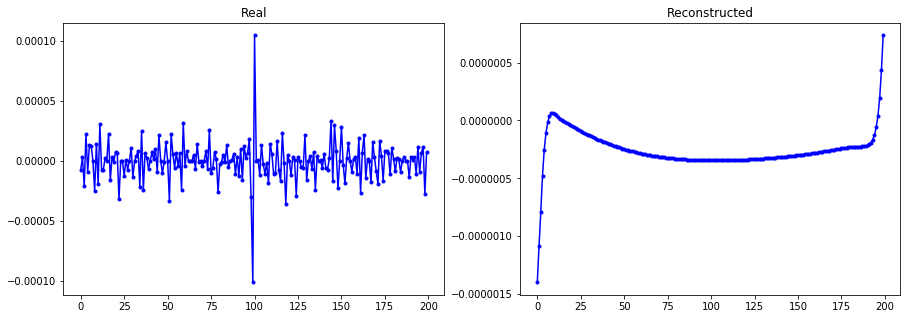

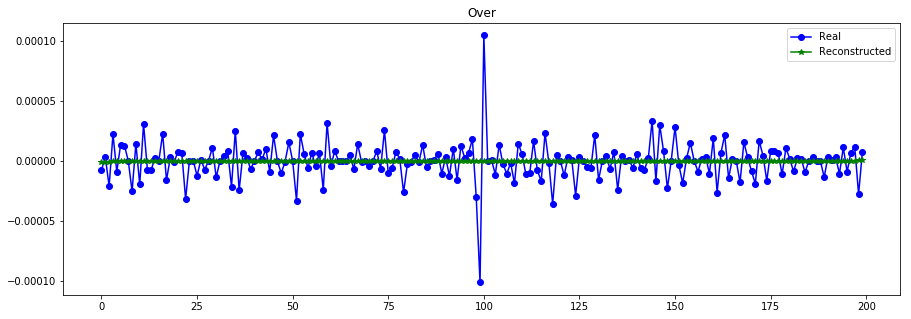

----------------------------------------------------------------


In [38]:
print("Errores ",vae.evaluate([X_test_t,X_test, S_test], X_test, batch_size=512))
X_train_hat = vae.predict([X_train_t,X_train, S_train], batch_size=512)
plot_n_lc(X_train[:,:,0], X_train_hat, n= 15) #

In [ ]:
### loss entre s y s_out/hat

In [43]:
##### INPUTS ENCODER ######
x_lc = Input(shape = (T, channels) , name="LC_inp")
x_t = Input(shape = (T, 1) , name ="T_inp")
s = Input(shape= (1,), name="scale_inp") #NEW: Extension: depende de x

x_lc_s = Lambda(Multiply_layer, name="Multiply")([x_lc,s]) #NEW: escalar data

##### CODIFY LIGHT CURVE ######
x = Concatenate(axis=-1)([x_t, x_lc_s]) 
f1 = Bidirectional(CuDNNGRU(64, return_sequences=True))(x)
f1 = Bidirectional(CuDNNGRU(64, return_sequences=False))(f1) 

##### GET THE LATENT VARIABLE ######
z_mean = Dense(latent_dim,activation='linear')(f1)
encoder = Model([x_t, x_lc, s], z_mean, name="encoder")

##### INPUTS DECODER ######
decoder_input = Input(shape=(latent_dim,))

##### RECONSTRUCT LIGHT CURVE ######
decode = RepeatVector(T)(decoder_input)
decode = Concatenate(axis=-1)([x_t, decode]) #add time decode
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
decode = Bidirectional(CuDNNGRU(64, return_sequences=True))(decode) #bidirectional
decode = TimeDistributed(Dense(1, activation='linear'))(decode)

decode = Lambda(Divide_layer, name="Divide")([decode, s]) #NEW: 

generator = Model([x_t, decoder_input, s], decode, name="generator")

##### VAE MODEL ######
out = generator([x_t, encoder([x_t, x_lc, s]), s])  #samp_encoder([x_t, x_lc, s]) ])
vae = Model([x_t, x_lc, s], out)

vae.compile(optimizer='adam', loss=MSE_loss, metrics = [MSE_loss])
vae.summary()

__________________________________________________________________________________________________
Layer (type)                    Output Shape         Param #     Connected to                     
T_inp (InputLayer)              (None, 200, 1)       0                                            
__________________________________________________________________________________________________
LC_inp (InputLayer)             (None, 200, 1)       0                                            
__________________________________________________________________________________________________
scale_inp (InputLayer)          (None, 1)            0                                            
__________________________________________________________________________________________________
encoder (Model)                 (None, 32)           104736      T_inp[0][0]                      
                                                                 LC_inp[0][0]                     
          

In [44]:
batch_size = 64
vae.fit([X_train_t,X_train, S_train], X_train, epochs=500, batch_size=batch_size, sample_weight=(S_train**2)[:,0],
        validation_data=([X_test_t,X_test,S_test], X_test)) #el mejor con loss sobre escala real

Train on 6490 samples, validate on 1072 samples
Epoch 1/500
6490/6490 [==============================] - 14s 2ms/step - loss: 1.0003 - MSE_loss: 1.2958e-07 - val_loss: 1.0969e-07 - val_MSE_loss: 1.0969e-07
Epoch 2/500
6490/6490 [==============================] - 10s 2ms/step - loss: 0.9989 - MSE_loss: 1.2927e-07 - val_loss: 1.0947e-07 - val_MSE_loss: 1.0947e-07
Epoch 3/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.9963 - MSE_loss: 1.2791e-07 - val_loss: 1.0911e-07 - val_MSE_loss: 1.0911e-07
Epoch 4/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.9921 - MSE_loss: 1.2651e-07 - val_loss: 1.0727e-07 - val_MSE_loss: 1.0727e-07
Epoch 5/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.9869 - MSE_loss: 1.2498e-07 - val_loss: 1.0610e-07 - val_MSE_loss: 1.0610e-07
Epoch 6/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.9813 - MSE_loss: 1.2442e-07 - val_loss: 1.0619e-07 - val_MSE_loss: 1.0619e-07
Epoc

6490/6490 [==============================] - 12s 2ms/step - loss: 0.6080 - MSE_loss: 1.5894e-08 - val_loss: 2.2029e-08 - val_MSE_loss: 2.2029e-08
Epoch 104/500
6490/6490 [==============================] - 12s 2ms/step - loss: 0.6106 - MSE_loss: 1.8496e-08 - val_loss: 8.1092e-09 - val_MSE_loss: 8.1092e-09
Epoch 105/500
6490/6490 [==============================] - 12s 2ms/step - loss: 0.5979 - MSE_loss: 1.4653e-08 - val_loss: 7.4358e-09 - val_MSE_loss: 7.4358e-09
Epoch 106/500
6490/6490 [==============================] - 12s 2ms/step - loss: 0.6014 - MSE_loss: 1.5453e-08 - val_loss: 7.5990e-09 - val_MSE_loss: 7.5990e-09
Epoch 107/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.6010 - MSE_loss: 1.4583e-08 - val_loss: 1.1759e-08 - val_MSE_loss: 1.1759e-08
Epoch 108/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.5949 - MSE_loss: 1.4651e-08 - val_loss: 1.0339e-08 - val_MSE_loss: 1.0339e-08
Epoch 109/500
6490/6490 [=============================

6490/6490 [==============================] - 11s 2ms/step - loss: 0.5346 - MSE_loss: 1.2964e-08 - val_loss: 9.6239e-09 - val_MSE_loss: 9.6239e-09
Epoch 206/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.5448 - MSE_loss: 1.4085e-08 - val_loss: 6.2179e-09 - val_MSE_loss: 6.2179e-09
Epoch 207/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.5340 - MSE_loss: 1.2089e-08 - val_loss: 7.2489e-09 - val_MSE_loss: 7.2489e-09
Epoch 208/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.5248 - MSE_loss: 1.1655e-08 - val_loss: 7.0194e-09 - val_MSE_loss: 7.0194e-09
Epoch 209/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.5806 - MSE_loss: 1.7799e-08 - val_loss: 9.7321e-09 - val_MSE_loss: 9.7321e-09
Epoch 210/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.5714 - MSE_loss: 1.6580e-08 - val_loss: 6.1199e-09 - val_MSE_loss: 6.1199e-09
Epoch 211/500
6490/6490 [=============================

6490/6490 [==============================] - 11s 2ms/step - loss: 0.4851 - MSE_loss: 9.5741e-09 - val_loss: 6.8843e-09 - val_MSE_loss: 6.8843e-09
Epoch 308/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.5147 - MSE_loss: 1.0752e-08 - val_loss: 8.4585e-09 - val_MSE_loss: 8.4585e-09
Epoch 309/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.4922 - MSE_loss: 8.7989e-09 - val_loss: 1.1428e-08 - val_MSE_loss: 1.1428e-08
Epoch 310/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.4832 - MSE_loss: 9.0528e-09 - val_loss: 6.3130e-09 - val_MSE_loss: 6.3130e-09
Epoch 311/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.5268 - MSE_loss: 1.3546e-08 - val_loss: 7.3451e-09 - val_MSE_loss: 7.3451e-09
Epoch 312/500
6490/6490 [==============================] - 12s 2ms/step - loss: 0.5022 - MSE_loss: 9.5636e-09 - val_loss: 8.6051e-09 - val_MSE_loss: 8.6051e-09
Epoch 313/500
6490/6490 [=============================

6490/6490 [==============================] - 11s 2ms/step - loss: 0.4472 - MSE_loss: 5.0488e-09 - val_loss: 6.2963e-09 - val_MSE_loss: 6.2963e-09
Epoch 410/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.4395 - MSE_loss: 4.7313e-09 - val_loss: 6.5365e-09 - val_MSE_loss: 6.5365e-09
Epoch 411/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.4852 - MSE_loss: 8.3682e-09 - val_loss: 5.8742e-09 - val_MSE_loss: 5.8742e-09
Epoch 412/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.4383 - MSE_loss: 5.6079e-09 - val_loss: 8.2071e-09 - val_MSE_loss: 8.2071e-09
Epoch 413/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.4310 - MSE_loss: 6.0164e-09 - val_loss: 6.7010e-09 - val_MSE_loss: 6.7010e-09
Epoch 414/500
6490/6490 [==============================] - 11s 2ms/step - loss: 0.4321 - MSE_loss: 6.2635e-09 - val_loss: 7.3273e-09 - val_MSE_loss: 7.3273e-09
Epoch 415/500
6490/6490 [=============================

Error scaled mse=  0.5479242113136348


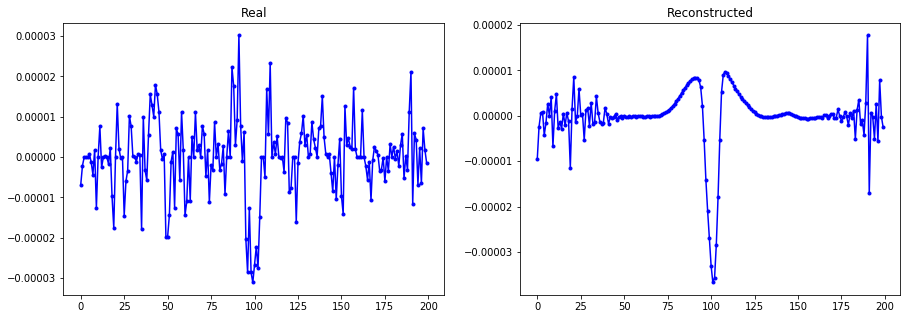

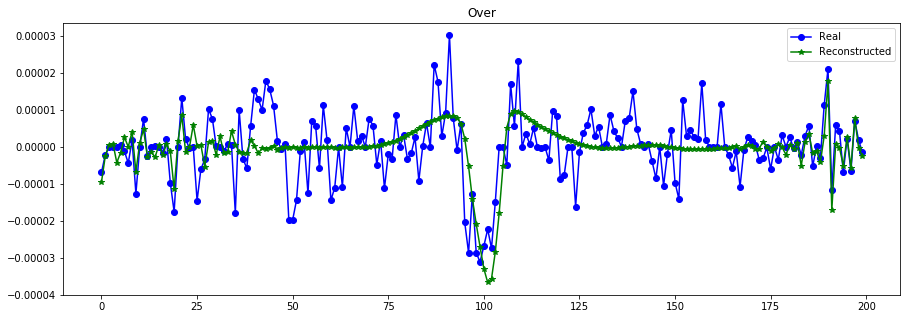

----------------------------------------------------------------


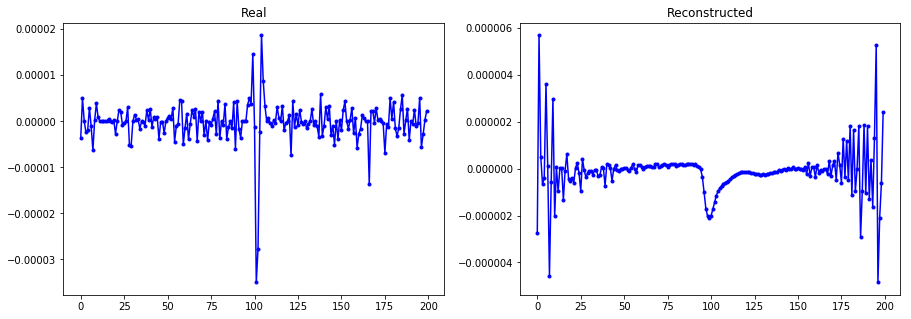

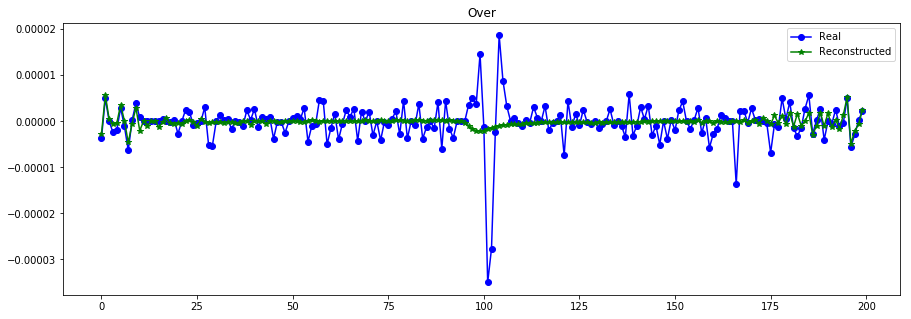

----------------------------------------------------------------


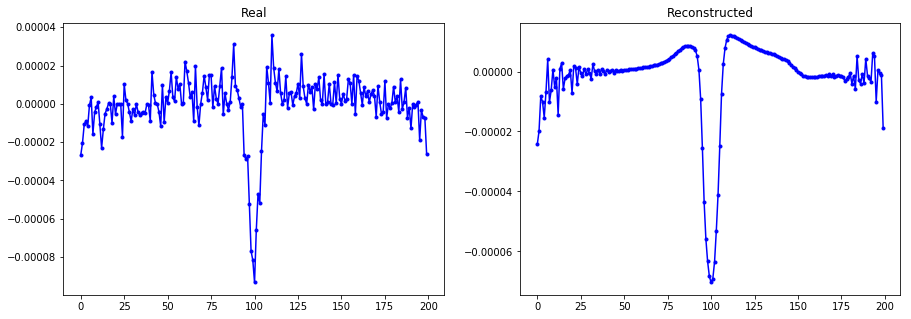

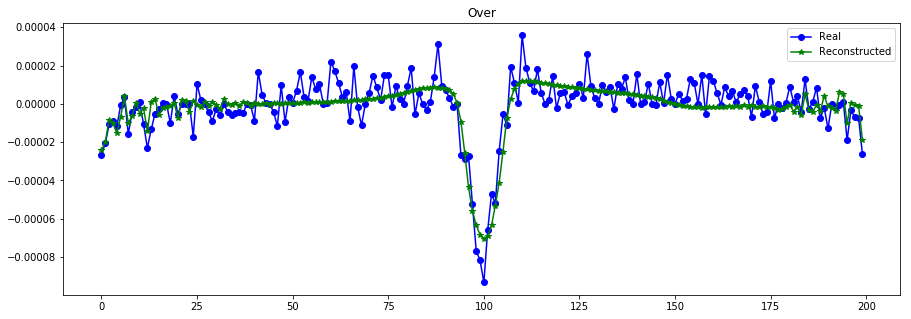

----------------------------------------------------------------


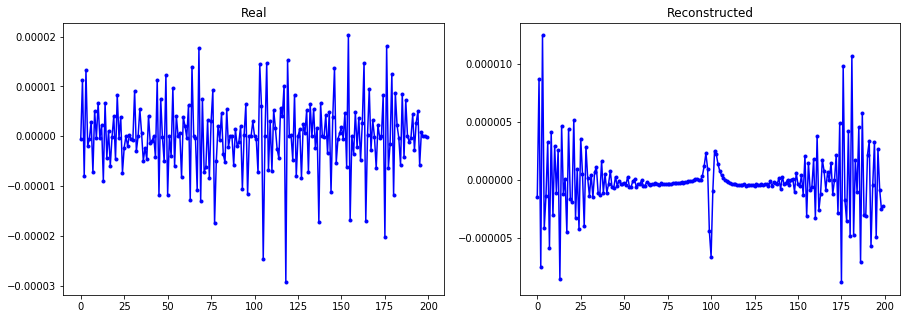

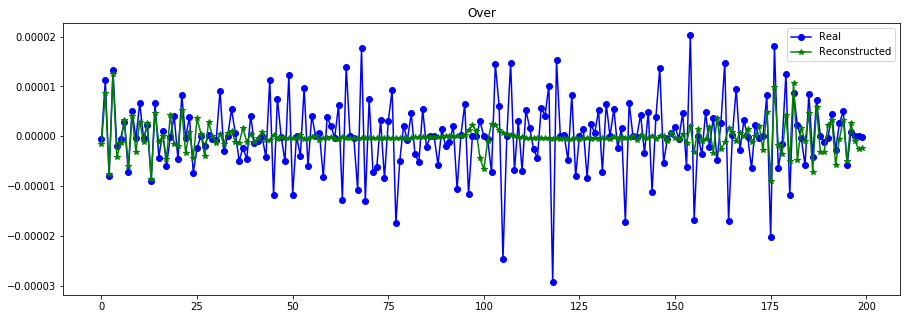

----------------------------------------------------------------


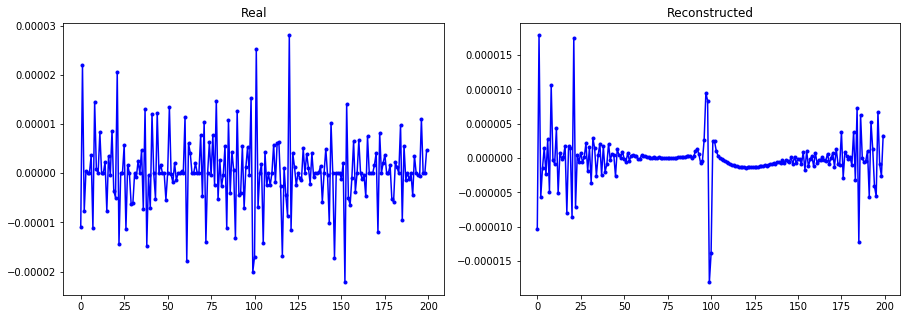

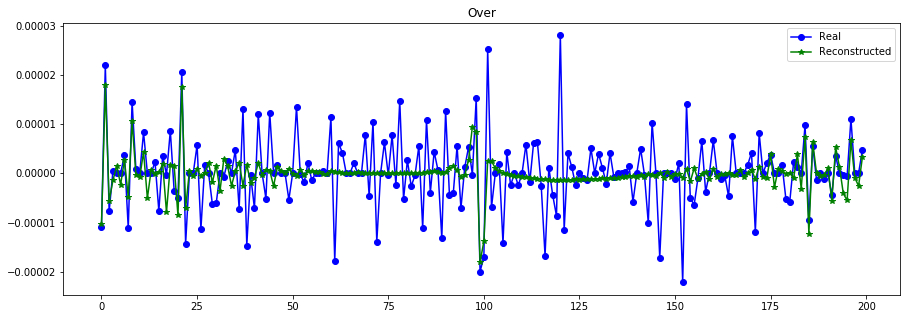

----------------------------------------------------------------


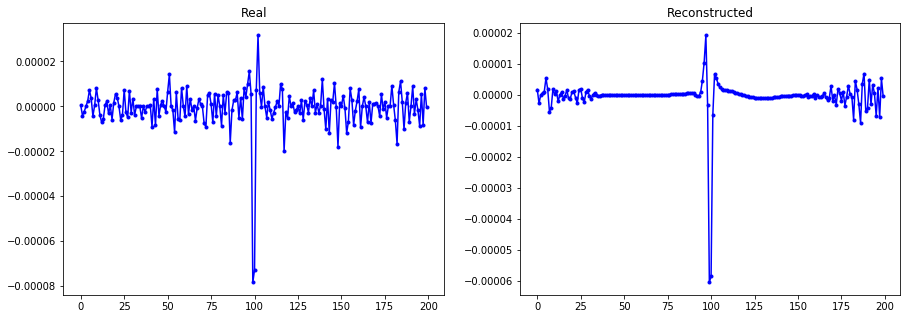

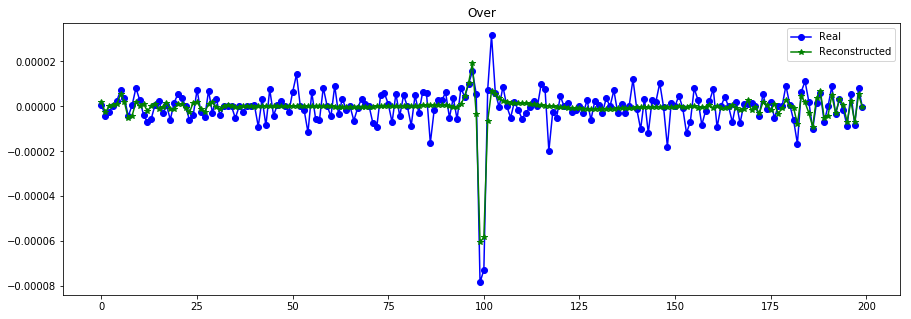

----------------------------------------------------------------


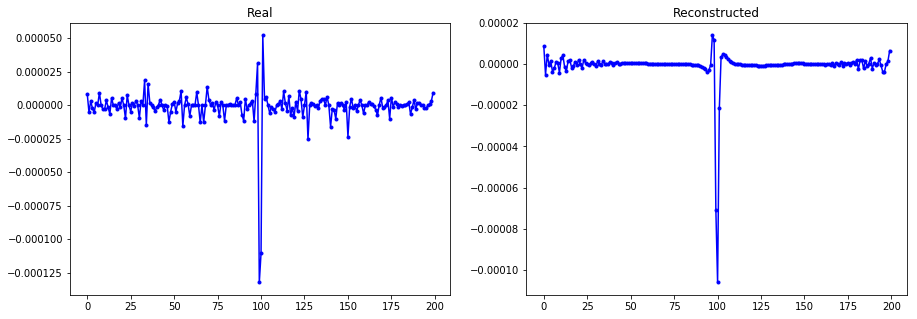

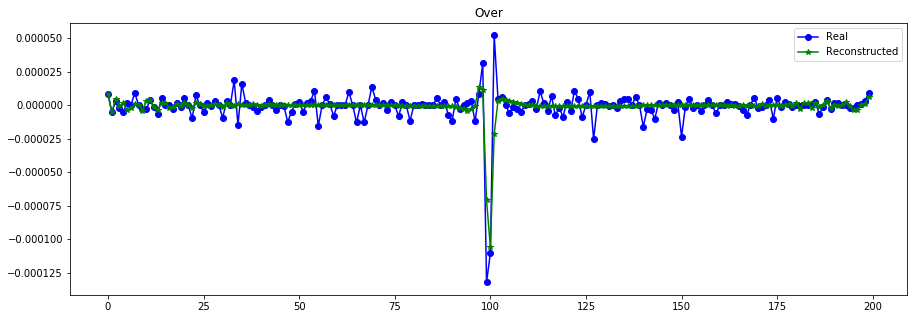

----------------------------------------------------------------


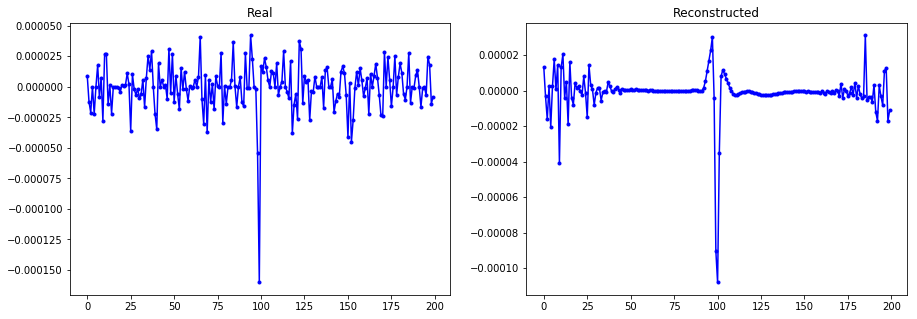

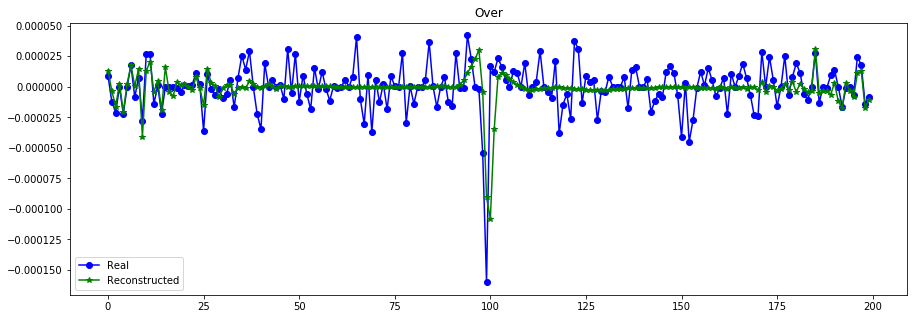

----------------------------------------------------------------


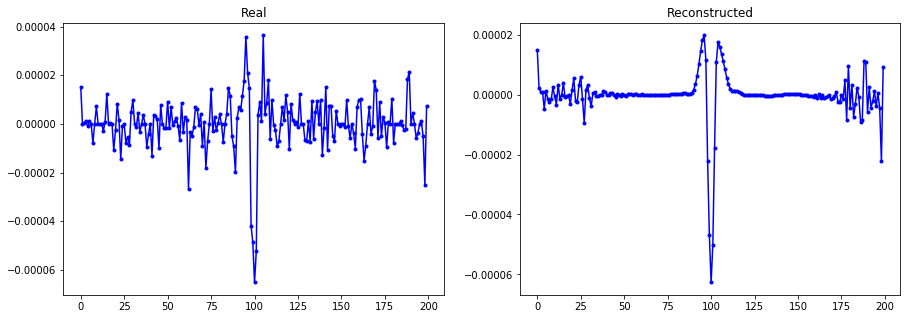

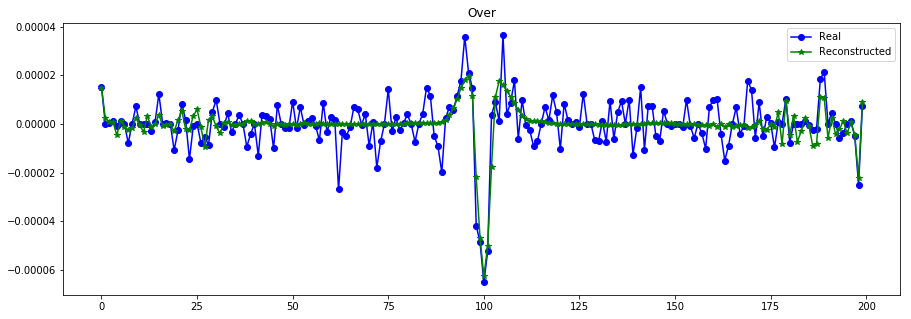

----------------------------------------------------------------


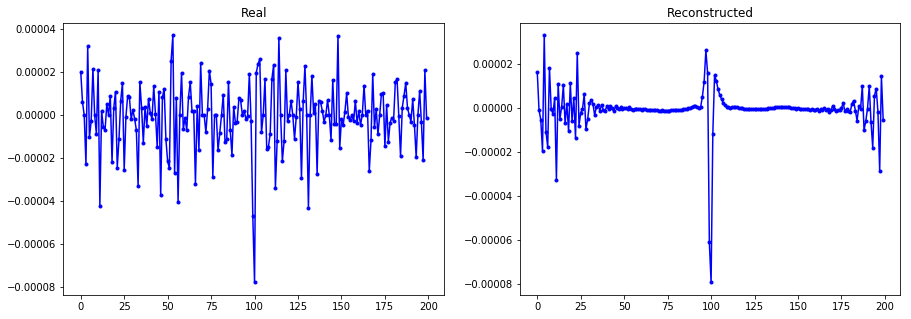

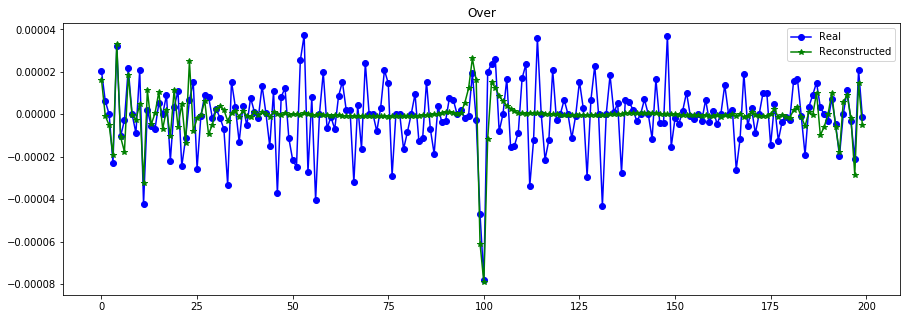

----------------------------------------------------------------


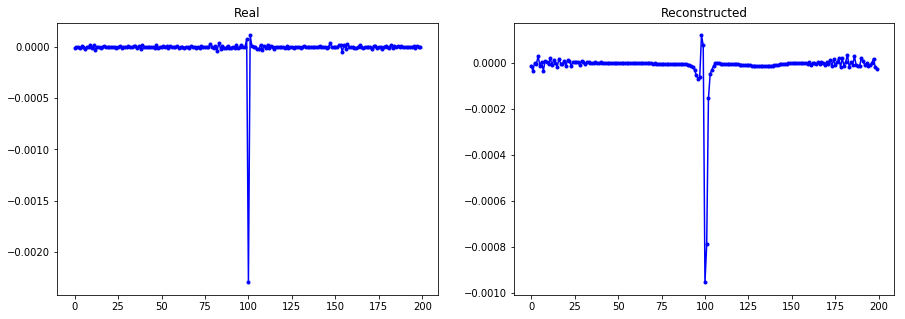

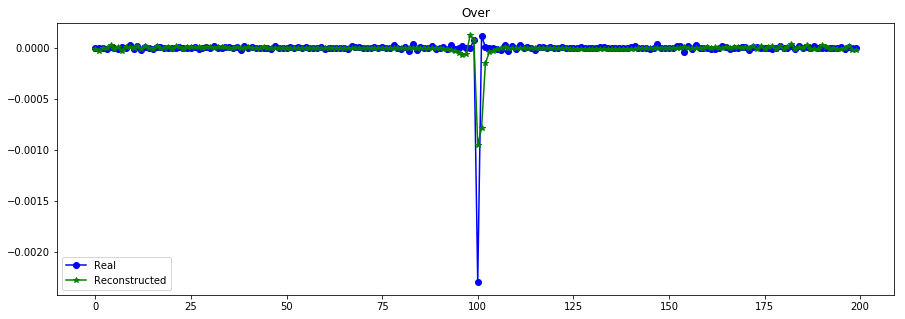

----------------------------------------------------------------


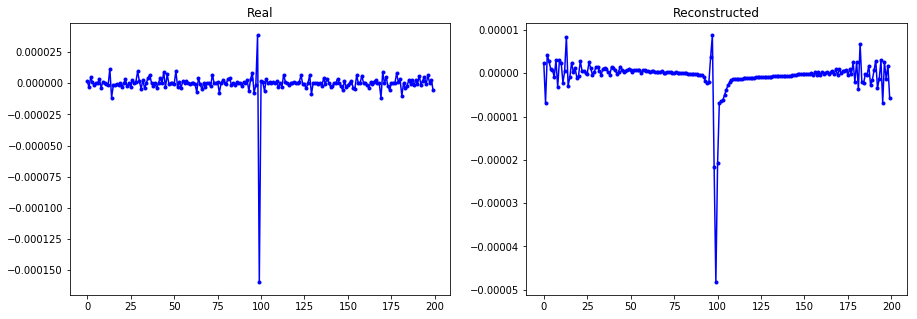

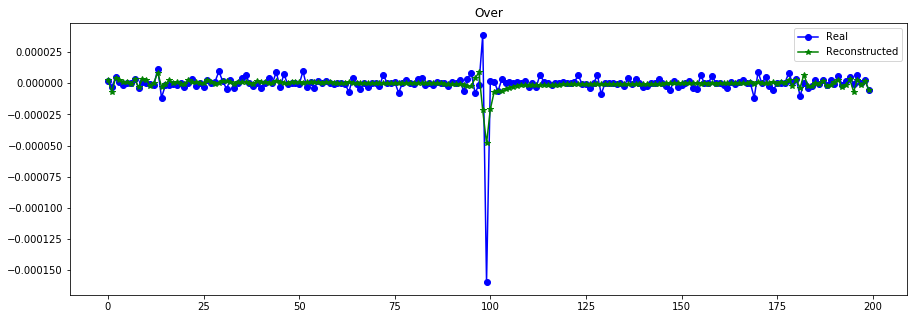

----------------------------------------------------------------


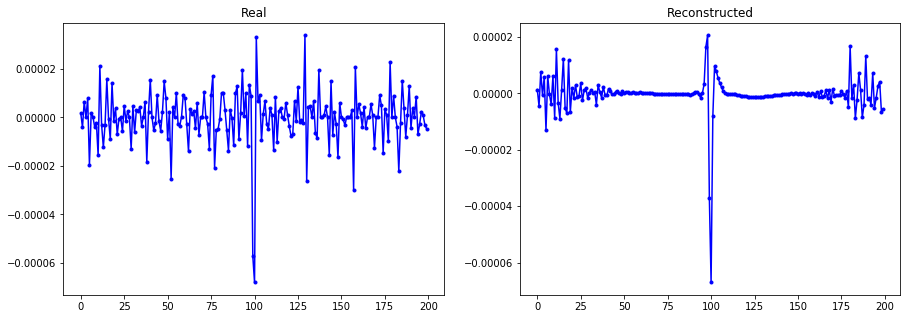

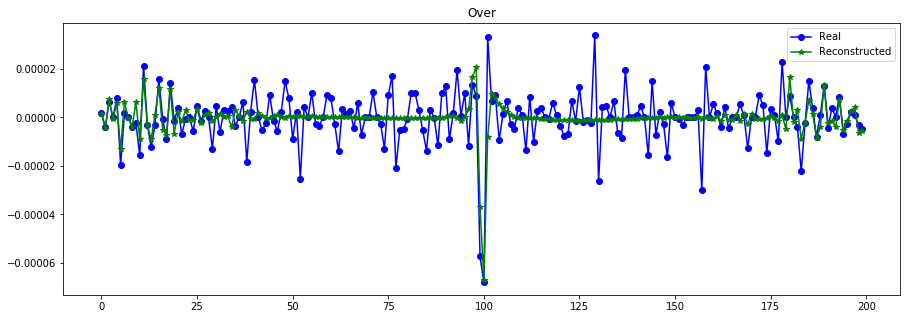

----------------------------------------------------------------


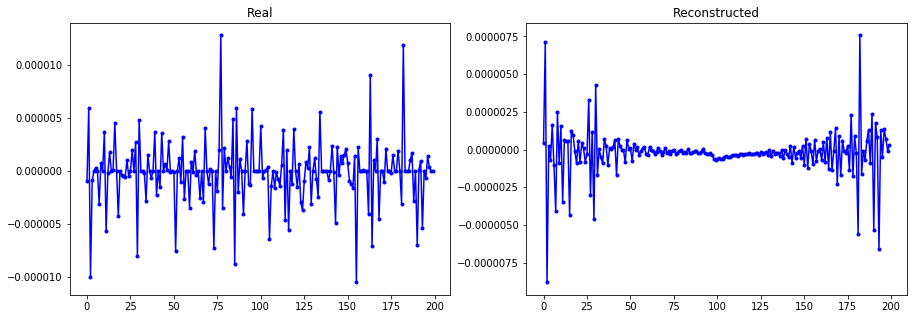

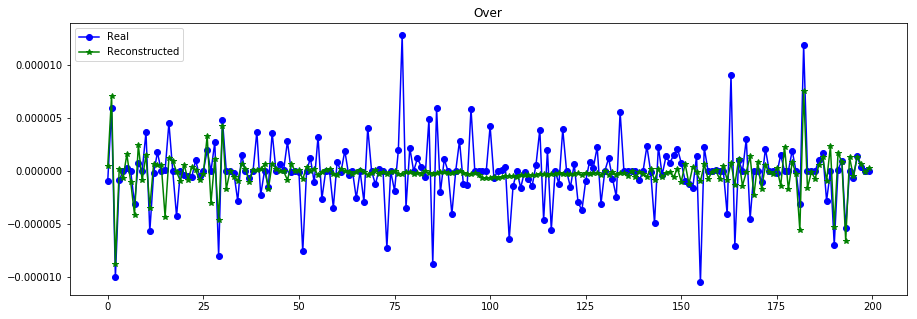

----------------------------------------------------------------


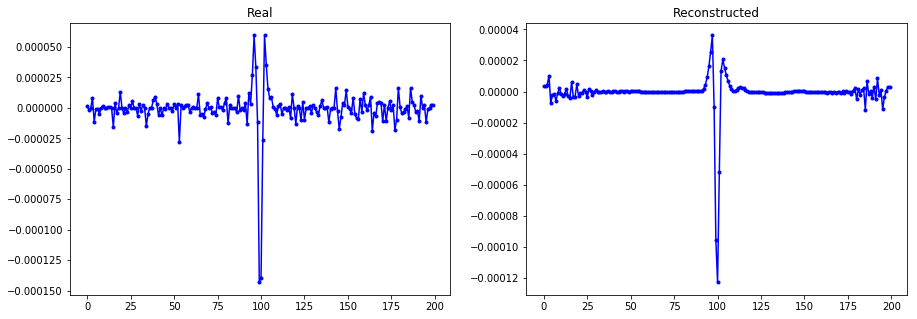

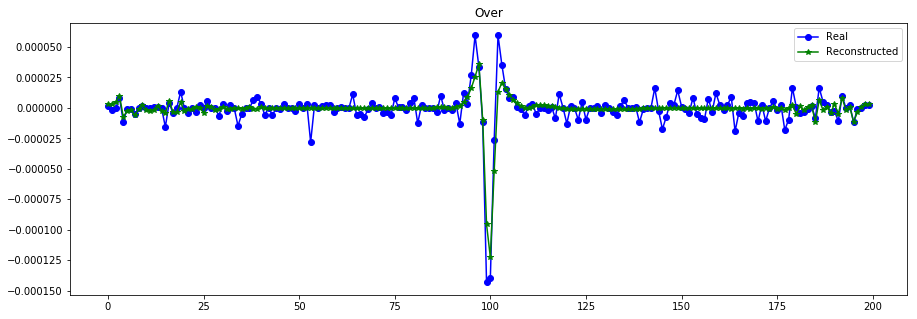

----------------------------------------------------------------


In [45]:
X_train_hat = vae.predict([X_train_t,X_train,S_train], batch_size=512)
print("Error scaled mse= ",scaled_MSE(X_train, X_train_hat, S_train))
plot_n_lc(X_train[:,:,0], X_train_hat, n= 15) #